
# <a id="a1"></a>  **0. Initialisation**

In [1]:
# include("../lce.jl/src/lca.jl")
include("./lca/src/lca.jl")
using .LCAModule


In [2]:
using Statistics
using CSV
using DataFrames
using XLSX
using Plots
using LinearAlgebra,SparseArrays,Symbolics
using JuMP, CPLEX
using JLD2


Import of python modules

In [3]:
using PyCall
using PyPlot
import Seaborn


In [4]:
respath="../Results/"


"../Results/"

## <a id="a1"></a>  **0.1 Theme**

In [5]:
PyPlot.svg(true)
tkr=pyimport("matplotlib.ticker")

fm=pyimport("matplotlib.font_manager")
font_prop = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=10, weight="bold");
rcParams = PyPlot.PyDict(PyPlot.matplotlib."rcParams")
rcParams["font.size"] = 8

font_prop_ticks = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=8);
font_prop_titles = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=11, weight="bold");
font_prop_labels = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=10);
font_prop_legend = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=6);


In [6]:
function set_color_palette(pal::Union{Symbol,Vector{String},Vector{Union{Symbol,String}}},number;rev=true,set_rcParam=false,show=false)
    function colorpal(i)
        return "#"*string(round(Int, red(i) * 255), base=16, pad=2) * string(round(Int, green(i) * 255), base=16, pad=2) * string(round(Int, blue(i) * 255), base=16, pad=2)
    end
    if show
        display(palette(pal,number, rev=rev))
    end

    magma_r=[colorpal(i) for i in palette(pal,number, rev=rev)]
    if set_rcParam
        println("Setting rcParams")
        rcParams["axes.prop_cycle"] = plt.cycler("color", magma_r)
    end
    return magma_r
end


set_color_palette (generic function with 1 method)

In [7]:
alternate_c="#".*["f94144","f3722c","f8961e","f9844a","f9c74f","90be6d","43aa8b","4d908e","577590","277da1"];


# **1. Goal and Scope Definition**

## **1.1. Goal**

The goal of this work is to evaluate whether hydrogen could be a viable solution with respect to the planetary boundaries. Taking a system perspective, most of the hydrogen will likely come from different sources and technologies. The goal of this LCA is thus to create a system that minimises the environmental impact accross all impact catergories. To do this, all hydrogen production routes need to be considered, as well as the use of hydrogen in different sectors.

In [8]:
Saving(p)=saveProject(p)
clc_tcm(p)=clearTcm!(project=p)


clc_tcm (generic function with 1 method)

In [9]:
years=[2025,2030,2035,2040,2045,2050];
SSPs = [1,2,5];
𝐏 = [initProject("Natcom",model="REMIND",RCP=1.9,SSP=ssp,year=yr,method="Planetary boundaries") for yr in years, ssp in SSPs];


┌ Warning: some parameters could not be resolved for type JLD2.ReconstructedMutable{LinearSolve.LinearCache{SparseMatrixCSC{Float64, Int64},Vector{Float64},Vector{Float64},SciMLBase.NullParameters,JLD2.ReconstructedStatic{Symbol("LinearSolve.DefaultLinearSolver"), (:alg,), Tuple{LinearSolve.DefaultAlgorithmChoice.T}},LinearSolve.DefaultLinearSolverInit{SparseArrays.UMFPACK.UmfpackLU{Float64, Int64},SparseArrays.SPQR.QRSparse{Float64, Int64},Nothing,Nothing,SparseSolver{Int64,Float64},LinearSolveSparseArraysExt.KLU.KLUFactorization{Float64, Int64},SparseArrays.UMFPACK.UmfpackLU{Float64, Int64},Nothing,SparseArrays.UMFPACK.UmfpackLU{Float64, Int64},Tuple{Nothing, Nothing},Nothing,Nothing,SparseArrays.CHOLMOD.Factor{Float64, Int64},Nothing,SparseArrays.CHOLMOD.Factor{Float64, Int64},SparseArrays.CHOLMOD.Factor{Float64, Int64},Tuple{LU{Float64, Matrix{Float64}, Vector{Int32}}, Base.RefValue{Int32}},Tuple{LU{Float64, Matrix{Float64}, Vector{Int64}}, Base.RefValue{Int64}},SparseArrays.SPQR.Q

Here we create some utility functions to help us with the LCA calculations.

In [10]:
𝐋(a,p)=lca(a(p),project=p)[end,2]
𝐋i(a,p)=Array(lca(a(p),project=p)[end,2:end])
𝐋x(a,m,p)=Array(lca(a(p,m),project=p)[end,2:end]);


we can create the plotting labels as follows:

In [11]:
labls=["$(rcp)-SSP$(ssp)" for ssp in SSPs, rcp in ["PkBudg500","PkBudg1150"]];


here is a quick LCA plot for any activity

In [12]:
"""
    function to plot the pLCA results of a given activity
"""
function plotlca(act)
    labls=["$(rcp)-SSP$(ssp)" for ssp in SSPs, rcp in ["PkBudg500","PkBudg1150"]];
    plot(years,(𝐋.(act,𝐏).*1e12),ylabel="pW m⁻²/kWh",labels=reshape(labls[:,1], 1, :))
    # plot!(years,(𝐋.(act,𝐏)[:,:]).*1e12,labels=reshape(labls[:,2], 1, :))
end;


## **1.2. Scope**

### **1.2.1. Locations**

As a rule of thumb from Bachmann et al. 2021, the order of locations for background system unit processes are as follows:

1. World
2. RoW

Naturally, whenever possible market groups can be created for a specific energy type provided it exists.


### **1.2.2. Temporal scope**

This prospective LCA is performed from 2025 to 2050. The year 2025 is chosen as the starting point as it is the year where the hydrogen economy is expected to take off. The year 2050 is chosen as the end point as it is the year where the hydrogen economy is expected to be fully mature an dit is conceicidently the year where the IPCC has set the target for net zero emissions.

# **2. Life cycle inventories**

## **2.1 Electricity production**

In this work, we use all background energy background systems processes without any modifification. These processes are listed below:

To create a super data structure for all models, we can use the Julia broadcasting feature. We simply need to call an activity $a$ as a function of a project $p$ which contains all the data for a given year and climate scenario. 

$$ p(model,RCP,SSP,year) \rightarrow a(p)$$

In [13]:
getAct("electricity production, hydro, run-of-river","RoW")|>lca


Row,Exchanges,Climate change-Energy imbalance,Climate change-CO2 Concentration,Ocean acidification-Carbonate ion concentration,Atmospheric aerosol loading-Aerosol Optical Depth (AOD),Freshwater use-Global,Biogeochemical flows-P,Biogeochemical flows-N,Stratospheric ozone depletion-Stratospheric O3 concentration,Land-system change-Global,Biosphere Integrity-Change in biosphere integrity
,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,"market for hydropower plant, run-of-river",9.65724e-16,7.23903e-14,2.23774e-16,5.18902e-17,3.81395e-14,1.9996e-14,1.3352e-14,4.33793e-19,3.68439e-17,1.04398e-15
2,market for waste mineral oil,4.795e-18,3.65357e-16,1.11656e-18,2.50003e-21,4.26415e-18,3.16555e-17,2.95309e-19,7.82682e-23,1.06713e-21,2.77288e-18
3,market for lubricating oil,4.22065e-18,2.99183e-16,1.01741e-18,3.28905e-20,1.47167e-16,1.04143e-16,2.34027e-17,5.13569e-21,7.41984e-19,1.30151e-17
4,"electricity production, hydro, run-of-river",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.38102e-15
5,TOTAL,9.7474e-16,7.30549e-14,2.25908e-16,5.19256e-17,3.82909e-14,2.01318e-14,1.33757e-14,4.39006e-19,3.75869e-17,4.44079e-15


### ***2.2.1 Electricity high voltage***

In [14]:
#biomass
wood_elect(p)=getAct("electricity production, wood, future","GLO",project=p);

#gas
gas_fired(p)=getAct("electricity production, at natural gas-fired combined cycle power plant, post, pipeline 200km, storage 1000m","World",project=p);

gas_fired_ccs_post(p)=getAct("electricity production, at natural gas-fired combined cycle power plant, post, pipeline 200km, storage 1000m","World",project=p);

gas_turbine(p)=getAct("electricity production, natural gas, 10MW","CH",project=p)

# Hard coal
hard_coal(p)=getAct("electricity production, hard coal","RoW",project=p)
hard_coal_supcrit(p)=getAct("electricity production, hard coal, supercritical","ZA",project=p);

# Oil
oil(p)=getAct("electricity production, oil","RoW",project=p);

# lignite
lignite_fired(p)=getAct("electricity production, at lignite-fired IGCC power plant","World",project=p);
lignite(p)=getAct("electricity production, lignite","RoW",project=p);


#peat
peat(p)=getAct("electricity production, peat","RoW",project=p);


#hydrogen
hydrogen_fired(p)=getAct("electricity production, from hydrogen-fired one gigawatt gas turbine","World",project=p);


#geothermal
geothermal(p)=getAct("electricity production, deep geothermal","RoW",project=p);

# hydro
hydro(p)=getAct("electricity production, hydro, run-of-river","RoW",project=p)
# hydro_non_alpine(p)=getAct("electricity production, hydro, reservoir, non-alpine region","RoW",project=p);

## nuclear
nuclear_pressure(p)=getAct("electricity production, nuclear, pressure water reactor","RoW",project=p)
nuclear_boiling(p)=getAct("electricity production, nuclear, boiling water reactor","RoW",project=p)
nuclear_pressure_heavy(p)=getAct("electricity production, nuclear, pressure water reactor, heavy water moderated","RoW",project=p);

# wind
wind(p)=getAct("electricity production, wind, >3MW turbine, onshore","RoW",project=p);

# solar
solar_thermal(p)=getAct("electricity production, solar thermal parabolic trough, 50 MW","RoW",project=p)


solar_thermal (generic function with 1 method)

In [15]:
set_color_palette(alternate_c[2:end-1],5,set_rcParam=true,show=false,rev=false)
rcParams["ytick.right"] = true
rcParams["xtick.top"] = true
rcParams["xtick.bottom"] = true
rcParams["ytick.direction"] = "in"
rcParams["ytick.minor.visible"] = true
rcParams["xtick.direction"] = "in"
rcParams["xtick.minor.visible"] = true
rcParams["figure.facecolor"] = "white"

fig, axs = plt.subplots(1,2,figsize=(8,8))
axs[1].plot(2025:5:2050,(𝐋.(wind,𝐏,2)[:,1,1]),label="wind",linewidth=2)
axs[1].plot(2025:5:2050,(𝐋.(solar_PV,𝐏,2)[:,1,1]),label="solar_pv",linewidth=2)
axs[1].plot(2025:5:2050,(𝐋.(nuclear_pressure,𝐏,2)[:,1,1]),label="nuclear_pwr",linewidth=2)
axs[1].plot(2025:5:2050,(𝐋.(hydro,𝐏,2)[:,1,1]),label="hydro",linewidth=2)
axs[1].plot(2025:5:2050,(𝐋.(geothermal,𝐏,2)[:,1,1]),label="geothermal",linewidth=2)

axs[2].plot(2025:5:2050,(𝐋.(wind,𝐏,11)[:,1,1]),label="wind",linewidth=2)
axs[2].plot(2025:5:2050,(𝐋.(solar_PV,𝐏,11)[:,1,1]),label="solar_pv",linewidth=2)
axs[2].plot(2025:5:2050,(𝐋.(nuclear_pressure,𝐏,11)[:,1,1]),label="nuclear",linewidth=2)
axs[2].plot(2025:5:2050,(𝐋.(hydro,𝐏,11)[:,1,1]),label="hydro",linewidth=2)
axs[2].plot(2025:5:2050,(𝐋.(geothermal,𝐏,11)[:,1,1]),label="geothermal",linewidth=2)

axs[1].set_xlim(2025, 2050)
axs[2].set_xlim(2025, 2050)
axs[1].set_ylabel("W/m²",fontproperties=font_prop_labels)
axs[2].set_ylabel("% change biosphere integrity",fontproperties=font_prop_labels)
axs[1].set_title("(a) Climate change",fontproperties=font_prop_labels)
axs[2].set_title("(b) Biopshere integrity",fontproperties=font_prop_labels)


plt.subplots_adjust(bottom=0.3)
plt.legend(loc="lower center", bbox_to_anchor=(-0.12, -0.12), frameon=false, prop=font_prop_labels, ncol=5)
plt.savefig(respath*"electricity comparison.svg",transparent=true,bbox_inches="tight")

display(plt.gcf())
plt.close("all")

rcParams["ytick.right"] = false
rcParams["xtick.top"] = false
rcParams["xtick.bottom"] = true
rcParams["ytick.direction"] = "out"
rcParams["ytick.minor.visible"] = false
rcParams["xtick.direction"] = "out"
rcParams["xtick.minor.visible"] = false
rcParams["figure.facecolor"] = "white"


Setting rcParams


LoadError: MethodError: no method matching 𝐋(::typeof(wind), ::Main.LCAModule.ProjectStruct, ::Int64)

[0mClosest candidates are:
[0m  𝐋(::Any, ::Any)
[0m[90m   @[39m [35mMain[39m [90m[4mIn[10]:1[24m[39m


In [16]:
elecHV(p)=newChoice([wood_elect(p),
                    gas_fired(p),gas_fired_ccs_post(p),
                    oil(p),
                    hard_coal(p),#,hard_coal_supcrit(p),
                    lignite_fired(p),lignite(p),
                    peat(p),
                    hydrogen_fired(p),
                    geothermal(p),
                    hydro(p),
                    nuclear_pressure(p),nuclear_boiling(p),nuclear_pressure_heavy(p),
                    wind(p),gas_turbine(p),
                    solar_thermal(p)
                    ],
                    name="electricity energy choice high voltage",
                    reference_flow="electricity",
                    label=:electricityHV,
                    stage=:Operation,
                    category=:level2,
                    unit="kilowatt hour",
                    location="World",
                    project=p)


elecHV (generic function with 1 method)

### ***2.1.2. Electricity medium voltage***

For medium voltage sources, we will select relevant production processes as well as the transformation of high voltage electricity to medium. On a global scale, we assume that this is acceptable. 

as a good way of moving foward, we will make use of the copy function `copyAct()` to duplicate background processes and then modify them to suit our needs. it can also be used in a pipeline with `|>CopyAct`.

In [17]:
η_transmission=0.95; # same as in ecoinvent


In [18]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
transmission_HV(p) = getAct("transmission network construction, electricity, high voltage","CH",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
N2O(p)=getBio("Dinitrogen monoxide","air, unspecified",project=p);
O3(p)=getBio("Ozone","air, unspecified",project=p);

#ACTIVITY MODEL 
#-----------------------------------------------------------------------------------------  
electricityHV_MV(p)=newAct!( 
                            name="electricity voltage transformation from high to medium voltage",
                            label=:electricityHV_MV, 
                            category=:operation,
                            stage=:level2,
                            reference_flow="electricity, medium voltage",
                            unit="kilowatt hour",
                            location="GLO",
                            amount=1.0*η_transmission,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #******************************************************  
                            techflows=Dict(
                                        transmission_HV(p) => 6.58209848825026e-09, #kilometer
                                        elecHV(p) => 1.0, #kilowatt hour
                                          ),
                            # BIOSPHERE FLOWS
                            #*********************************************************  
                            bioflows=Dict(
                                          N2O(p) => 5e-06, #kilogram
                                          O3(p) => 4.15772755242894e-06, #kilogram
                                          ))
                

electricityHV_MV (generic function with 1 method)

In [19]:
electricityHV_MV.(𝐏);


In [20]:
elecMV(p)=newChoice([electricityHV_MV(p)],
                name="electricity medium voltage choice",
                reference_flow="electricity, medium voltage",
                label=:electricityLV,
                stage=:Operation,
                category=:level2,
                unit="kilowatt hour",
                location="World",project=p)


elecMV (generic function with 1 method)

In [21]:
# clc_tcm.(𝐏);


In [22]:
elecMV.(𝐏);


In [23]:
# Plots.spy(TCM(𝐏[1,1,1])[:technosphere],color=:greens,markersize=3,legend=false)


### ***2.1.3 Low voltage sources***

In [24]:
solar_PV(p)=getAct("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW",project=p);


In [25]:
solar_PV.(𝐏);


In [26]:
#ACTIVITY MODEL 
#-----------------------------------------------------------------------------------------  
electricityMV_LV(p)=newAct!(
                        name="electricity voltage transformation from medium to low voltage",
                        label=:electricityMV_LV, 
                        category=:operation,
                        stage=:level2,
                        reference_flow="electricity, medium voltage",
                        unit="kilowatt hour",
                        location="World",
                        amount=1*η_transmission,
                        project=p, #it will be 1 unit anyways but it divides the flows
                        
                        #TECHNOSPHERE FLOWS
                        #*************************************************************************************  
                        techflows=Dict(
                                    transmission_HV(p) => 6.58209848825026e-09, #kilometer
                                    electricityHV_MV(p) => 1, #kilometer
                                      ),
                        # BIOSPHERE FLOWS
                        #*************************************************************************************  
                        bioflows=Dict(
                                      N2O(p) => 0, #kilogram
                                      ));
                

In [27]:
elecLV(p)=newChoice([solar_PV(p),electricityMV_LV(p)],
                name="electricity low voltage choice",
                reference_flow="electricity, low voltage",
                label=:electricityLV,
                stage=:Operation,
                category=:level2,
                unit="kilowatt hour",
                location="World",project=p)


elecLV (generic function with 1 method)

## **2.3 Carbon capture**

In [28]:
#Copy of the activity: carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with industrial steam heat, and grid electricity - World 

# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
tap_water_6575(p) = getAct("market for tap water", "RoW",project=p);
potassium_hydroxide_7956(p) = getAct("market for potassium hydroxide", "GLO",project=p);
limestone_10744(p) = getAct("market for limestone, crushed, for mill", "RoW",project=p);
limestone_residue_14224(p) = getAct("treatment of limestone residue, inert material landfill", "RoW",project=p);
spent_solvent_mixture_21007(p) = getAct("treatment of spent solvent mixture, hazardous waste incineration", "RoW",project=p);
direct_air_capture_system_21333(p) = getAct("direct air capture system, solvent-based, 1MtCO2", "RER",project=p);
direct_air_capture_system_21334(p) = getAct("treatment of direct air capture system, solvent-based, 1MtCO2", "RER",project=p);
electricity_23949(p) = getAct("market group for electricity, medium voltage", "EUR",project=p);
heat_26334(p) = getAct("market for heat, from steam, in chemical industry", "World",project=p);
carbon_dioxide_26945(p) = getAct("carbon dioxide compression, transport and storage", "World",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
# Carbon_dioxide_in_air_2747(p) = getBio("Carbon dioxide, in air", "natural resource, in air",project=p);
Carbon_dioxide_in_air_2747(p) = getBio("Carbon dioxide, non-fossil", "air, unspecified",project=p);
# REPLACE THE CATEGORY AND STAGE 
#-----------------------------------------------------------------------------------------  
DAC_steam(p)=newAct!(
                            name="carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with industrial steam heat, and grid electricity",
                            label=:DAC_steam,
                            category=:copied_default,
                            stage=:copied_default,
                            reference_flow="carbon dioxide, captured from atmosphere",
                            unit="kilogram",
                            location="World",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                                        tap_water_6575(p) => 3.437, #kilogram
                                        potassium_hydroxide_7956(p) => 0.004, #kilogram
                                        limestone_10744(p) => 0.0035, #kilogram
                                        limestone_residue_14224(p) => -0.0035, #kilogram
                                        spent_solvent_mixture_21007(p) => -0.004, #kilogram
                                        direct_air_capture_system_21333(p) => 5.0e-11, #unit
                                        direct_air_capture_system_21334(p) => -5.0e-11, #unit
                                        electricityMV_LV(p) => 0.345, #kilowatt hour
                                        heat_26334(p) => 6.28, #megajoule
                                        carbon_dioxide_26945(p) => 1.0, #kilogram
                                        ),
                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                                        Carbon_dioxide_in_air_2747(p) => -1.0, #kilogram
                                                                                    ))
                ;
                


In [29]:
#Copy of the activity: carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with heat pump heat, and grid electricity - World 

# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
tap_water_6575(p) = getAct("market for tap water", "RoW",project=p);
potassium_hydroxide_7956(p) = getAct("market for potassium hydroxide", "GLO",project=p);
limestone_10744(p) = getAct("market for limestone, crushed, for mill", "RoW",project=p);
limestone_residue_14224(p) = getAct("treatment of limestone residue, inert material landfill", "RoW",project=p);
electricity_20072(p) = getAct("market group for electricity, medium voltage", "GLO",project=p);
spent_solvent_mixture_21007(p) = getAct("treatment of spent solvent mixture, hazardous waste incineration", "RoW",project=p);
direct_air_capture_system_21333(p) = getAct("direct air capture system, solvent-based, 1MtCO2", "RER",project=p);
direct_air_capture_system_21334(p) = getAct("treatment of direct air capture system, solvent-based, 1MtCO2", "RER",project=p);
electricity_23949(p) = getAct("market group for electricity, medium voltage", "EUR",project=p);
carbon_dioxide_26945(p) = getAct("carbon dioxide compression, transport and storage", "World",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Carbon_dioxide_in_air_2747(p) = getBio("Carbon dioxide, non-fossil", "air, unspecified",project=p);
#getBio("Carbon dioxide, in air", "natural resource, in air",project=p);

# REPLACE THE CATEGORY AND STAGE 
#-----------------------------------------------------------------------------------------  
DAC_heatpump(p)=newAct!(
                            name="carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with heat pump heat, and grid electricity",
                            label=:DAC_heatpump,
                            category=:operation,
                            stage=:level1,
                            reference_flow="carbon dioxide, captured from atmosphere",
                            unit="kilogram",
                            location="World",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                                        tap_water_6575(p) => 3.437, #kilogram
                                        potassium_hydroxide_7956(p) => 0.004, #kilogram
                                        limestone_10744(p) => 0.0035, #kilogram
                                        limestone_residue_14224(p) => -0.0035, #kilogram
                                        # electricity_20072(p) => 0.6015325670498085, #kilowatt hour
                                        spent_solvent_mixture_21007(p) => -0.004, #kilogram
                                        direct_air_capture_system_21333(p) => 5.0e-11, #unit
                                        direct_air_capture_system_21334(p) => -5.0e-11, #unit
                                        electricityMV_LV(p) => 0.345 + 0.6015325670498085, #kilowatt hour
                                        carbon_dioxide_26945(p) => 1.0, #kilogram
),
                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                                        Carbon_dioxide_in_air_2747(p) => -1.0, #kilogram # not characterised so we
                                                                                    ))
                ;
                

In [30]:
DAC(p)=newChoice([DAC_heatpump(p),DAC_steam(p)],
                        name="Choice of carbon removal via direct air capture",
                        reference_flow="carbon dioxide, captured from atmosphere",
                        label=:DAC,
                        stage=:operation,
                        category=:level0,
                        unit="kg",
                        location="World",
                        project=p)


DAC (generic function with 1 method)

## **2.4 Hydrogen production**

### **2.2.1 Steam methane reforming**

#### **2.2.1.1 fossil methane no CCS**

In [31]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
molybdenum_trioxide_443(p) = getAct("market for molybdenum trioxide", "GLO",project=p);
chromium_oxide_458(p) = getAct("market for chromium oxide, flakes", "GLO",project=p);
quicklime_2029(p) = getAct("market for quicklime, milled, packed", "RoW",project=p);
chemical_factory_2368(p) = getAct("chemical factory construction, organics", "RoW",project=p);
copper_oxide_2580(p) = getAct("market for copper oxide", "GLO",project=p);
silica_sand_4471(p) = getAct("market for silica sand", "GLO",project=p);
electricity_5180(p) = getAct("market group for electricity, high voltage", "RER",project=p);
nickel_5598(p) = getAct("market for nickel, class 1", "GLO",project=p);
natural_gas_11706(p) = getAct("market for natural gas, high pressure", "RoW",project=p);
water_12449(p) = getAct("market for water, deionised", "RoW",project=p);
zinc_oxide_13058(p) = getAct("market for zinc oxide", "GLO",project=p);
liquid_storage_tank_14447(p) = getAct("market for liquid storage tank, chemicals, organics", "GLO",project=p);
portafer_15775(p) = getAct("market for portafer", "GLO",project=p);
aluminium_oxide_16596(p) = getAct("market for aluminium oxide, metallurgical", "RoW",project=p);
zeolite_17195(p) = getAct("market for zeolite, powder", "GLO",project=p);
magnesium_oxide_19528(p) = getAct("market for magnesium oxide", "GLO",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Particulate_Matter_um_127(p) = getBio("Particulate Matter, < 2.5 um", "air, unspecified",project=p);
Carbon_monoxide_fossil_153(p) = getBio("Carbon monoxide, fossil", "air, unspecified",project=p);
Sulfur_dioxide_507(p) = getBio("Sulfur dioxide", "air, unspecified",project=p);
Water_773(p) = getBio("Water", "water, unspecified",project=p);
Pentane_942(p) = getBio("Pentane", "air, unspecified",project=p);
Acetaldehyde_1042(p) = getBio("Acetaldehyde", "air, unspecified",project=p);
Propionic_acid_1175(p) = getBio("Propionic acid", "air, unspecified",project=p);
Carbon_dioxide_non_fossil_1252(p) = getBio("Carbon dioxide, non-fossil", "air, unspecified",project=p);
Carbon_dioxide_fossil_1780(p) = getBio("Carbon dioxide, fossil", "air, unspecified",project=p);
Nitrogen_oxides_1890(p) = getBio("Nitrogen oxides", "air, unspecified",project=p);
Benzo_a_pyrene_2768(p) = getBio("Benzo(a)pyrene", "air, unspecified",project=p);
Mercury_II_2851(p) = getBio("Mercury II", "air, unspecified",project=p);
Water_cooling_unspecified_natural_origin_2946(p) = getBio("Water, cooling, unspecified natural origin", "natural resource, in water",project=p);
Acetic_acid_3353(p) = getBio("Acetic acid", "air, unspecified",project=p);
Toluene_3473(p) = getBio("Toluene", "air, unspecified",project=p);
PAH_polycyclic_aromatic_hydrocarbons_3573(p) = getBio("PAH, polycyclic aromatic hydrocarbons", "air, unspecified",project=p);
Butane_3666(p) = getBio("Butane", "air, unspecified",project=p);
Formaldehyde_3857(p) = getBio("Formaldehyde", "air, unspecified",project=p);
Propane_4257(p) = getBio("Propane", "air, unspecified",project=p);
Methane_fossil_4384(p) = getBio("Methane, fossil", "air, unspecified",project=p);
Dinitrogen_monoxide_4391(p) = getBio("Dinitrogen monoxide", "air, unspecified",project=p);
Water_4539(p) = getBio("Water", "air, unspecified",project=p);
Benzene_4564(p) = getBio("Benzene", "air, unspecified",project=p);


In [32]:
#-----------------------------------------------------------------------------------------  
hydrogen_SMR(p)=newAct(
                        name="hydrogen production, steam methane reforming",
                        label=:SMR,
                        category=:operation,
                        stage=:level1,
                        reference_flow="hydrogen, gaseous, low pressure",
                        unit="kilogram",
                        location="World",
                        amount=1.0,
                        project=p,
                        #TECHNOSPHERE FLOWS
                        #*************************************************************************************  
                            techflows=Dict(
                                            molybdenum_trioxide_443(p) => 1.668e-5, #kilogram
                                            chromium_oxide_458(p) => 3.6e-5, #kilogram
                                            quicklime_2029(p) => 4.8e-5, #kilogram
                                            chemical_factory_2368(p) => 5.348319914762801e-10, #unit
                                            copper_oxide_2580(p) => 0.00036239999999999997, #kilogram
                                            # elecLV(p)=> 0, #kWh
                                            silica_sand_4471(p) => 1.1591999999999998e-5, #kilogram
                                            nickel_5598(p) => 0.00020292014459767036, #kilogram
                                            natural_gas_11706(p) => 4.369568777236091, #cubic meter
                                            water_12449(p) => 7.5384135551021, #kilogram
                                            zinc_oxide_13058(p) => 0.00037140000000000003, #kilogram
                                            liquid_storage_tank_14447(p) => 2.54628e-9, #unit
                                            portafer_15775(p) => 0.00031235999999999997, #kilogram
                                            aluminium_oxide_16596(p) => 0.0005327279999999999, #kilogram
                                            zeolite_17195(p) => 0.0008829015460672572, #kilogram
                                            magnesium_oxide_19528(p) => 2.796e-5, #kilogram
                            ),
                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                                            Particulate_Matter_um_127(p) => 6.135601701471486e-6, #kilogram
                                            Carbon_monoxide_fossil_153(p) => 6.44219235315761e-5, #kilogram
                                            Sulfur_dioxide_507(p) => 1.6872686102061067e-5, #kilogram
                                            Water_773(p) => 0.3712966050811322, #cubic meter
                                            Pentane_942(p) => 3.681419308079029e-5, #kilogram
                                            Acetaldehyde_1042(p) => 3.067655132745398e-8, #kilogram
                                            Propionic_acid_1175(p) => 6.135601701471484e-7, #kilogram
                                            Carbon_dioxide_non_fossil_1252(p) => 0.03519331946352898, #kilogram
                                            Carbon_dioxide_fossil_1780(p) => 8.887100467008121, #kilogram
                                            Nitrogen_oxides_1890(p) => 0.0005491236748165379, #kilogram
                                            Benzo_a_pyrene_2768(p) => 3.067655132745397e-10, #kilogram
                                            Mercury_II_2851(p) => 9.203256834216884e-10, #kilogram
                                            Water_cooling_unspecified_natural_origin_2946(p) => 0.38038158908113223, #cubic meter
                                            Acetic_acid_3353(p) => 4.601482699118097e-6, #kilogram
                                            Toluene_3473(p) => 6.135601701471486e-6, #kilogram
                                            PAH_polycyclic_aromatic_hydrocarbons_3573(p) => 3.0676551327453975e-7, #kilogram
                                            Butane_3666(p) => 2.1474168801179165e-5, #kilogram
                                            Formaldehyde_3857(p) => 3.067655132745398e-6, #kilogram
                                            Propane_4257(p) => 6.135601701471486e-6, #kilogram
                                            Methane_fossil_4384(p) => 6.135601701471486e-5, #kilogram
                                            Dinitrogen_monoxide_4391(p) => 3.067655132745398e-6, #kilogram
                                            Water_4539(p) => 0.009084983999999999, #cubic meter
                                            Benzene_4564(p) => 1.2270911966962279e-5, #kilogram
                                            ))
                                            ;
                

In [33]:
hydrogen_SMR.(𝐏);


#### **2.2.1.2 fossil methane, with CCS**

In [34]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
molybdenum_trioxide_443(p) = getAct("market for molybdenum trioxide", "GLO",project=p);
chromium_oxide_458(p) = getAct("market for chromium oxide, flakes", "GLO",project=p);
quicklime_2029(p) = getAct("market for quicklime, milled, packed", "RoW",project=p);
chemical_factory_2368(p) = getAct("chemical factory construction, organics", "RoW",project=p);
copper_oxide_2580(p) = getAct("market for copper oxide", "GLO",project=p);
silica_sand_4471(p) = getAct("market for silica sand", "GLO",project=p);
electricity_5180(p) = getAct("market group for electricity, high voltage", "RER",project=p);
nickel_5598(p) = getAct("market for nickel, class 1", "GLO",project=p);
natural_gas_11706(p) = getAct("market for natural gas, high pressure", "RoW",project=p);
water_12449(p) = getAct("market for water, deionised", "RoW",project=p);
zinc_oxide_13058(p) = getAct("market for zinc oxide", "GLO",project=p);
diethanolamine_13356(p) = getAct("market for diethanolamine", "GLO",project=p);
liquid_storage_tank_14447(p) = getAct("market for liquid storage tank, chemicals, organics", "GLO",project=p);
portafer_15775(p) = getAct("market for portafer", "GLO",project=p);
aluminium_oxide_16596(p) = getAct("market for aluminium oxide, metallurgical", "RoW",project=p);
zeolite_17195(p) = getAct("market for zeolite, powder", "GLO",project=p);
magnesium_oxide_19528(p) = getAct("market for magnesium oxide", "GLO",project=p);
carbon_dioxide_21240(p) = getAct("carbon dioxide, captured at hydrogen production plant, pre, pipeline 200km, storage 1000m", "RER",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Particulate_Matter_um_127(p) = getBio("Particulate Matter, < 2.5 um", "air, unspecified",project=p);
Carbon_monoxide_fossil_153(p) = getBio("Carbon monoxide, fossil", "air, unspecified",project=p);
Sulfur_dioxide_507(p) = getBio("Sulfur dioxide", "air, unspecified",project=p);
Water_773(p) = getBio("Water", "water, unspecified",project=p);
Pentane_942(p) = getBio("Pentane", "air, unspecified",project=p);
Acetaldehyde_1042(p) = getBio("Acetaldehyde", "air, unspecified",project=p);
Propionic_acid_1175(p) = getBio("Propionic acid", "air, unspecified",project=p);
Carbon_dioxide_non_fossil_1252(p) = getBio("Carbon dioxide, non-fossil", "air, unspecified",project=p);
Carbon_dioxide_fossil_1780(p) = getBio("Carbon dioxide, fossil", "air, unspecified",project=p);
Nitrogen_oxides_1890(p) = getBio("Nitrogen oxides", "air, unspecified",project=p);
Benzo_a_pyrene_2768(p) = getBio("Benzo(a)pyrene", "air, unspecified",project=p);
Mercury_II_2851(p) = getBio("Mercury II", "air, unspecified",project=p);
Water_cooling_unspecified_natural_origin_2946(p) = getBio("Water, cooling, unspecified natural origin", "natural resource, in water",project=p);
Acetic_acid_3353(p) = getBio("Acetic acid", "air, unspecified",project=p);
Toluene_3473(p) = getBio("Toluene", "air, unspecified",project=p);
PAH_polycyclic_aromatic_hydrocarbons_3573(p) = getBio("PAH, polycyclic aromatic hydrocarbons", "air, unspecified",project=p);
Butane_3666(p) = getBio("Butane", "air, unspecified",project=p);
Formaldehyde_3857(p) = getBio("Formaldehyde", "air, unspecified",project=p);
Propane_4257(p) = getBio("Propane", "air, unspecified",project=p);
Methane_fossil_4384(p) = getBio("Methane, fossil", "air, unspecified",project=p);
Dinitrogen_monoxide_4391(p) = getBio("Dinitrogen monoxide", "air, unspecified",project=p);
Water_4539(p) = getBio("Water", "air, unspecified",project=p);
Benzene_4564(p) = getBio("Benzene", "air, unspecified",project=p);


In [35]:
#-----------------------------------------------------------------------------------------  
hydrogen_SMRccs(p)=newAct(
                            name="hydrogen production, steam methane reforming, with CCS",
                            label=:hydrogen_SMRccs,
                            category=:operation,
                            stage=:level1,
                            reference_flow="hydrogen, gaseous, low pressure",
                            unit="kilogram",
                            location="World",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                            molybdenum_trioxide_443(p) => 1.668e-5, #kilogram
                            chromium_oxide_458(p) => 3.6e-5, #kilogram
                            quicklime_2029(p) => 4.8e-5, #kilogram
                            chemical_factory_2368(p) => 5.347707144163827e-10, #unit
                            copper_oxide_2580(p) => 0.00036239999999999997, #kilogram
                            silica_sand_4471(p) => 1.1591999999999998e-5, #kilogram
                            # electricity_5180(p) => 0.0, #kilowatt hour
                            # elecLV(p)=> 0, #kWh
                            nickel_5598(p) => 0.00020292014459767036, #kilogram
                            natural_gas_11706(p) => 4.30116813081211, #cubic meter
                            water_12449(p) => 7.537549859911257, #kilogram
                            zinc_oxide_13058(p) => 0.00037140000000000003, #kilogram
                            diethanolamine_13356(p) => 0.0002094796786665977, #kilogram
                            liquid_storage_tank_14447(p) => 2.54628e-9, #unit
                            portafer_15775(p) => 0.00031235999999999997, #kilogram
                            aluminium_oxide_16596(p) => 0.0005327279999999999, #kilogram
                            zeolite_17195(p) => 0.0008829015460672572, #kilogram
                            magnesium_oxide_19528(p) => 2.796e-5, #kilogram
                            carbon_dioxide_21240(p) => 6.161167019605815, #kilogram
                            ),
                                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                            Particulate_Matter_um_127(p) => 5.606868388943634e-6, #kilogram
                            Carbon_monoxide_fossil_153(p) => 5.887038699358714e-5, #kilogram
                            Sulfur_dioxide_507(p) => 1.541868832840411e-5, #kilogram
                            Water_773(p) => 0.3693603187961878, #cubic meter
                            Pentane_942(p) => 3.36417429768375e-5, #kilogram
                            Acetaldehyde_1042(p) => 2.803301033677894e-8, #kilogram
                            Propionic_acid_1175(p) => 5.606868388943633e-7, #kilogram
                            Carbon_dioxide_non_fossil_1252(p) => 0.03464240793796794, #kilogram
                            Carbon_dioxide_fossil_1780(p) => 2.575816265531609, #kilogram
                            Nitrogen_oxides_1890(p) => 0.000501803135821384, #kilogram
                            Benzo_a_pyrene_2768(p) => 2.8033010336778933e-10, #kilogram
                            Mercury_II_2851(p) => 8.410169422621528e-10, #kilogram
                            Water_cooling_unspecified_natural_origin_2946(p) => 0.3803380077961878, #cubic meter
                            Acetic_acid_3353(p) => 4.20495155051684e-6, #kilogram
                            Toluene_3473(p) => 5.606868388943634e-6, #kilogram
                            PAH_polycyclic_aromatic_hydrocarbons_3573(p) => 2.8033010336778935e-7, #kilogram
                            Butane_3666(p) => 1.962363987892095e-5, #kilogram
                            Formaldehyde_3857(p) => 2.8033010336778938e-6, #kilogram
                            Propane_4257(p) => 5.606868388943634e-6, #kilogram
                            Methane_fossil_4384(p) => 5.6068683889436346e-5, #kilogram
                            Dinitrogen_monoxide_4391(p) => 2.8033010336778938e-6, #kilogram
                            Water_4539(p) => 0.010977689, #cubic meter
                            Benzene_4564(p) => 1.1213470456299422e-5, #kilogram
                            ))
;
                

In [36]:
hydrogen_SMRccs.(𝐏);


#### **2.2.1.3 from biomethane, with CCS**

In [37]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
molybdenum_trioxide_443(p) = getAct("market for molybdenum trioxide", "GLO",project=p);
chromium_oxide_458(p) = getAct("market for chromium oxide, flakes", "GLO",project=p);
quicklime_2029(p) = getAct("market for quicklime, milled, packed", "RoW",project=p);
chemical_factory_2368(p) = getAct("chemical factory construction, organics", "RoW",project=p);
copper_oxide_2580(p) = getAct("market for copper oxide", "GLO",project=p);
silica_sand_4471(p) = getAct("market for silica sand", "GLO",project=p);
electricity_5180(p) = getAct("market group for electricity, high voltage", "RER",project=p);
nickel_5598(p) = getAct("market for nickel, class 1", "GLO",project=p);
water_12449(p) = getAct("market for water, deionised", "RoW",project=p);
zinc_oxide_13058(p) = getAct("market for zinc oxide", "GLO",project=p);
diethanolamine_13356(p) = getAct("market for diethanolamine", "GLO",project=p);
liquid_storage_tank_14447(p) = getAct("market for liquid storage tank, chemicals, organics", "GLO",project=p);
portafer_15775(p) = getAct("market for portafer", "GLO",project=p);
aluminium_oxide_16596(p) = getAct("market for aluminium oxide, metallurgical", "RoW",project=p);
zeolite_17195(p) = getAct("market for zeolite, powder", "GLO",project=p);
magnesium_oxide_19528(p) = getAct("market for magnesium oxide", "GLO",project=p);
carbon_dioxide_21240(p) = getAct("carbon dioxide, captured at hydrogen production plant, pre, pipeline 200km, storage 1000m", "RER",project=p);
biomethane_25000(p) = getAct("biomethane production, from biogas upgrading, using amine scrubbing", "World",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Particulate_Matter_um_127(p) = getBio("Particulate Matter, < 2.5 um", "air, unspecified",project=p);
Carbon_monoxide_fossil_153(p) = getBio("Carbon monoxide, fossil", "air, unspecified",project=p);
Sulfur_dioxide_507(p) = getBio("Sulfur dioxide", "air, unspecified",project=p);
Water_773(p) = getBio("Water", "water, unspecified",project=p);
Pentane_942(p) = getBio("Pentane", "air, unspecified",project=p);
Acetaldehyde_1042(p) = getBio("Acetaldehyde", "air, unspecified",project=p);
Propionic_acid_1175(p) = getBio("Propionic acid", "air, unspecified",project=p);
Carbon_dioxide_non_fossil_1252(p) = getBio("Carbon dioxide, non-fossil", "air, unspecified",project=p);
Nitrogen_oxides_1890(p) = getBio("Nitrogen oxides", "air, unspecified",project=p);
Benzo_a_pyrene_2768(p) = getBio("Benzo(a)pyrene", "air, unspecified",project=p);
Mercury_II_2851(p) = getBio("Mercury II", "air, unspecified",project=p);
Water_cooling_unspecified_natural_origin_2946(p) = getBio("Water, cooling, unspecified natural origin", "natural resource, in water",project=p);
Acetic_acid_3353(p) = getBio("Acetic acid", "air, unspecified",project=p);
Toluene_3473(p) = getBio("Toluene", "air, unspecified",project=p);
PAH_polycyclic_aromatic_hydrocarbons_3573(p) = getBio("PAH, polycyclic aromatic hydrocarbons", "air, unspecified",project=p);
Butane_3666(p) = getBio("Butane", "air, unspecified",project=p);
Formaldehyde_3857(p) = getBio("Formaldehyde", "air, unspecified",project=p);
Propane_4257(p) = getBio("Propane", "air, unspecified",project=p);
Methane_fossil_4384(p) = getBio("Methane, fossil", "air, unspecified",project=p);
Dinitrogen_monoxide_4391(p) = getBio("Dinitrogen monoxide", "air, unspecified",project=p);
Water_4539(p) = getBio("Water", "air, unspecified",project=p);
Benzene_4564(p) = getBio("Benzene", "air, unspecified",project=p);


In [38]:
#-----------------------------------------------------------------------------------------  
hydrogen_bSMRccs(p)=newAct(
                            name="hydrogen production, steam methane reforming, from biomethane, with CCS",
                            label=:hydrogen_bSMRccs,
                            category=:operation,
                            stage=:level1,
                            reference_flow="hydrogen, gaseous, low pressure",
                            unit="kilogram",
                            location="World",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                            molybdenum_trioxide_443(p) => 1.668e-5, #kilogram
                            chromium_oxide_458(p) => 3.6e-5, #kilogram
                            quicklime_2029(p) => 4.8e-5, #kilogram
                            chemical_factory_2368(p) => 5.348339353784591e-10, #unit
                            copper_oxide_2580(p) => 0.00036239999999999997, #kilogram
                            silica_sand_4471(p) => 1.1591999999999998e-5, #kilogram
                            # electricity_5180(p) => 0.0, #kilowatt hour
                            # elecLV(p)=> 0, #kWh
                            nickel_5598(p) => 0.00020292014459767036, #kilogram
                            water_12449(p) => 7.5384409542457, #kilogram
                            zinc_oxide_13058(p) => 0.00037140000000000003, #kilogram
                            diethanolamine_13356(p) => 0.00020908949384107795, #kilogram
                            liquid_storage_tank_14447(p) => 2.54628e-9, #unit
                            portafer_15775(p) => 0.00031235999999999997, #kilogram
                            aluminium_oxide_16596(p) => 0.0005327279999999999, #kilogram
                            zeolite_17195(p) => 0.0008829015460672572, #kilogram
                            magnesium_oxide_19528(p) => 2.796e-5, #kilogram
                            carbon_dioxide_21240(p) => 6.149690995325822, #kilogram
                            biomethane_25000(p) => 3.2430526231187016, #kilogram
                            ),
                                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                            Particulate_Matter_um_127(p) => 5.718117856586435e-6, #kilogram
                            Carbon_monoxide_fossil_153(p) => 6.0038472056164506e-5, #kilogram
                            Sulfur_dioxide_507(p) => 1.5724620401228882e-5, #kilogram
                            Water_773(p) => 0.3693982206443318, #cubic meter
                            Pentane_942(p) => 3.430925035120878e-5, #kilogram
                            Acetaldehyde_1042(p) => 2.858923125370675e-8, #kilogram
                            Propionic_acid_1175(p) => 5.718117856586434e-7, #kilogram
                            Carbon_dioxide_non_fossil_1252(p) => 2.5884448839268264, #kilogram
                            Nitrogen_oxides_1890(p) => 0.0005117597333102247, #kilogram
                            Benzo_a_pyrene_2768(p) => 2.858923125370674e-10, #kilogram
                            Mercury_II_2851(p) => 8.57704098195711e-10, #kilogram
                            Water_cooling_unspecified_natural_origin_2946(p) => 0.3803759096443318, #cubic meter
                            Acetic_acid_3353(p) => 4.2883846880560116e-6, #kilogram
                            Toluene_3473(p) => 5.718117856586435e-6, #kilogram
                            PAH_polycyclic_aromatic_hydrocarbons_3573(p) => 2.858923125370675e-7, #kilogram
                            Butane_3666(p) => 2.0013005089284896e-5, #kilogram
                            Formaldehyde_3857(p) => 2.8589231253706745e-6, #kilogram
                            Propane_4257(p) => 5.718117856586435e-6, #kilogram
                            Methane_fossil_4384(p) => 5.718117856586435e-5, #kilogram
                            Dinitrogen_monoxide_4391(p) => 2.8589231253706745e-6, #kilogram
                            Water_4539(p) => 0.010977689, #cubic meter
                            Benzene_4564(p) => 1.1435964107327784e-5, #kilogram
                            ))
                            ;
                


In [39]:
hydrogen_bSMRccs.(𝐏);


#### **2.2.1.4 from biomethane, no CCS**

In [40]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
molybdenum_trioxide_443(p) = getAct("market for molybdenum trioxide", "GLO",project=p);
chromium_oxide_458(p) = getAct("market for chromium oxide, flakes", "GLO",project=p);
quicklime_2029(p) = getAct("market for quicklime, milled, packed", "RoW",project=p);
chemical_factory_2368(p) = getAct("chemical factory construction, organics", "RoW",project=p);
copper_oxide_2580(p) = getAct("market for copper oxide", "GLO",project=p);
silica_sand_4471(p) = getAct("market for silica sand", "GLO",project=p);
electricity_5180(p) = getAct("market group for electricity, high voltage", "RER",project=p);
nickel_5598(p) = getAct("market for nickel, class 1", "GLO",project=p);
water_12449(p) = getAct("market for water, deionised", "RoW",project=p);
zinc_oxide_13058(p) = getAct("market for zinc oxide", "GLO",project=p);
liquid_storage_tank_14447(p) = getAct("market for liquid storage tank, chemicals, organics", "GLO",project=p);
portafer_15775(p) = getAct("market for portafer", "GLO",project=p);
aluminium_oxide_16596(p) = getAct("market for aluminium oxide, metallurgical", "RoW",project=p);
zeolite_17195(p) = getAct("market for zeolite, powder", "GLO",project=p);
magnesium_oxide_19528(p) = getAct("market for magnesium oxide", "GLO",project=p);
biomethane_25000(p) = getAct("biomethane production, from biogas upgrading, using amine scrubbing", "World",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Particulate_Matter_um_127(p) = getBio("Particulate Matter, < 2.5 um", "air, unspecified",project=p);
Carbon_monoxide_fossil_153(p) = getBio("Carbon monoxide, fossil", "air, unspecified",project=p);
Sulfur_dioxide_507(p) = getBio("Sulfur dioxide", "air, unspecified",project=p);
Water_773(p) = getBio("Water", "water, unspecified",project=p);
Pentane_942(p) = getBio("Pentane", "air, unspecified",project=p);
Acetaldehyde_1042(p) = getBio("Acetaldehyde", "air, unspecified",project=p);
Propionic_acid_1175(p) = getBio("Propionic acid", "air, unspecified",project=p);
Carbon_dioxide_non_fossil_1252(p) = getBio("Carbon dioxide, non-fossil", "air, unspecified",project=p);
Nitrogen_oxides_1890(p) = getBio("Nitrogen oxides", "air, unspecified",project=p);
Benzo_a_pyrene_2768(p) = getBio("Benzo(a)pyrene", "air, unspecified",project=p);
Mercury_II_2851(p) = getBio("Mercury II", "air, unspecified",project=p);
Water_cooling_unspecified_natural_origin_2946(p) = getBio("Water, cooling, unspecified natural origin", "natural resource, in water",project=p);
Acetic_acid_3353(p) = getBio("Acetic acid", "air, unspecified",project=p);
Toluene_3473(p) = getBio("Toluene", "air, unspecified",project=p);
PAH_polycyclic_aromatic_hydrocarbons_3573(p) = getBio("PAH, polycyclic aromatic hydrocarbons", "air, unspecified",project=p);
Butane_3666(p) = getBio("Butane", "air, unspecified",project=p);
Formaldehyde_3857(p) = getBio("Formaldehyde", "air, unspecified",project=p);
Propane_4257(p) = getBio("Propane", "air, unspecified",project=p);
Methane_fossil_4384(p) = getBio("Methane, fossil", "air, unspecified",project=p);
Dinitrogen_monoxide_4391(p) = getBio("Dinitrogen monoxide", "air, unspecified",project=p);
Water_4539(p) = getBio("Water", "air, unspecified",project=p);
Benzene_4564(p) = getBio("Benzene", "air, unspecified",project=p);


In [41]:
#-----------------------------------------------------------------------------------------  
hydrogen_bSMR(p)=newAct(
                        name="hydrogen production, steam methane reforming, from biomethane",
                        label=:hydrogen_bSMR,
                        category=:operation,
                        stage=:level1,
                        reference_flow="hydrogen, gaseous, low pressure",
                        unit="kilogram",
                        location="World",
                        amount=1.0,
                        project=p,
                        
                        #TECHNOSPHERE FLOWS
                        #*************************************************************************************  
                        techflows=Dict(
                                        molybdenum_trioxide_443(p) => 1.668e-5, #kilogram
                                        chromium_oxide_458(p) => 3.6e-5, #kilogram
                                        quicklime_2029(p) => 4.8e-5, #kilogram
                                        chemical_factory_2368(p) => 5.348319914762801e-10, #unit
                                        copper_oxide_2580(p) => 0.00036239999999999997, #kilogram
                                        silica_sand_4471(p) => 1.1591999999999998e-5, #kilogram
                                        # electricity_5180(p) => 0.0, #kilowatt hour
                                        # elecLV(p)=> 0, #kWh
                                        nickel_5598(p) => 0.00020292014459767033, #kilogram
                                        water_12449(p) => 7.5384135551021, #kilogram
                                        zinc_oxide_13058(p) => 0.00037140000000000003, #kilogram
                                        liquid_storage_tank_14447(p) => 2.54628e-9, #unit
                                        portafer_15775(p) => 0.00031235999999999997, #kilogram
                                        aluminium_oxide_16596(p) => 0.0005327279999999999, #kilogram
                                        zeolite_17195(p) => 0.0008829015460672572, #kilogram
                                        magnesium_oxide_19528(p) => 2.796e-5, #kilogram
                                        biomethane_25000(p) => 3.3088031787310634, #kilogram
                                        ),
                        # BIOSPHERE FLOWS
                        #*************************************************************************************  
                        bioflows=Dict(
                                        Particulate_Matter_um_127(p) => 6.342889789140465e-6, #kilogram
                                        Carbon_monoxide_fossil_153(p) => 6.65983844530233e-5, #kilogram
                                        Sulfur_dioxide_507(p) => 1.7442720958641864e-5, #kilogram
                                        Water_773(p) => 0.37128954313377893, #cubic meter
                                        Pentane_942(p) => 3.80579412988279e-5, #kilogram
                                        Acetaldehyde_1042(p) => 3.1712942535739586e-8, #kilogram
                                        Propionic_acid_1175(p) => 6.342889789140465e-7, #kilogram
                                        Carbon_dioxide_non_fossil_1252(p) => 8.768328423637318, #kilogram
                                        Nitrogen_oxides_1890(p) => 0.0005676755303613958, #kilogram
                                        Benzo_a_pyrene_2768(p) => 3.1712942535739584e-10, #kilogram
                                        Mercury_II_2851(p) => 9.514184042714423e-10, #kilogram
                                        Water_cooling_unspecified_natural_origin_2946(p) => 0.38037452713377895, #cubic meter
                                        Acetic_acid_3353(p) => 4.756941380360937e-6, #kilogram
                                        Toluene_3473(p) => 6.342889789140465e-6, #kilogram
                                        PAH_polycyclic_aromatic_hydrocarbons_3573(p) => 3.171294253573958e-7, #kilogram
                                        Butane_3666(p) => 2.2199662339002805e-5, #kilogram
                                        Formaldehyde_3857(p) => 3.1712942535739587e-6, #kilogram
                                        Propane_4257(p) => 6.342889789140465e-6, #kilogram
                                        Methane_fossil_4384(p) => 6.342889789140466e-5, #kilogram
                                        Dinitrogen_monoxide_4391(p) => 3.1712942535739587e-6, #kilogram
                                        Water_4539(p) => 0.009084983999999999, #cubic meter
                                        Benzene_4564(p) => 1.268547829628838e-5, #kilogram
                        ))
;
                

In [42]:
hydrogen_bSMR.(𝐏);


### **2.2.2 coal gasification**

#### **2.2.2.1 coal gasification without CCS**

In [43]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
chemical_factory_2368(p) = getAct("chemical factory construction, organics", "RoW",project=p);
lime_3471(p) = getAct("lime production, milled, packed", "RoW",project=p);
waste_gypsum_4790(p) = getAct("treatment of waste gypsum, inert material landfill", "RoW",project=p);
hard_coal_ash_5704(p) = getAct("treatment of hard coal ash, residual material landfill", "RoW",project=p);
liquid_storage_tank_7911(p) = getAct("liquid storage tank production, chemicals, organics", "RoW",project=p);
transport_15367(p) = getAct("market for transport, freight train", "RoW",project=p);
wastewater_16102(p) = getAct("treatment of wastewater, average, wastewater treatment", "RoW",project=p);
transport_16209(p) = getAct("transport, freight, inland waterways, barge", "RoW",project=p);
aluminium_oxide_16596(p) = getAct("market for aluminium oxide, metallurgical", "RoW",project=p);
hard_coal_18049(p) = getAct("market for hard coal", "RoW",project=p);
water_18927(p) = getAct("water production, deionised", "RoW",project=p);
electricity_20072(p) = getAct("market group for electricity, medium voltage", "GLO",project=p);
methanol_22098(p) = getAct("methanol production, coal gasification", "RoW",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Carbon_dioxide_fossil_2463(p) = getBio("Carbon dioxide, fossil", "air, non-urban air or from high stacks",project=p);
Ammonia_3201(p) = getBio("Ammonia", "air, non-urban air or from high stacks",project=p);
Hydrochloric_acid_4291(p) = getBio("Hydrochloric acid", "air, non-urban air or from high stacks",project=p);

# REPLACE THE CATEGORY AND STAGE 
#-----------------------------------------------------------------------------------------  
hydrogen_coal(p)=newAct!(
                            name="hydrogen production, coal gasification",
                            label=:hydrogen_coal,
                            category=:operation,
                            stage=:level1,
                            reference_flow="hydrogen, gaseous, low pressure",
                            unit="kilogram",
                            location="World",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                            chemical_factory_2368(p) => 6.997199999999999e-10, #unit
                            lime_3471(p) => 0.16752, #kilogram
                            waste_gypsum_4790(p) => -0.22848, #kilogram
                            hard_coal_ash_5704(p) => -0.50532, #kilogram
                            liquid_storage_tank_7911(p) => 3.9744e-9, #unit
                            transport_15367(p) => 1.1397599999999999, #ton kilometer
                            wastewater_16102(p) => -0.03607, #cubic meter
                            transport_16209(p) => 0.42432000000000003, #ton kilometer
                            aluminium_oxide_16596(p) => 0.00098, #kilogram
                            hard_coal_18049(p) => 6.771, #kilogram
                            water_18927(p) => 10.5, #kilogram
                            # electricity_20072(p) => 4.39, #kilowatt hour
                            electricityHV_MV(p)=> 4.39, #kWh
                            methanol_22098(p) => 0.00444, #kilogram
                            ),
                                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                            Carbon_dioxide_fossil_2463(p) => 17.77, #kilogram
                            Ammonia_3201(p) => 0.0069264, #kilogram
                            Hydrochloric_acid_4291(p) => 0.0103752, #kilogram
                            ))
;
                

In [44]:
spy(TCM(𝐏[1,1,1])[:technosphere],color=:greens,markersize=3,legend=false)


LoadError: UndefVarError: `TCM` not defined

In [45]:
hydrogen_coal.(𝐏);



#### **2.2.2.2 coal gasification, with CCS**

In [46]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
chemical_factory_2368(p) = getAct("chemical factory construction, organics", "RoW",project=p);
lime_3471(p) = getAct("lime production, milled, packed", "RoW",project=p);
nitrogen_3593(p) = getAct("market for nitrogen, liquid", "RoW",project=p);
waste_gypsum_4790(p) = getAct("treatment of waste gypsum, inert material landfill", "RoW",project=p);
hard_coal_ash_5704(p) = getAct("treatment of hard coal ash, residual material landfill", "RoW",project=p);
liquid_storage_tank_7911(p) = getAct("liquid storage tank production, chemicals, organics", "RoW",project=p);
transport_15367(p) = getAct("market for transport, freight train", "RoW",project=p);
wastewater_16102(p) = getAct("treatment of wastewater, average, wastewater treatment", "RoW",project=p);
transport_16209(p) = getAct("transport, freight, inland waterways, barge", "RoW",project=p);
aluminium_oxide_16596(p) = getAct("market for aluminium oxide, metallurgical", "RoW",project=p);
hard_coal_18049(p) = getAct("market for hard coal", "RoW",project=p);
water_18927(p) = getAct("water production, deionised", "RoW",project=p);
ammonia_18963(p) = getAct("market for ammonia, anhydrous, liquid", "RoW",project=p);
electricity_20072(p) = getAct("market group for electricity, medium voltage", "GLO",project=p);
carbon_dioxide_21240(p) = getAct("carbon dioxide, captured at hydrogen production plant, pre, pipeline 200km, storage 1000m", "RER",project=p);
methanol_22098(p) = getAct("methanol production, coal gasification", "RoW",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Carbon_dioxide_fossil_2463(p) = getBio("Carbon dioxide, fossil", "air, non-urban air or from high stacks",project=p);
Water_cooling_unspecified_natural_origin_2946(p) = getBio("Water, cooling, unspecified natural origin", "natural resource, in water",project=p);
Ammonia_3201(p) = getBio("Ammonia", "air, non-urban air or from high stacks",project=p);
Hydrochloric_acid_4291(p) = getBio("Hydrochloric acid", "air, non-urban air or from high stacks",project=p);


In [47]:
#-----------------------------------------------------------------------------------------  
hydrogen_coalccs(p)=newAct!(
                            name="hydrogen production, coal gasification, with CCS",
                            label=:hydrogen_coalccs,
                            category=:operation,
                            stage=:level1,
                            reference_flow="hydrogen, gaseous, low pressure",
                            unit="kilogram",
                            location="World",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                            chemical_factory_2368(p) => 6.997199999999999e-10, #unit
                            lime_3471(p) => 0.16752, #kilogram
                            nitrogen_3593(p) => 0.0096, #kilogram
                            waste_gypsum_4790(p) => -0.22848, #kilogram
                            hard_coal_ash_5704(p) => -0.50532, #kilogram
                            liquid_storage_tank_7911(p) => 3.9744e-9, #unit
                            transport_15367(p) => 1.1397599999999999, #ton kilometer
                            wastewater_16102(p) => -0.050208754, #cubic meter
                            transport_16209(p) => 0.42432000000000003, #ton kilometer
                            aluminium_oxide_16596(p) => 0.00098, #kilogram
                            hard_coal_18049(p) => 6.771, #kilogram
                            water_18927(p) => 10.24, #kilogram
                            ammonia_18963(p) => 5.7e-5, #kilogram
                            # electricity_20072(p) => 7.75, #kilowatt hour
                            elecLV(p)=> 7.75, #kWh
                            carbon_dioxide_21240(p) => 15.29, #kilogram
                            methanol_22098(p) => 0.00444, #kilogram
                            ),
                                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                            Carbon_dioxide_fossil_2463(p) => 2.48, #kilogram
                            Water_cooling_unspecified_natural_origin_2946(p) => 0.032, #cubic meter
                            Ammonia_3201(p) => 0.0069264, #kilogram
                            Hydrochloric_acid_4291(p) => 0.0103752, #kilogram
                            ))
                                            ;
                

In [48]:
# hydrogen_coalccs.(𝐏); 


### **2.2.3 Biomass gasification**


In [49]:
#Copy of the activity: hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gasifier, with CCS, at gasification plant - World 

# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
electricity_5949(p) = getAct("market group for electricity, low voltage", "ENTSO-E",project=p);
water_12449(p) = getAct("market for water, deionised", "RoW",project=p);
synthetic_gas_factory_13162(p) = getAct("synthetic gas factory construction", "RoW",project=p);
wood_chips_13315(p) = getAct("market for wood chips, wet, measured as dry mass", "RoW",project=p);
liquid_storage_tank_14447(p) = getAct("market for liquid storage tank, chemicals, organics", "GLO",project=p);
wastewater_16102(p) = getAct("treatment of wastewater, average, wastewater treatment", "RoW",project=p);
carbon_dioxide_21240(p) = getAct("carbon dioxide, captured at hydrogen production plant, pre, pipeline 200km, storage 1000m", "RER",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Carbon_dioxide_non_fossil_1252(p) = getBio("Carbon dioxide, non-fossil", "air, unspecified",project=p);

# REPLACE THE CATEGORY AND STAGE 
#-----------------------------------------------------------------------------------------  
hydrogen_BioCccs(p)=newAct!(
                            name="hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gasifier, with CCS, at gasification plant",
                            label=:hydrogen_BioCccs,
                            category=:operation,
                            stage=:level1,
                            reference_flow="hydrogen, gaseous, 25 bar",
                            unit="kilogram",
                            location="World",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                                        electricity_5949(p) => 0.0, #kilowatt hour
                                        water_12449(p) => 15.92628, #kilogram
                                        synthetic_gas_factory_13162(p) => 5.348319914762801e-10, #unit
                                        wood_chips_13315(p) => 11.6966, #kilogram
                                        liquid_storage_tank_14447(p) => 2.54628e-9, #unit
                                        wastewater_16102(p) => -0.012439, #cubic meter
                                        carbon_dioxide_21240(p) => 19.58557, #kilogram
),
                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                                        Carbon_dioxide_non_fossil_1252(p) => 1.5237, #kilogram
                                                                                    ))
                ;
hydrogen_BioCccs.(𝐏);


LoadError: KeyError: key :TCM_downstream_keys_row not found

In [50]:
getAct("carbon dioxide, captured at hydrogen production plant, pre, pipeline 200km, storage 1000m", "RER")


HTML{String}("<table style=\"border-collapse: collapse; width: 100%; font-family: Arial, sans-serif; font-size: 12px;\">\n    <thead>\n        <!-- Top heading row with dark grey background and white bold font -->\n        <tr style=\"background-color: #415a77; font-weight: bold; color: White;\">\n            <td rowspan=\"2\" style=\"border: 1px solid #ddd; padding: 7px; text-align: center;\">\n                Activity key: <br><br>  21240\n            </td>\n            <td style=\"border: 1px solid #ddd; padding: 7px; text-align: center;\">\n                Activity name\n            </td>\n            <td colspan=\"3\" style=\"border: 1px solid #ddd; padding: 7px; text-align: center;\">\n                carbon dioxide, captured at hydrogen production plant, pre, pipeline 200km, storage 1000m, RER<br>\n            </td>\n        </tr>\n        <tr style=\"background-color: #415a77; font-weight: bold; color: white;\">\n            <td style=\"border: 1px solid #ddd; padding: 7px; text-align: center;\">\n                Reference flow\n            </td>\n            <td colspan=\"3\" style=\"border: 1px solid #ddd; padding: 7px; text-align: center;\">\n                1.0 kilogram of carbon dioxide, captured at hydrogen production plant, pre, pipeline 200km, storage 1000m\n            </td>\n        </tr>\n        <td colspan=\"5\" style=\"border: 1px solid #ddd; padding: 7px; background-color: #8d99ae; font-weight: bold; color: White; text-align: center;\">Technosphere Exchanges</td>\n        <!-- Column names row with centered text -->\n        \n    </thead>\n    <tbody>\n        <tr style=\"font-weight: bold;background-color: #8d99ae; padding: 7px; color: White; text-align: center\">\n            <td style=\"border: 1px solid #ddd; background-color: #8d99ae; font-weight: bold; color: White; text-align: center;\">Exchange keys</td>\n\n            <td style=\"border: 1px solid #ddd;\">Reference flow</td>\n            <td style=\"border: 1px solid #ddd;\">Activity</td>\n            <td style=\"border: 1px solid #ddd;\">Amount</td>\n            <td style=\"border: 1px solid #ddd;\">Unit</td>\n        </tr>\n    <tr style=\"font-size: 11px; padding: 3px;\">\n        <td style=\"border: 1px solid #ddd; \">1396</td>\n        <td style=\"border: 1px solid #ddd;\">gas turbine, 10MW electrical</td>\n        <td style=\"border: 1px solid #ddd;\">market for gas turbine, 10MW electrical - GLO</td>\n        <td style=\"border: 1px solid #ddd;text-align: right\">9.86e-9</td>\n        <td style=\"border: 1px solid #ddd;text-align: left\">unit</td>\n    </tr>\n    <tr style=\"font-size: 11px; padding: 3px;\">\n        <td style=\"border: 1px solid #ddd; \">1620</td>\n        <td style=\"border: 1px solid #ddd;\">pump, 40W</td>\n        <td style=\"border: 1px solid #ddd;\">market for pump, 40W - GLO</td>\n        <td style=\"border: 1px solid #ddd;text-align: right\">9.86e-9</td>\n        <td style=\"border: 1px solid #ddd;text-align: left\">unit</td>\n    </tr>\n    <tr style=\"font-size: 11px; padding: 3px;\">\n        <td style=\"border: 1px solid #ddd; \">4438</td>\n        <td style=\"border: 1px solid #ddd;\">absorption chiller, 100kW</td>\n        <td style=\"border: 1px solid #ddd;\">market for absorption chiller, 100kW - GLO</td>\n        <td style=\"border: 1px solid #ddd;text-align: right\">1.97e-8</td>\n        <td style=\"border: 1px solid #ddd;text-align: left\">unit</td>\n    </tr>\n    <tr style=\"font-size: 11px; padding: 3px;\">\n        <td style=\"border: 1px solid #ddd; \">11344</td>\n        <td style=\"border: 1px solid #ddd;\">spent solvent mixture</td>\n        <td style=\"border: 1px solid #ddd;\">treatment of spent solvent mixture, hazardous waste incineration - CH</td>\n        <td style=\"border: 1px solid #ddd;text-align: right\">-7.0e-6</td>\n        <td style=\"border: 1px solid #ddd;text-align: left\">kilogram</td>\n    </tr>\n    <tr style=\"font-size: 11px; padding: 3px;\">\n        <td style=\"border: 1

In [51]:
getAct(21317)


HTML{String}("<table style=\"border-collapse: collapse; width: 100%; font-family: Arial, sans-serif; font-size: 12px;\">\n    <thead>\n        <!-- Top heading row with dark grey background and white bold font -->\n        <tr style=\"background-color: #415a77; font-weight: bold; color: White;\">\n            <td rowspan=\"2\" style=\"border: 1px solid #ddd; padding: 7px; text-align: center;\">\n                Activity key: <br><br>  21317\n            </td>\n            <td style=\"border: 1px solid #ddd; padding: 7px; text-align: center;\">\n                Activity name\n            </td>\n            <td colspan=\"3\" style=\"border: 1px solid #ddd; padding: 7px; text-align: center;\">\n                carbon dioxide storage at hydrogen production plant, pre, pipeline 200km, storage 1000m, RER<br>\n            </td>\n        </tr>\n        <tr style=\"background-color: #415a77; font-weight: bold; color: white;\">\n            <td style=\"border: 1px solid #ddd; padding: 7px; text-align: center;\">\n                Reference flow\n            </td>\n            <td colspan=\"3\" style=\"border: 1px solid #ddd; padding: 7px; text-align: center;\">\n                1.0 kilogram of carbon dioxide storage at hydrogen production plant, pre, pipeline 200km, storage 1000m\n            </td>\n        </tr>\n        <td colspan=\"5\" style=\"border: 1px solid #ddd; padding: 7px; background-color: #8d99ae; font-weight: bold; color: White; text-align: center;\">Technosphere Exchanges</td>\n        <!-- Column names row with centered text -->\n        \n    </thead>\n    <tbody>\n        <tr style=\"font-weight: bold;background-color: #8d99ae; padding: 7px; color: White; text-align: center\">\n            <td style=\"border: 1px solid #ddd; background-color: #8d99ae; font-weight: bold; color: White; text-align: center;\">Exchange keys</td>\n\n            <td style=\"border: 1px solid #ddd;\">Reference flow</td>\n            <td style=\"border: 1px solid #ddd;\">Activity</td>\n            <td style=\"border: 1px solid #ddd;\">Amount</td>\n            <td style=\"border: 1px solid #ddd;\">Unit</td>\n        </tr>\n    <tr style=\"font-size: 11px; padding: 3px;\">\n        <td style=\"border: 1px solid #ddd; \">1396</td>\n        <td style=\"border: 1px solid #ddd;\">gas turbine, 10MW electrical</td>\n        <td style=\"border: 1px solid #ddd;\">market for gas turbine, 10MW electrical - GLO</td>\n        <td style=\"border: 1px solid #ddd;text-align: right\">2.54e-11</td>\n        <td style=\"border: 1px solid #ddd;text-align: left\">unit</td>\n    </tr>\n    <tr style=\"font-size: 11px; padding: 3px;\">\n        <td style=\"border: 1px solid #ddd; \">21318</td>\n        <td style=\"border: 1px solid #ddd;\">transport, pipeline, supercritical carbon dioxide, 200km without recompression</td>\n        <td style=\"border: 1px solid #ddd;\">transport, pipeline, supercritical carbon dioxide, 200km without recompression - RER</td>\n        <td style=\"border: 1px solid #ddd;text-align: right\">0.00152</td>\n        <td style=\"border: 1px solid #ddd;text-align: left\">ton kilometer</td>\n    </tr>\n    <tr style=\"font-size: 11px; padding: 3px;\">\n        <td style=\"border: 1px solid #ddd; \">21320</td>\n        <td style=\"border: 1px solid #ddd;\">drilling, deep borehole</td>\n        <td style=\"border: 1px solid #ddd;\">drilling, deep borehole - RER</td>\n        <td style=\"border: 1px solid #ddd;text-align: right\">1.69e-8</td>\n        <td style=\"border: 1px solid #ddd;text-align: left\">meter</td>\n    </tr>\n    <tr style=\"font-size: 11px; padding: 3px;\">\n        <td style=\"border: 1px solid #ddd; \">24039</td>\n        <td style=\"border: 1px solid #ddd;\">electricity, medium voltage</td>\n        <td style=\"border: 1px solid #ddd;\">market group for electricity, medium voltage - EUR</td>\n        <td style=\"border: 1px solid #ddd;text-align: right\">0.00948</td>\n        <td style=\"border: 1px solid #ddd;text-align: left\

In [52]:
# getAct("hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gasifier, with CCS, at gasification plant","World")|>lca


### **2.2.4 Methane pyrolysis**

In [53]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
palladium_1283(p) = getAct("market for palladium", "GLO",project=p);
tap_water_6575(p) = getAct("market for tap water", "RoW",project=p);
copper_11632(p) = getAct("market for copper, cathode", "GLO",project=p);
natural_gas_11706(p) = getAct("market for natural gas, high pressure", "RoW",project=p);
air_compressor_12767(p) = getAct("market for air compressor, screw-type compressor, 4kW", "GLO",project=p);
tin_18369(p) = getAct("market for tin", "GLO",project=p);
silicon_carbide_19631(p) = getAct("market for silicon carbide", "GLO",project=p);
electricity_23998(p) = getAct("market group for electricity, low voltage", "EUR",project=p);
steel_27543(p) = getAct("market for steel, chromium steel 18/8", "World",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Water_773(p) = getBio("Water", "water, unspecified",project=p);
Carbon_dioxide_fossil_1780(p) = getBio("Carbon dioxide, fossil", "air, unspecified",project=p);
Water_4539(p) = getBio("Water", "air, unspecified",project=p);


In [54]:
𝐋(a,p,cat=2)=lca(a(p),project=p)[end,cat]
𝐋i(a,p)=Array(lca(a(p),project=p)[end,2:end])
𝐋x(a,m,p)=Array(lca(a(p,m),project=p)[end,2:end]);


In [55]:
hydrogen_pyro(p)=getAct("hydrogen production, gaseous, 100 bar, from methane pyrolysis","World",project=p)

hydrogen_smr(p)=getAct("hydrogen production, steam methane reforming","World",project=p)


hydrogen_smr (generic function with 1 method)

In [56]:
# cata=11
# plotlca(wind,cata)
# plotlca!(solar_PV,cata)


In [57]:
# function plotlca(act,cat=2)
#     labls=["$(rcp)-SSP$(ssp)" for ssp in SSPs, rcp in ["PkBudg500","PkBudg1150"]];
#     p=Plots.plot(years[2:7],(𝐋.(act,𝐏,cat)[:,:,1]),labels=reshape(labls[:,1], 1, :))
#     return p
# end;
# function plotlca!(act,cat)
#     labls=["$(rcp)-SSP$(ssp)" for ssp in SSPs, rcp in ["PkBudg500","PkBudg1150"]];
#     p=Plots.plot!(years[2:7],(𝐋.(act,𝐏,cat)[:,:,1]),labels=reshape(labls[:,1], 1, :))
#     return p
# end;


In [58]:
#-----------------------------------------------------------------------------------------  
hydrogen_pyrolysis(p)=newAct!(
                            name="hydrogen production, gaseous, 100 bar, from methane pyrolysis",
                            label=:hydrogen_pyrolysis,
                            category=:operation,
                            stage=:level1,
                            reference_flow="hydrogen, gaseous, 100 bar",
                            unit="kilogram",
                            location="World",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                                        palladium_1283(p) => 1.1e-5, #kilogram
                                        tap_water_6575(p) => 7.751652902472759, #kilogram
                                        copper_11632(p) => 7.33e-6, #kilogram
                                        natural_gas_11706(p) => 5.67, #cubic meter
                                        air_compressor_12767(p) => 6.36e-8, #unit
                                        tin_18369(p) => 0.0336, #kilogram
                                        silicon_carbide_19631(p) => 4.2e-6, #kilogram
                                        elecLV(p)=> 9.593629829793018, #kWh
                                        steel_27543(p) => 0.003097, #kilogram
                            ),
                                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                                        Water_773(p) => 0.006976487612225483, #cubic meter
                                        Carbon_dioxide_fossil_1780(p) => 2.3984074574482546, #kilogram
                                        Water_4539(p) => 0.0007751652902472758, #cubic meter
                                        ))
;
                

### **2.2.5 Electrolysis**

#### **2.2.5.1 alkaline electrolysis**

In [59]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
potassium_hydroxide_7956(p) = getAct("market for potassium hydroxide", "GLO",project=p);
water_17817(p) = getAct("market for water, deionised", "CH",project=p);
electrolyzer_22043(p) = getAct("electrolyzer production, 1MWe, AEC, Stack", "RER",project=p);
used_fuel_cell_stack_22044(p) = getAct("treatment of fuel cell stack, 1MWe, AEC", "RER",project=p);
electrolyzer_22045(p) = getAct("electrolyzer production, 1MWe, AEC, Balance of Plant", "RER",project=p);
used_fuel_cell_balance_of_plant_22046(p) = getAct("treatment of fuel cell balance of plant, 1MWe, AEC", "RER",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Transformation_to_industrial_area_1035(p) = getBio("Transformation, to industrial area", "natural resource, land",project=p);
Transformation_from_industrial_area_1122(p) = getBio("Transformation, from industrial area", "natural resource, land",project=p);
Occupation_industrial_area_4354(p) = getBio("Occupation, industrial area", "natural resource, land",project=p);
Oxygen_4449(p) = getBio("Oxygen", "air, unspecified",project=p);


In [60]:
#-----------------------------------------------------------------------------------------  
hydrogen_AE(p)=newAct!(
                            name="hydrogen production, gaseous, 20 bar, from AEC electrolysis, from choice electricity",
                            label=:hydrogen_AE,
                            category=:operation,
                            stage=:level1,
                            reference_flow="hydrogen, gaseous, 20 bar",
                            unit="kilogram",
                            location="NEU",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                                            potassium_hydroxide_7956(p) => 0.0037, #kilogram
                                            water_17817(p) => 14.0, #kilogram
                                            electrolyzer_22043(p) => 9.391435011269722e-7, #unit
                                            used_fuel_cell_stack_22044(p) => -9.391435011269722e-7, #unit
                                            electrolyzer_22045(p) => 2.3478587528174306e-7, #unit
                                            used_fuel_cell_balance_of_plant_22046(p) => -2.3478587528174306e-7, #unit
                                            elecLV(p) => 48.5, #kilowatt hour
                                    ),
                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                                        Transformation_to_industrial_area_1035(p) => 2.8174305033809167e-5, #square meter
                                        Transformation_from_industrial_area_1122(p) => 2.8174305033809167e-5, #square meter
                                        Occupation_industrial_area_4354(p) => 0.0007747933884297521, #square meter-year
                                        Oxygen_4449(p) => 8.0, #kilogram
                                        ))
                                        ;


#### **2.2.5.2 proton exchange membrane electrolysis**


##### **2.2.5.2.2 Electrolyser stack**

In [61]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
tetrafluoroethylene_2946(p) = getAct("market for tetrafluoroethylene", "GLO",project=p);
sheet_rolling_5631(p) = getAct("market for sheet rolling, chromium steel", "GLO",project=p);
steel_8727(p) = getAct("market for steel, chromium steel 18/8, hot rolled", "GLO",project=p);
copper_11632(p) = getAct("market for copper, cathode", "GLO",project=p);
platinum_12068(p) = getAct("market for platinum", "GLO",project=p);
sheet_rolling_14363(p) = getAct("market for sheet rolling, aluminium", "GLO",project=p);
synthetic_rubber_16219(p) = getAct("market for synthetic rubber", "GLO",project=p);
sheet_rolling_16747(p) = getAct("market for sheet rolling, copper", "GLO",project=p);
titanium_16891(p) = getAct("market for titanium", "GLO",project=p);
carbon_black_17372(p) = getAct("market for carbon black", "GLO",project=p);
aluminium_17463(p) = getAct("market for aluminium, wrought alloy", "GLO",project=p);
iridium_22034(p) = getAct("platinum group metal, extraction and refinery operations", "ZA",project=p);


In [62]:
#-----------------------------------------------------------------------------------------  
electrolyzer_22038(p)=newAct!(
                            name="electrolyzer production, 1MWe, PEM, Stack",
                            label=:electrolyzer_22038,
                            category=:copied_default,
                            stage=:copied_default,
                            reference_flow="electrolyzer, 1MWe, PEM, Stack",
                            unit="unit",
                            location="RER",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                                        tetrafluoroethylene_2946(p) => 16.0, #kilogram
                                        sheet_rolling_5631(p) => 100.0, #kilogram
                                        steel_8727(p) => 100.0, #kilogram
                                        copper_11632(p) => 4.5, #kilogram
                                        platinum_12068(p) => 0.75, #kilogram
                                        sheet_rolling_14363(p) => 27.0, #kilogram
                                        synthetic_rubber_16219(p) => 4.8, #kilogram
                                        sheet_rolling_16747(p) => 4.5, #kilogram
                                        titanium_16891(p) => 528.0, #kilogram
                                        carbon_black_17372(p) => 9.0, #kilogram
                                        aluminium_17463(p) => 27.0, #kilogram
                                        iridium_22034(p) => 0.8, #kilogram
                                        electricityHV_MV(p) => 103890.7681, #kilowatt hour
                            ),
                                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                                        #*-*-**-*-* -> no biosphere flows, null amount of oxygen registered
                                        getBio("Oxygen","air, unspecified") => 0 ))


electrolyzer_22038 (generic function with 1 method)

In [63]:
# clc_tcm.(𝐏);
electrolyzer_22038.(𝐏);


LoadError: KeyError: key :TCM_downstream_keys_row not found

In [64]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
water_12449(p) = getAct("market for water, deionised", "RoW",project=p);
used_fuel_cell_stack_22039(p) = getAct("treatment of fuel cell stack, 1MWe, PEM", "RER",project=p);
electrolyzer_22040(p) = getAct("electrolyzer production, 1MWe, PEM, Balance of Plant", "RER",project=p);
used_fuel_cell_balance_of_plant_22041(p) = getAct("treatment of fuel cell balance of plant, 1MWe, PEM", "RER",project=p);
# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Transformation_to_industrial_area_1035(p) = getBio("Transformation, to industrial area", "natural resource, land",project=p);
Transformation_from_industrial_area_1122(p) = getBio("Transformation, from industrial area", "natural resource, land",project=p);
Occupation_industrial_area_4354(p) = getBio("Occupation, industrial area", "natural resource, land",project=p);
Oxygen_4449(p) = getBio("Oxygen", "air, unspecified",project=p);


In [65]:
#-----------------------------------------------------------------------------------------  
hydrogen_PEM(p)=newAct!(
                            name="hydrogen production, gaseous, 30 bar, from PEM electrolysis, from choice electricity",
                            label=:hydrogen_PEM,
                            category=:operation,
                            stage=:level1,
                            reference_flow="hydrogen, gaseous, 30 bar",
                            unit="kilogram",
                            location="World",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                                            water_12449(p) => 14.0, #kilogram
                                            electrolyzer_22038(p) => 1.349892008639309e-6, #unit
                                            used_fuel_cell_stack_22039(p) => -1.349892008639309e-6, #unit
                                            electrolyzer_22040(p) => 3.3747300215982723e-7, #unit
                                            used_fuel_cell_balance_of_plant_22041(p) => -3.3747300215982723e-7, #unit
                                            elecLV(p) => 52, #kilowatt hour:  this is directly updated in the TCM
                                            ),
                                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                                        Transformation_to_industrial_area_1035(p) => 2.547921166306695e-5, #square meter
                                        Transformation_from_industrial_area_1122(p) => 2.547921166306695e-5, #square meter
                                        Occupation_industrial_area_4354(p) => 0.0005095842332613391, #square meter-year
                                        Oxygen_4449(p) => 6.71111111111111, #kilogram
                            ));
                

#### **2.2.5.3 Solid oxide electrolysis**

In [66]:
# THECHNOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
water_12500(p) = getAct("market for water, deionised", "Europe without Switzerland",project=p);
electrolyzer_22049(p) = getAct("electrolyzer production, 1MWe, SOEC, Stack", "RER",project=p);
used_fuel_cell_stack_22050(p) = getAct("treatment of fuel cell stack, 1MWe, SOEC", "RER",project=p);
electrolyzer_22051(p) = getAct("electrolyzer production, 1MWe, SOEC, Balance of Plant", "RER",project=p);
used_fuel_cell_balance_of_plant_22052(p) = getAct("treatment of fuel cell balance of plant, 1MWe, SOEC", "RER",project=p);
electricity_24018(p) = getAct("market group for electricity, low voltage", "NEU",project=p);
heat_26329(p) = getAct("market for heat, from steam, in chemical industry", "NEU",project=p);

# BIOSPHERE FLOWS
#-----------------------------------------------------------------------------------------  
Transformation_to_industrial_area_1035(p) = getBio("Transformation, to industrial area", "natural resource, land",project=p);
Transformation_from_industrial_area_1122(p) = getBio("Transformation, from industrial area", "natural resource, land",project=p);
Occupation_industrial_area_4354(p) = getBio("Occupation, industrial area", "natural resource, land",project=p);
Oxygen_4449(p) = getBio("Oxygen", "air, unspecified",project=p);


In [67]:
#-----------------------------------------------------------------------------------------  
hydrogen_SOEC_steam(p)=newAct!(
                            name="hydrogen production, gaseous, 1 bar, from SOEC electrolysis, with steam input, from choice electricity",
                            label=:hydrogen_SOEC_steam,
                            category=:operation,
                            stage=:level1,
                            reference_flow="hydrogen, gaseous, 1 bar",
                            unit="kilogram",
                            location="CH",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                            water_12500(p) => 14.0, #kilogram
                            electrolyzer_22049(p) => 2.11864406779661e-6, #unit
                            used_fuel_cell_stack_22050(p) => -2.11864406779661e-6, #unit
                            electrolyzer_22051(p) => 2.6483050847457627e-7, #unit
                            used_fuel_cell_balance_of_plant_22052(p) => -2.6483050847457627e-7, #unit
                            elecLV(p) => 39.0, #kilowatt hour
                            heat_26329(p) => 16.0, #megajoule
                            ),
                                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                            Transformation_to_industrial_area_1035(p) => 1.3241525423728813e-5, #square meter
                            Transformation_from_industrial_area_1122(p) => 1.3241525423728813e-5, #square meter
                            Occupation_industrial_area_4354(p) => 0.00026483050847457627, #square meter-year
                            Oxygen_4449(p) => 8.0, #kilogram
                            ));


In [68]:
#-----------------------------------------------------------------------------------------  
hydrogen_SOEC_elec(p)=newAct!(
                            name="hydrogen production, gaseous, 1 bar, from SOEC electrolysis, from choice electricity",
                            label=:hydrogen_SOEC_elec,
                            category=:operation,
                            stage=:level1,
                            reference_flow="hydrogen, gaseous, 1 bar",
                            unit="kilogram",
                            location="NEU",
                            amount=1.0,
                            project=p,
                            
                            #TECHNOSPHERE FLOWS
                            #*************************************************************************************  
                            techflows=Dict(
                                            water_12500(p) => 14.0, #kilogram
                                            electrolyzer_22049(p) => 2.11864406779661e-6, #unit
                                            used_fuel_cell_stack_22050(p) => -2.11864406779661e-6, #unit
                                            electrolyzer_22051(p) => 2.6483050847457627e-7, #unit
                                            used_fuel_cell_balance_of_plant_22052(p) => -2.6483050847457627e-7, #unit
                                            elecLV(p) => 40.6, #kilowatt hour
                                            heat_26329(p) => 0.0, #megajoule
                                            ),
                                            # BIOSPHERE FLOWS
                            #*************************************************************************************  
                            bioflows=Dict(
                                        Transformation_to_industrial_area_1035(p) => 5.296610169491526e-6, #square meter
                                        Transformation_from_industrial_area_1122(p) => 5.296610169491526e-6, #square meter
                                        Occupation_industrial_area_4354(p) => 0.0001059322033898305, #square meter-year
                                        Oxygen_4449(p) => 8.0, #kilogram
                                        ));


## ***2.5. Final Choice model***

In [69]:
model(p)=newChoice([hydrogen_SMR(p),hydrogen_SMRccs(p),hydrogen_bSMR(p),hydrogen_bSMRccs(p),
                    hydrogen_coal(p),hydrogen_coalccs(p),hydrogen_BioCccs(p),
                    hydrogen_pyrolysis(p),
                    hydrogen_AE(p),hydrogen_PEM(p),hydrogen_SOEC_steam(p),hydrogen_SOEC_elec(p)],
                        name="hydrogen production choice",
                        reference_flow="hydrogen, gaseous",
                        label=:hydrogen,
                        stage=:operation,
                        category=:level0,
                        unit="kg",
                        location="World",
                        project=p)


model (generic function with 1 method)

# **3. Absolute Environmental Sustainability Assessment**

## **3.1. Environmental space allocation**

### ***3.1.0 Allocation factor***

From the full AR6 model, we can extract the full matrix of allocation principles. We do not share the original data to respect the license agreement. However, the data is freely available from from the IIASA website.

In [70]:
@load "../Source data/02_results/2_02_allocated_space/aSOS.jld" 𝛀ᴾᵇ δ𝛀ᴾᵇ 𝛀ᴰ δ𝛀ᴰ


4-element Vector{Symbol}:
 :𝛀ᴾᵇ
 :δ𝛀ᴾᵇ
 :𝛀ᴰ
 :δ𝛀ᴰ

In [71]:
𝛀ᴾᵇ
# @load "../versionning/v1/Results/AR6/SAP.jld"
# full_mat=SAP_exp


10×6 Matrix{Float64}:
 9.4748e-14   7.39262e-14  4.99725e-14  3.26415e-14  2.33417e-14  2.09041e-14
 6.82186e-12  5.32269e-12  3.59802e-12  2.35019e-12  1.6806e-12   1.50509e-12
 6.51866e-14  5.08612e-14  3.43811e-14  2.24574e-14  1.60591e-14  1.4382e-14
 6.63236e-15  5.17483e-15  3.49807e-15  2.28491e-15  1.63392e-15  1.46329e-15
 3.78992e-10  2.95705e-10  1.9989e-10   1.30566e-10  9.33668e-11  8.36163e-11
 1.04223e-12  8.13188e-13  5.49697e-13  3.59057e-13  2.56759e-13  2.29945e-13
 5.87438e-12  4.58342e-12  3.09829e-12  2.02377e-12  1.44719e-12  1.29605e-12
 1.32647e-12  1.03497e-12  6.99615e-13  4.56981e-13  3.26784e-13  2.92657e-13
 2.3687e-12   1.84815e-12  1.24931e-12  8.16038e-13  5.83542e-13  5.22602e-13
 9.4748e-13   7.39262e-13  4.99725e-13  3.26415e-13  2.33417e-13  2.09041e-13

we perform some stastics on the data set

In [72]:
median_vals = mapslices(x -> median(x), full_mat; dims=1)|>vec
q1_5 = mapslices(x -> quantile(x, 0.05), full_mat; dims=1)|>vec
q3_95 = mapslices(x -> quantile(x, 0.95), full_mat; dims=1)|>vec


LoadError: UndefVarError: `full_mat` not defined

In [73]:
AP_lower=ones(3,6).*q1_5'
AP_med =ones(3,6).*median_vals'
AP_upper =ones(3,6).*q3_95'


LoadError: UndefVarError: `q1_5` not defined

### ***3.1.1 SSPx-PkBudg500 data***

In [74]:
scenario_path="../Source data/01_input/IAM scenarios/"



"../Source data/01_input/IAM scenarios/"

In [75]:
SSP1 = CSV.read(scenario_path*"remind_SSP1-PkBudg500.csv", DataFrame)
SSP2 = CSV.read(scenario_path*"remind_SSP2-PkBudg500.csv", DataFrame)
SSP5 = CSV.read(scenario_path*"remind_SSP5-PkBudg500.csv", DataFrame)
SSP=vcat(SSP1, SSP2, SSP5);
years = parse.(Int, names(SSP)[findfirst(==("2020"), names(SSP)):findfirst(==("2100"), names(SSP))]);


In [76]:
function get_vals(Variable::String;Region::String="World",
    SSP=SSP,start_year::String="2020",end_year::String="2100",show::Bool=false)
    
    SSPa=filter(row -> row[:Variable] == Variable && row[:Region] == Region, SSP)
    global Scenario=reshape(SSPa[:,"Scenario"], 1, :)
    global Scenario[2]="SSP2-PkBudg500"
    global Unit=SSPa[1,"Unit"]
    start_idx = findfirst(==(start_year), names(SSPa))
    end_idx = findfirst(==(end_year), names(SSP))
    SSPb=SSPa[:, start_idx:end_idx]

    if show
        p=Plots.plot(years[2:7],Matrix(SSPb[1:3,2:7])',
            labels=reshape(Scenario, 1, :),
            ylabel=Unit,mark=(:circle, 5, 0.5))
        display(p)
    end
    return SSPb[1:3,2:7]
end


get_vals (generic function with 1 method)

In [77]:
𝛈_electrolysis_raw=get_vals("Tech|Hydrogen|Electricity|Efficiency")
𝛈_electrolysis=Matrix(𝛈_electrolysis_raw./𝛈_electrolysis_raw[:,1])';

SEH2=get_vals("SE|Hydrogen",show=false);
EJ_kWh= 1/3.6e-12 #kWh/EJ
LHVH2=33.33 # kWh/kgH2
EJH2_to_kgH2=EJ_kWh/LHVH2 # kWh/EJ * kgH2/kWh = kgH2/EJ

SEH2=get_vals("SE|Hydrogen") #EJ
TotalkgH2=SEH2.*EJH2_to_kgH2 # EJ * kgH2/EJ = kgH2

TotalMtH2=TotalkgH2.*1e-9 # mass H2 to MtH2
TotalGtH2=TotalkgH2.*1e-12 # mass H2 to GtH2
;


In [78]:
# median_vals = mapslices(x -> median(x), full_mat; dims=1)|>vec
# min_vals = mapslices(x -> minimum(x), full_mat; dims=1)|>vec
# max_vals = mapslices(x -> maximum(x), full_mat; dims=1)|>vec
# q1_5 = mapslices(x -> quantile(x, 0.05), full_mat; dims=1)|>vec
# q3_95 = mapslices(x -> quantile(x, 0.95), full_mat; dims=1)|>vec
# q1_25 = mapslices(x -> quantile(x, 0.25), full_mat; dims=1)|>vec
# q3_75 = mapslices(x -> quantile(x, 0.75), full_mat; dims=1)|>vec

# α¹ =Matrix((get_vals("Emi|CO2|Gross|Energy|Supply|+|Hydrogen")./get_vals("Emi|CO2|Gross"))./TotalkgH2)'
# share=get_vals("SE|Hydrogen")./get_vals("SE")
# α² =Matrix(((get_vals("Emi|CO2|Gross|Energy|+|Supply")./get_vals("Emi|CO2|Gross")).*share)./TotalkgH2)';


In [79]:
MWh_H2=get_vals("SE|Hydrogen").*(1/3.6e-9) #MWh/yr
cf=0.6 # assumed capacity factor
((MWh_H2./(8760*cf))./1000)
;


In [80]:
GW_Cap=((MWh_H2./(8760*cf))./1000)|> Matrix #capacity in GW
;


In [81]:
rcParams["ytick.right"] = true
rcParams["xtick.top"] = true
rcParams["xtick.bottom"] = true
rcParams["ytick.direction"] = "in"
rcParams["ytick.minor.visible"] = true
rcParams["xtick.direction"] = "in"
rcParams["xtick.minor.visible"] = true
rcParams["figure.facecolor"] = "white"
rcParams["axes.prop_cycle"] = plt.cycler("color",["#e32f27"
                                                "#fca082"
                                                "#3787c0"]);

fig, axs = plt.subplots(1,2,sharey=true)#,figsize=(12,7)
axs[1].plot(2025:5:2050,α¹ ,label=["SSP1","SSP2","SSP5"],linewidth=2)
axs[2].plot(2025:5:2050,α² ,label=["SSP1","SSP2","SSP5"],linewidth=2)

axs[1].set_ylim(0, 2e-13)
axs[2].set_ylim(0, 2e-13)
axs[1].set_xlim(2025, 2050)
axs[2].set_xlim(2025, 2050)
axs[1].set_ylabel("allocation factor [kgH₂⁻¹]",fontproperties=font_prop_labels)
# ax.figure.set_facecolor("white")

axs[1].set_title("(a)",fontproperties=font_prop_labels)
axs[2].set_title("(b)",fontproperties=font_prop_labels)


plt.tight_layout()
plt.legend(frameon=false,prop=font_prop_labels)
# plt.savefig(respath*"ap_false.svg",transparent=true)
display(plt.gcf())
plt.close("all")

rcParams["ytick.right"] = false
rcParams["xtick.top"] = false
rcParams["xtick.bottom"] = true
rcParams["ytick.direction"] = "out"
rcParams["ytick.minor.visible"] = false
rcParams["xtick.direction"] = "out"
rcParams["xtick.minor.visible"] = false
rcParams["figure.facecolor"] = "white";


LoadError: UndefVarError: `α¹` not defined

### ***3.1.2 Safe operating space***

In [82]:
PBx=[1, 350, 2.752, 0.14, 4000, 26.2, 62, 275, 75, 90] # planetary boudaries
Pre_industrial=[0, 278, 3.44, 0.25, 0, 20, 0, 290, 100, 100] #values in 1750
PBunits = ["W/m2","ppm","Ωarag","Aerosol optical depth","km3","TgP","TgN","Dobson units","%","%"]; #units
SOS=abs.(PBx-Pre_industrial);


In [83]:
Characterisation!().categories


10-element Vector{String}:
 "Climate change-Energy imbalance"
 "Climate change-CO2 Concentration"
 "Ocean acidification-Carbonate ion concentration"
 "Atmospheric aerosol loading-Aerosol Optical Depth (AOD)"
 "Freshwater use-Global"
 "Biogeochemical flows-P"
 "Biogeochemical flows-N"
 "Stratospheric ozone depletion-Stratospheric O3 concentration"
 "Land-system change-Global"
 "Biosphere Integrity-Change in biosphere integrity"

In [84]:
df=DataFrame(hcat(Characterisation!().categories,SOS,PBunits),:auto)
rename!(df, Dict(:x1 => "PB", :x2 => "SOS", :x3 => "Units"))


Row,PB,SOS,Units
,Any,Any,Any
1,Climate change-Energy imbalance,1.0,W/m2
2,Climate change-CO2 Concentration,72.0,ppm
3,Ocean acidification-Carbonate ion concentration,0.688,Ωarag
4,Atmospheric aerosol loading-Aerosol Optical Depth (AOD),0.11,Aerosol optical depth
5,Freshwater use-Global,4000.0,km3
6,Biogeochemical flows-P,6.2,TgP
7,Biogeochemical flows-N,62.0,TgN
8,Stratospheric ozone depletion-Stratospheric O3 concentration,15.0,Dobson units
9,Land-system change-Global,25.0,%


### ***3.1.3 allocated safe operating space***

Now we introduce the planetary boundary interaction matrix. In this matrix, rows and columns are ordered in the same way as above. It represents the effects of rows on columns. Since Lade et al(2020) defined only one boundary for climate change. We simply duplicated the climate change column to respect the dimensions in this work. We did the same process for Biochemical flows.

In [85]:
asos_lower=quantile.(δ𝛀ᴾᵇ,0.05)
asos_lower=hcat([[asos_lower[:,1]' for c in 1:6] for _ in 1:3]...)
asos_med=𝛀ᴾᵇ
asos_med=hcat([[asos_med[:,1]' for c in 1:6] for _ in 1:3]...)
asos_upper=quantile.(δ𝛀ᴾᵇ,0.95);
asos_upper=hcat([[asos_upper[:,1]' for c in 1:6] for _ in 3:5]...)


6×3 Matrix{Adjoint{Float64, Vector{Float64}}}:
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]  …  [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]     [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]     [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]     [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]     [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]
 [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]  …  [1.26978e-13 9.14239e-12 … 3.17444e-12 1.26978e-12]

In [86]:
asos_lower=[SOS*ap for ap in AP_lower]'
asos_med=[SOS*ap for ap in AP_med]'
asos_upper=[SOS*ap for ap in AP_upper]'


LoadError: UndefVarError: `AP_lower` not defined

In [87]:
asos_upper[1]


1×10 adjoint(::Vector{Float64}) with eltype Float64:
 1.26978e-13  9.14239e-12  8.73606e-14  …  3.17444e-12  1.26978e-12

In [88]:
asos_upper[1]


1×10 adjoint(::Vector{Float64}) with eltype Float64:
 1.26978e-13  9.14239e-12  8.73606e-14  …  3.17444e-12  1.26978e-12

### ***3.1.4 planetary boundaries interactions***

First we replicate the matrices from lade et al. 2020.

In [89]:
# Define B matrix for Biophysical interactions
Bo = [
    1.0     0.15    0.38    0.22    0.10    0.19    -0.07   -0.08   0       -0.06   # Climate Change
    0.22    1       0       0       0       0       0.08    0       0       0       # BI Land
    0.17    0       1       0       0       0       0.04    0       0       0       # BI Freshwater
    0.15    0       0       1       0       0       0.06    0       0       0       # BI Ocean
    0.12    0.8     0.08    0       1       0       0.16    -0.11   0       0       # Land System Change
    0.04    0.02    1       0.05    0       1       -0.03   0       0.10    0.01    # Biogeochemical Flows
    0.10    0       0       1       0       0       1       0       0       0       # Ocean Acidification
    0       0       1       0       0       0       0       1       0       0       # Freshwater Use
    -0.56   0       0       0       0       0       0       0       1       0       # Aerosol Loading
    -0.11   0       0       0       0       0       0       0       0       1       # Strat. Ozone Deplet.
    ]-I(10)

# Define R matrix for Reactive human-mediated interactions
R = [
    1       0       0       0       0.05        0       0       0       0       0       # Climate Change
    0       1       0       0       0           0       0       0       0       0       # BI Land
    0.002   0       1       0       0.003       0       0       0       0       0       # BI Freshwater
    0       0       0       1       0.02        0       0       0       0       0       # BI Ocean
    0       0       0       0       1           0       0       0       0       0       # Land System Change
    0       0       0       0       0           1       0       0       0       0       # Biogeochemical Flows
    0       0       0       0       0           0       1       0       0       0       # Ocean Acidification
    0       0       0       0       0           0       0       1       0       0       # Freshwater Use
    0       0       0       0       0           0       0       0       1       0       # Aerosol Loading
    0       0       0       0       0           0       0       0       0       1       # Strat. Ozone Deplet.
    ]-I(10)

# Define P matrix for Parallel human drivers
P = [
    1       0       0       0       0       0       0.40        0.065       0       0       # Climate Change
    0       1       0       0       0       0       0           0           0       0       # BI Land
    0       0       1       0       0       0       0           0           0       0       # BI Freshwater
    0       0       0       1       0       0       0           0           0       0       # BI Ocean
    0.33    0       0       0       1       1.3     0           0.36        0       0       # Land System Change
    0.005   0       0       0       0       1       0           0           0       0       # Biogeochemical Flows
    0       0       0       0       0       0       1           0           0       0       # Ocean Acidification
    0.018   0       0       0       0       0       0           1           0       0       # Freshwater Use
    0       0       0       0       0       0       0           0           1       0       # Aerosol Loading
    0.52    0       0       0       0       0       0           0           0       1       # Strat. Ozone Deplet.
    ]-I(10)
;


we duplicate the columns of interest. Then we duplicate the rows of interest. 

In [90]:
"""
    function to convert the interaction matrix into an amplification vector to be directly applied on a control variable vector. Dimensions are rearranged to matach that of the characterisation matrix. The biosphere integrity amplificiation coefficient is the avegrage of the 3 variables. Climate change and biochemical flows have amplification variables duplicated for consistency. 
"""
function matformat(mat)
    mat=mat'
    bi=sum(mat[:,2:4],dims=2)
    # mat=mat[:,Not(2:4)]
    mat°=zeros(10,10)
    mat°[:,1]=mat[:,1]
    mat°[:,2]=mat[:,1]
    mat°[:,3]=mat[:,7]
    mat°[:,4]=mat[:,9]
    mat°[:,5]=mat[:,8]
    mat°[:,6]=mat[:,6]
    mat°[:,7]=mat[:,6]
    mat°[:,8]=mat[:,10]
    mat°[:,9]=mat[:,5]
    mat°[:,10]=bi
    bi=mean(mat°[2:4,:],dims=1)
    mat1°=zeros(10,10)
    mat1°[1,:]=mat°[1,:]
    # mat1°[2,:]=mat°[1,:]
    mat1°[3,:]=mat°[7,:]
    mat1°[4,:]=mat°[9,:]
    mat1°[5,:]=mat°[8,:]
    mat1°[6,:]=mat°[6,:]
    mat1°[7,:]=mat°[6,:]
    mat1°[8,:]=mat°[10,:]
    mat1°[9,:]=mat°[5,:]
    mat1°[10,:]=bi

    #removing effect of CO2 concentration on other boundaries since it is done by radiative forcing
    mat1°[2,2]=mat1°[1,1]
    mat1°[1,2]=0

    mat1°[6,7]=mat1°[6,6]
    mat1°[7,6]=mat1°[7,7]

    return mat1°'
end


matformat

In [91]:
𝛄°=(I(10)-(Bo+R+P*R))^-1*(I(10)+P)
𝛄= 𝛄°|>matformat # to be applied on control variable.
;


In [92]:
𝛜°=(I(10)+P)^-1*(I(10)-(Bo+R+P*R));


In [93]:
𝛐°=(I(10)-Bo)^-1 # original set
𝛐 = 𝛐°|>matformat # to be applied on the control variable. 
;


In [94]:
ticks= ["Climate Change"
        "BI Land"
        "BI Freshwater"
        "BI Ocean"
        "Land System Change"
        "Biogeochemical Flows"
        "Ocean Acidification"
        "Freshwater Use"
        "Aerosol Loading"
        "Stratospheric Ozone Depletion"];


In [95]:
"""
    utility function to wrap text, use a double space to separate words
"""
function wrap_text(str, width=9)
    words = split(str)
    lines = String[]
    current_line = ""
    for word in words
        if length(current_line) + length(word) > width
            push!(lines, strip(current_line))
            current_line = word
        else
            current_line = current_line * " " * word
        end
    end
    push!(lines, strip(current_line))
    result = join(lines, "\n")
    return replace(result, r"^\n+" => "")  # Remove leading newlines
end

ticks= ["Climate  Change"
        "BI Land"
        "BI Freshwater"
        "BI Ocean"
        "Land System Change"
        "Biochemical Flows"
        "Ocean Acidification"
        "Freshwater Use"
        "Aerosol Loading"
        "Stratospheric Ozone Depletion"];
ticks = wrap_text.(ticks, 9)
;
catnames=wrap_text.(["Climate  change  Energy  imbalance"
                    "Climate  change  CO2  Concentration"
                    "Ocean  acidification"
                    "Atmospheric  aerosol  loading"
                    "Freshwater  use"
                    "Biogeochemical  flows-P"
                    "Biogeochemical  flows-N"
                    "Stratospheric  ozone  depletion"
                    "Land-system  change"
                    "Biosphere  Integrity"], 9);
rcParams["ytick.right"] =false
rcParams["xtick.top"] = false
rcParams["xtick.bottom"] = true
rcParams["ytick.direction"] = "out"
rcParams["ytick.minor.visible"] = false
rcParams["xtick.direction"] = "out"
rcParams["xtick.minor.visible"] = false
rcParams["figure.facecolor"] = "white"


"white"

Now we can define the interaction matrix when biophysical interactions are considered.

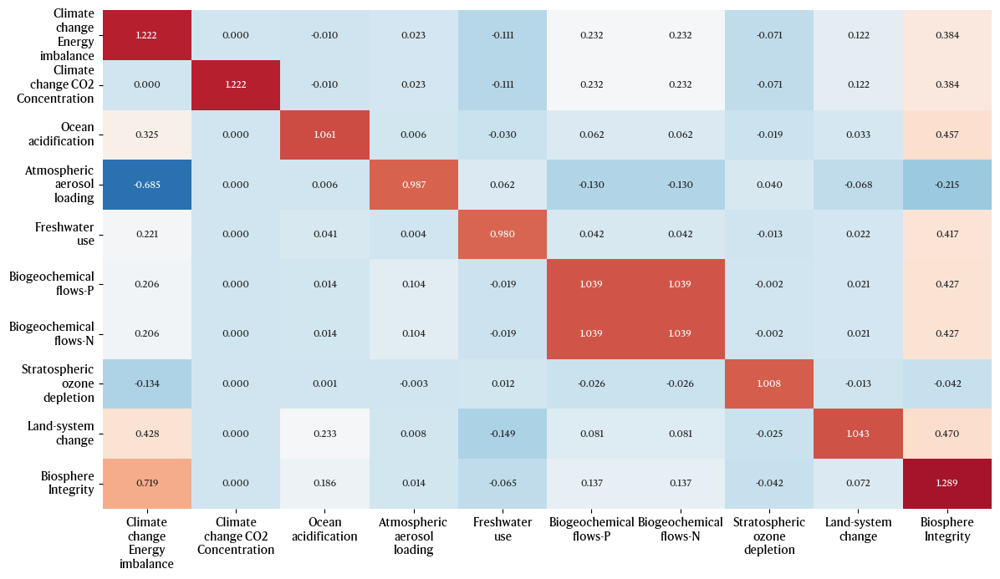

In [96]:
fig, ax = plt.subplots(figsize=(12,7))
kw_ag_font=Dict("fontproperties"=>font_prop, "fontsize"=> 8)
cbar_kw=Dict("label"=> "%")
Seaborn.heatmap(𝛐,ax=ax,cbar=false,annot=true,annot_kws=kw_ag_font, fmt=".03f",cbar_kws=cbar_kw,cmap="RdBu_r",vmin=-1,vmax=1.5)
ax.set_xticklabels(catnames,rotation=0, ha="center",fontproperties=font_prop_labels,fontsize=10)
ax.set_yticklabels(catnames,rotation=0,fontproperties=font_prop,fontsize=10)
fig.tight_layout()
# plt.savefig(respath*"interactions_bio.svg",bbox_inches="tight",transparent=true)
display(plt.gcf())
plt.close("all")


Going further, we can define the interaction matrix when all interactions are considered.

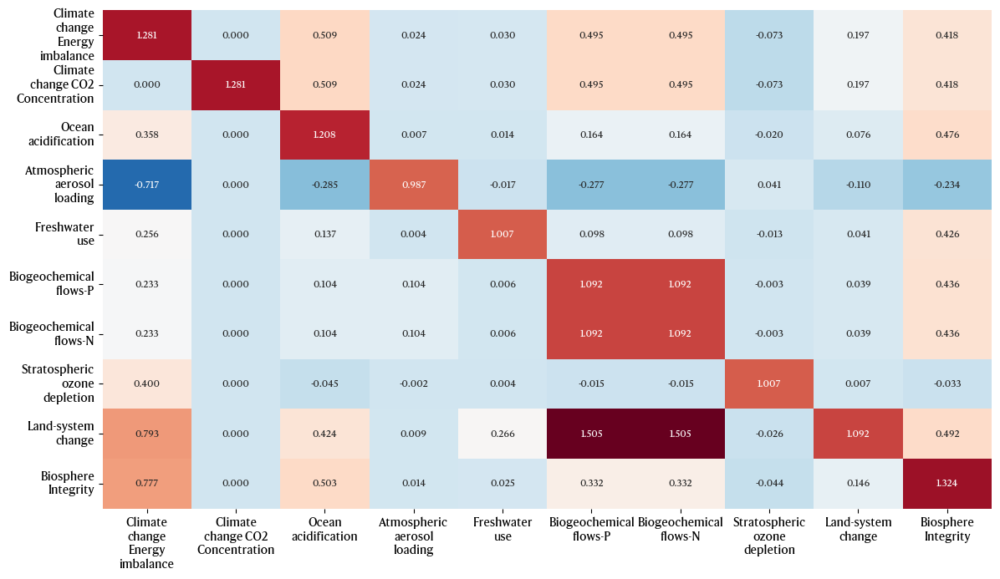

In [97]:
fig, ax = plt.subplots(figsize=(12,7))
kw_ag_font=Dict("fontproperties"=>font_prop, "fontsize"=> 8)
cbar_kw=Dict("label"=> "%")
Seaborn.heatmap(𝛄,ax=ax,cbar=false,annot=true,annot_kws=kw_ag_font, fmt=".03f",cbar_kws=cbar_kw,cmap="RdBu_r",vmin=-1,vmax=1.5)
ax.set_xticklabels(catnames,rotation=0, ha="center",fontproperties=font_prop,fontsize=10)
ax.set_yticklabels(catnames,rotation=0,fontproperties=font_prop,fontsize=10)
fig.tight_layout()
# plt.savefig(respath*"interactions_full.svg",bbox_inches="tight",transparent=true)
display(plt.gcf())
plt.close("all")


## ***3.2 Constraints***

### ***3.2.1. Electricity***

Here we can check the efficiency the models expect for water electrolysis. But this cannot be implemented easily. We rather focus on efficiency gains which can be adapted to our case study. 

In [98]:
Matrix(get_vals("SE|Input|Electricity|Hydrogen").*EJ_kWh)./(get_vals("SE|Hydrogen|+|Electricity").*EJH2_to_kgH2)


Row,2025,2030,2035,2040,2045,2050
,Float64,Float64,Float64,Float64,Float64,Float64
1,52.9048,51.2769,49.7463,48.3043,46.9437,45.6575
2,52.9048,51.2769,49.7463,48.3043,46.9437,45.6575
3,52.9048,51.2769,49.7463,48.3043,46.9437,45.6575


In [99]:
share=get_vals("SE|Hydrogen")./get_vals("SE")


Row,2025,2030,2035,2040,2045,2050
,Float64,Float64,Float64,Float64,Float64,Float64
1,0.00406981,0.00971058,0.020885,0.0412295,0.0713131,0.101395
2,0.00437387,0.0132087,0.0354819,0.0692155,0.0995571,0.125775
3,0.00466889,0.0162762,0.0434561,0.0820723,0.121038,0.160846


In [100]:
c_biomass_electricity= Matrix(get_vals("SE|Electricity|+|Biomass").*EJ_kWh./TotalkgH2.*share)'
c_gas_electricity= Matrix(get_vals("SE|Electricity|+|Gas").*EJ_kWh./TotalkgH2.*share)'
c_gas_electricity_CC = Matrix(get_vals("SE|Electricity|Gas|+|w/ CC").*EJ_kWh./TotalkgH2.*share)'
c_gas_electricity_noCC = Matrix(get_vals("SE|Electricity|Gas|+|w/o CC").*EJ_kWh./TotalkgH2.*share)'
c_coal_electricity= Matrix(get_vals("SE|Electricity|+|Coal").*EJ_kWh./TotalkgH2.*share)'
c_oil_electricity = Matrix(get_vals("SE|Electricity|Oil|w/o CC").*EJ_kWh./TotalkgH2.*share)'
c_geothermal_electricity= Matrix(get_vals("SE|Electricity|+|Geothermal").*EJ_kWh./TotalkgH2.*share)'
c_hydro_electricity= Matrix(get_vals("SE|Electricity|+|Hydro").*EJ_kWh./TotalkgH2.*share)'
c_nuclear_electricity= Matrix(get_vals("SE|Electricity|+|Nuclear").*EJ_kWh./TotalkgH2.*share)'
c_wind_electricity= Matrix(get_vals("SE|Electricity|+|Wind").*EJ_kWh./TotalkgH2.*share)'
c_solar_electricity= Matrix(get_vals("SE|Electricity|+|Solar").*EJ_kWh./TotalkgH2.*share)'
c_solar_PV_electricity= Matrix(get_vals("SE|Electricity|Solar|+|PV").*EJ_kWh./TotalkgH2.*share)'
c_CSP_electricity = Matrix(get_vals("SE|Electricity|Solar|+|CSP").*EJ_kWh./TotalkgH2.*share)'
;


In [101]:
r_solar_wind=(c_solar_electricity./c_wind_electricity)


6×3 Matrix{Float64}:
 1.00444  1.04574  1.02982
 1.60938  1.60205  1.44428
 1.66772  1.61021  1.40935
 1.70064  1.65333  1.42787
 1.68315  1.65027  1.43533
 1.65949  1.64638  1.43938

### ***3.1.1. electrolysis technology ratios***

In [102]:
C_AEC= [0.456858911	0.409911702	0.377745893	0.348652174	0.321172296	0.294236939
        0.456858911	0.409911702	0.377745893	0.348652174	0.321172296	0.294236939
        0.456858911	0.409911702	0.377745893	0.348652174	0.321172296	0.294236939]'



6×3 adjoint(::Matrix{Float64}) with eltype Float64:
 0.456859  0.456859  0.456859
 0.409912  0.409912  0.409912
 0.377746  0.377746  0.377746
 0.348652  0.348652  0.348652
 0.321172  0.321172  0.321172
 0.294237  0.294237  0.294237

In [103]:
C_PEM=[0.482496124	0.519686209	0.544879587	0.565652714	0.584064837	0.601662915
        0.482496124	0.519686209	0.544879587	0.565652714	0.584064837	0.601662915
        0.482496124	0.519686209	0.544879587	0.565652714	0.584064837	0.601662915]'



6×3 adjoint(::Matrix{Float64}) with eltype Float64:
 0.482496  0.482496  0.482496
 0.519686  0.519686  0.519686
 0.54488   0.54488   0.54488
 0.565653  0.565653  0.565653
 0.584065  0.584065  0.584065
 0.601663  0.601663  0.601663

In [104]:
C_SOEC=[0.060644965	0.070402088	0.077374519	0.085695112	0.094762867	0.104100147
        0.060644965	0.070402088	0.077374519	0.085695112	0.094762867	0.104100147
        0.060644965	0.070402088	0.077374519	0.085695112	0.094762867	0.104100147]'



6×3 adjoint(::Matrix{Float64}) with eltype Float64:
 0.060645   0.060645   0.060645
 0.0704021  0.0704021  0.0704021
 0.0773745  0.0773745  0.0773745
 0.0856951  0.0856951  0.0856951
 0.0947629  0.0947629  0.0947629
 0.1041     0.1041     0.1041

### ***3.1.3. Hydrogen production***

In [105]:
c_gas= Matrix(get_vals("SE|Hydrogen|Gas|+|w/o CC").*EJH2_to_kgH2./TotalkgH2)'
c_gasccs= Matrix(get_vals("SE|Hydrogen|Gas|+|w/ CC").*EJH2_to_kgH2./TotalkgH2)'
c_biomass= Matrix(get_vals("SE|Hydrogen|Biomass|+|w/o CC").*EJH2_to_kgH2./TotalkgH2)'
c_biomassccs= Matrix(get_vals("SE|Hydrogen|Biomass|+|w/ CC").*EJH2_to_kgH2./TotalkgH2)'
c_coal= Matrix(get_vals("SE|Hydrogen|Coal|+|w/o CC").*EJH2_to_kgH2./TotalkgH2)'
c_coalccs= Matrix(get_vals("SE|Hydrogen|Coal|+|w/ CC").*EJH2_to_kgH2./TotalkgH2)'
c_electrolysis= Matrix(get_vals("SE|Hydrogen|+|Electricity").*EJH2_to_kgH2./TotalkgH2)'


6×3 adjoint(::Matrix{Float64}) with eltype Float64:
 0.181111  0.186027  0.223208
 0.327035  0.390087  0.47818
 0.397655  0.372138  0.45914
 0.437081  0.344218  0.456027
 0.534109  0.392171  0.524074
 0.637826  0.482595  0.631777

## ***3.3. Optimisation***

### ***3.3.0. pre-optimisation analysis***

We first clean the TCM and ensure then run the last choice of the model. All dependencies for this choice will be added to the TCM.

In [106]:
TCM(p) = Tcm!(p)
A(p) =   Tcm!(p)[:technosphere]
B(p) =   Tcm!(p)[:biosphere]
f(p) =   spzeros(A(p).m)
𝚲b(p)=   Characterisation!(p).Matrix*B(p) #process intensity matrix


𝚲b (generic function with 1 method)

In [107]:
clc_tcm.(𝐏);


In [108]:
𝐁=DAC.(𝐏);
𝐀=model.(𝐏);
a1=elecHV.(𝐏);
a2=elecLV.(𝐏); 


We can now visualise the shape of the constructed matrix. It would be the same structure accross all years and scenarios.

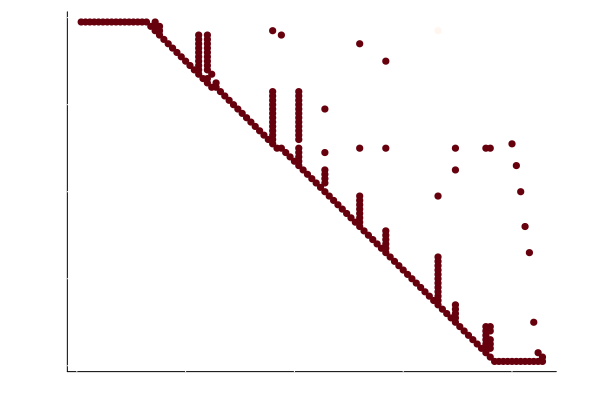

In [109]:
Plots.spy(A(𝐏[1,1]),color=:Reds,markersize=4,colorbar=false)


### ***3.3.1. Optimisation utilities***

In [110]:
ssp=1
rcp=1
year=1;

function printChoices(s,C;YEAR, SSP, RCP)
    [(TCM(𝐏[YEAR, SSP, RCP])[:map][i].act => k) for (i,k) in zip(C[YEAR, SSP, RCP].ref_col, s[YEAR, SSP, RCP][C[YEAR, SSP, RCP].ref_col])]
end
function printChoices(s;YEAR, SSP, RCP)
    elems=sparse(s[year, ssp, rcp]).nzind
    [(TCM(𝐏[YEAR, SSP, RCP])[:map][i].act => k) for (i,k) in zip(elems, s[YEAR, SSP, RCP][elems])]
end
function printChoices!(s;YEAR, SSP, RCP)
    # elems=sparse(s[year, ssp, rcp]).nzind
    XLSX.openxlsx("choices.xlsx", mode="w") do xf
                sheet = xf[1]
                # sheet2 = xf[2]
                for z in 1:length(s[YEAR, SSP, RCP])
                for (i,k) in zip(z, s[YEAR, SSP, RCP][z])
                    sheet[i, 1] = TCM(𝐏[YEAR, SSP, RCP])[:map][i].act
                    sheet[i, 2] = k 
                    # sheet2[i, 1] = TCM(𝐏[YEAR, SSP, RCP])[:map][i].act
                    # sheet2[i, 2] = k
                end
            end
            end
end


printChoices! (generic function with 1 method)

In [111]:
function getTcmKey(act, loc)   
    for (j,k) in pairs(TCM(𝐏[year, ssp, rcp])[:map])
        if k.act==act && k.loc==loc
            return j
        else
            for (m,n) in pairs(TCM(𝐏[year, ssp, rcp])[:choice_map])
                if n.act==act && n.loc==loc
                    return m
                end
            end
        end
    end
end
function getTcmKey(key::Symbol)   
    for (j,k) in pairs(TCM(𝐏[1,1,1])[:map])
        if k.key==key
            return j
        else
            for (m,n) in pairs(TCM(𝐏[1,1,1])[:choice_map])
                if n.key==key
                    return m
                end
            end
        end
    end
end

function getTcmKey!(act, loc)   
    for (m,n) in pairs(TCM(𝐏[year, ssp, rcp])[:choice_map])
        if n.act==act && n.loc==loc
            return m
        end
    end
end

function getTcmKey°(act, loc)   
    for (j,k) in pairs(TCM(𝐏[year, ssp, rcp])[:map])
        if k.act==act && k.loc==loc
            return j
        end
    end
end
function getTcmKey°(key::Symbol)   
    for (j,k) in pairs(TCM(𝐏[1,1,1])[:map])
        if k.key==key
            return j
        end
    end
end

function getTcmKey!(key::Symbol)   
    for (m,n) in pairs(TCM(𝐏[1,1,1])[:choice_map])
        if n.key==key
            return m
        end
    end
end

function getTcmAct(key,yr,ssp)
    if haskey(TCM(𝐏[yr,ssp])[:map],key)
        return TCM(𝐏[yr,ssp])[:map][key]
    else
        return TCM(𝐏[yr,ssp])[:choice_map][key]
    end
end

function getTcmAct!(key,yr,ssp)   
    return TCM(𝐏[yr,ssp])[:choice_map][key]
end
;


### ***3.3.2. Full model***

In [112]:
a2[1].ref_row


30

In [113]:
"""
    internal optimisation function to minimise the impact on planetary boudaries. It is used directly in the opti() function.
"""
function opti!(p,
                aSOS,
                𝛈_electrolysis,
                c_biomass_electricity = nothing,
                c_gas_electricity = nothing,
                c_gas_electricity_CC = nothing,
                c_gas_electricity_noCC = nothing,
                c_coal_electricity = nothing,
                c_oil_electricity = nothing,
                c_geothermal_electricity = nothing,
                c_hydro_electricity = nothing,
                c_nuclear_electricity = nothing,
                c_wind_electricity = nothing,
                c_solar_electricity = nothing,
                c_solar_PV = nothing,
                c_electricity_CSP = nothing,
                c_coalccs = nothing,
                c_coal = nothing,
                c_gasccs = nothing,
                c_gas = nothing,
                c_biomassccs = nothing,
                c_biomass = nothing,
                c_electrolysis = nothing,
                c_pem = nothing,
                c_aec = nothing,
                c_soec = nothing,
                delta=nothing,
                r_solar_wind=nothing,
                ccs=nothing,
                ;
                #Constants
                interactions=nothing,
                result_format="impact",
                focus=𝚲b,
                𝚲=𝚲b,
                delta_slope_max=0.47,
                delta_slope_min=0.41,
                )
            
            model_cc=Model(optimizer_with_attributes(CPLEX.Optimizer))
            set_silent(model_cc)
            @variable(model_cc,s̃_cc[1:A(p).n])
            # @variable(model_cc,f[1:A(p).m])
            @variable(model_cc, ζ[1:A(p).n] .≥ 0) #oversupply parameter for wind and solar
            
            if !isnothing(interactions)
                @objective(model_cc, Min, interactions*((𝚲(p)*s̃_cc)./aSOS')) #with interactions
            else
                @objective(model_cc, Min, (𝚲(p)*s̃_cc)./aSOS') # no interactions
            end

            fi=f(p)
            fi[16]=ccs
            fi[end]=1

            # The functional unit in this study is 1MtH2/yr. Since we can also define the allocated space per 1MtH2/yr. It would naturally cancel out. Therefore and to avoid numerical issues, defining the calculation based on a 1kgH2/yr is fine. 

            # Energy efficiencies of electrolysis for update
            reference_row=30#a2[1].ref_row
            A(p)[reference_row,getTcmKey°(:hydrogen_PEM)]= -51.25/𝛈_electrolysis #52.285714285714285
            A(p)[reference_row,getTcmKey°(:hydrogen_AE)]= -51.25/𝛈_electrolysis 
            A(p)[reference_row,getTcmKey°(:hydrogen_SOEC_steam)]= -39.0/𝛈_electrolysis 
            A(p)[reference_row,getTcmKey°(:hydrogen_SOEC_elec)]= -42.016666666666666/𝛈_electrolysis 

            @constraint(model_cc, A(p) * s̃_cc .== fi) # We want the fullfillment of the reference flow

            # Here we ensure that the scaling factors of choices are positive.
            for i ∈ keys(TCM(p)[:indices][:Choice]) #the choices need to be necessarily positive
                for  j ∈ values(TCM(p)[:indices][:Choice][i][:choice_upstream])
                @constraint(model_cc, s̃_cc[j] ≥ 0)
                end
            end


            #Electricity per kg of hydrogen
                # # # Electricity from biomass: SE|Electricity|+|Biomass
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, wood, future","GLO")] ≤ c_biomass_electricity)
                            
                # # Electricity from gas: ∑ = SE|Electricity|+|Gas 
                @constraint(model_cc,
                s̃_cc[getTcmKey!("electricity production, at natural gas-fired combined cycle power plant, post, pipeline 200km, storage 1000m","World")] +
                s̃_cc[getTcmKey!("electricity production, natural gas, 10MW","CH")] ≤ c_gas_electricity)
                
                # SE|Electricity|Gas|+|w/ CC
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, at natural gas-fired combined cycle power plant, post, pipeline 200km, storage 1000m","World")] ≤ c_gas_electricity_CC)
                
                # SE|Electricity|Gas|+|w/o CC
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, natural gas, 10MW","CH")] ≤ c_gas_electricity_noCC)

                # # Electricity from coal: ∑ = SE|Electricity|+|Coal
                @constraint(model_cc,
                s̃_cc[getTcmKey!("electricity production, hard coal","RoW")]  ≤ c_coal_electricity)

                # # Electricity from oil: ∑= "SE|Electricity|Oil|w/o CC"
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, oil","RoW")] ≤ c_oil_electricity)

                # Electricity from geothermal: ∑ = SE|Electricity|+|Geothermal
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, deep geothermal","RoW")] ≤ c_geothermal_electricity)

                #Electricity from hydro: ∑ = SE|Electricity|+|Hydro
                @constraint(model_cc,
                s̃_cc[getTcmKey!("electricity production, hydro, run-of-river","RoW")] ≤ c_hydro_electricity)

                # Electricity from nuclear: ∑ =SE|Electricity|+|Nuclear
                @constraint(model_cc,
                s̃_cc[getTcmKey!("electricity production, nuclear, boiling water reactor","RoW")] +
                s̃_cc[getTcmKey!("electricity production, nuclear, pressure water reactor, heavy water moderated","RoW")]+ s̃_cc[getTcmKey!("electricity production, nuclear, pressure water reactor","RoW")] ≤ c_nuclear_electricity)


                # #Electricity from wind: SE|Electricity|+|Wind
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, wind, >3MW turbine, onshore","RoW")] ≤ (1+ζ[getTcmKey!("electricity production, wind, >3MW turbine, onshore","RoW")])*c_wind_electricity)

                # #Electricity from solar: ∑ = SE|Electricity|+|Solar
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW")] ≤ (1+ζ[getTcmKey!("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW")])*c_solar_PV)

                # here we set proportions between wind and solar.
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW")] *r_solar_wind .== s̃_cc[getTcmKey!("electricity production, wind, >3MW turbine, onshore","RoW")])

                

                # # # Electricity from CSP: ∑ =  "SE|Electricity|Solar|+|CSP"
                @constraint(model_cc, s̃_cc[getTcmKey!("electricity production, solar thermal parabolic trough, 50 MW","RoW")] ≤ c_electricity_CSP)

            # Constrained supply of hydrogen per production method
                # Hydrogen from electrolysis

                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_PEM)] ≤ c_pem)  # PEM electrolysis
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_AE)] ≤ c_aec)  # AEC electrolysis
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_SOEC_steam)]+
                    s̃_cc[getTcmKey!(:hydrogen_SOEC_elec)] ≤ c_soec) # let the model choice which one to use

                    # forcing a development ratio between PEM and AEC
                    # @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_AE)]*(c_aec/c_pem) == s̃_cc[getTcmKey!(:hydrogen_PEM)])

                    # imposing material constraints on iridium for PEM electrolysis
                    # @constraint(model_cc, s̃_cc[getTcmKey°("platinum group metal, extraction and refinery operations", "ZA")] ≤ c_Ir)#kgIR/kgH2
          
                    @constraint(model_cc, 
                    s̃_cc[getTcmKey!(:hydrogen_PEM)]+s̃_cc[getTcmKey!(:hydrogen_AE)]+s̃_cc[getTcmKey!(:hydrogen_SOEC_steam)]+s̃_cc[getTcmKey!(:hydrogen_SOEC_elec)] ≤ c_electrolysis) #∑ of electrolysis ratios should be less than the total 

                # hydrogen from gas constraints
                    # SE|Hydrogen|Gas|+|w/o CC
                    @constraint(model_cc, s̃_cc[getTcmKey!(:SMR)] + s̃_cc[getTcmKey!(:hydrogen_pyrolysis)] ≤ c_gas) 
                
                    # SE|Hydrogen|Gas|+|w/ CC
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_SMRccs)] ≤ c_gasccs)  # hydrogen production, steam methane reforming, with CCS

                # hydrogen from biomass constraints
                    #  SE|Hydrogen|Biomass|+|w/ CC # via biogas reforming
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_bSMRccs)]+s̃_cc[getTcmKey!(:hydrogen_BioCccs)] ≤ c_biomassccs)  # hydrogen production, steam methane reforming, from biomethane, with CC
                    
                    #  SE|Hydrogen|Biomass|+|w/o CC via biogas reforming
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_bSMR)] ≤ c_biomass)  # hydrogen production, steam methane reforming, from biomethane

                # Hydrogen from coal constraints
                #   SE|Hydrogen|Coal|+|w/ CC
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_coalccs)] ≤ c_coalccs)  # hydrogen production, coal gasification, with CCS

                #   SE|Hydrogen|Coal|+|w/o CC
                    @constraint(model_cc, s̃_cc[getTcmKey!(:hydrogen_coal)] ≤ c_coal)  # hydrogen production, coal gasification

            
            if delta==1
                global Δs =zeros(A(p).n)
            end
        
       
            # RUN
            optimize!(model_cc)
            if !is_solved_and_feasible(model_cc)
                error("Solver did not find an optimal solution")
            end
            global Δs = value.(s̃_cc) # This global parameter stores the result for this given year to be used in the next loop.

            # s_res=value.(s̃_cc).+value.(ζ)
            if result_format=="contrib"
                return  𝚲(p)*diagm(value.(s̃_cc))
            # elseif result_format=="stressors"
            #         return 𝚲(p)*diagm(value.(s̃_cc))
            elseif result_format=="scale"
                return value.(s̃_cc)

            elseif result_format=="ASR"
                if !isnothing(interactions)
                    return interactions*((𝚲(p)*value.(s̃_cc))./aSOS')
                else
                    return ((𝚲(p)*value.(s̃_cc))./aSOS')
                end
            elseif result_format=="impact"
                return 𝚲(p)*value.(s̃_cc)
            elseif result_format=="oversupply"
                return Dict(
                    :wind => value.(ζ)[getTcmKey!("electricity production, wind, >3MW turbine, onshore","RoW")]*c_wind_electricity, 
                    :solar => value.(ζ)[getTcmKey!("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW")]*c_solar_PV
                    )
            elseif result_format=="sensitivity" #not working
                return lp_sensitivity_report(model_cc)
            end
end


opti!

Now, considering that the Julia broadcasting feature will lead to some very repetitive code, we can create a function that will take care of the broadcasting.

In [114]:
global Δs =zeros(4);
"""
    simplified function to call the optimisation problem and use keyword arguments. 

    Results can be return in several format such as :ASR, :impact, :scale, :contrib.
    

    Keyword arguments: 

    - result_format: Symbol=:ASR, :impact, :scale, :contrib
    - interactions: Symbol=:biophysical, :full
    - asos: Symbol=:median, :upper, :lower

    The following parameters are 6x3 matrices representing the 6 years of assessment and 3 SSP scenarios.


        - Technological variables:
            - 𝛈_electrolysis: Matrix of electrolysis efficiencies


        - Constraint variables:

            -The electricity source is constrained as follows:

                - c_biomass_electricity: Matrix to constrain electricity from biomass
                - c_gas_electricity: Matrix to constrain electricity from gas
                - c_gas_electricity_CC: Matrix to constrain electricity from gas with CCS
                - c_gas_electricity_noCC: Matrix to constrain electricity from gas without CCS
                - c_coal_electricity: Matrix to constrain electricity from coal
                - c_oil_electricity: Matrix to constrain electricity from oil
                - c_geothermal_electricity: Matrix to constrain electricity from geothermal
                - c_hydro_electricity: Matrix to constrain electricity from hydro
                - c_nuclear_electricity: Matrix to constrain electricity from nuclear
                - c_wind_electricity: Matrix to constrain electricity from wind
                - c_solar_electricity: Matrix to constrain electricity from solar
                - c_solar_PV_electricity: Matrix to constrain electricity from solar PV
                - c_CSP_electricity: Matrix to constrain electricity from CSP

            - Hydrogen production technologies are constrained as follows:

                - c_coalccs: Matrix to constrain production hydrogen from coal with CCS
                - c_coal: Matrix to constrain production hydrogen from coal without CCS
                - c_gasccs: Matrix to constrain production hydrogen from gas with CCS
                - c_gas: Matrix to constrain production hydrogen from gas without CCS
                - c_biomassccs: Matrix to constrain production hydrogen from biomass with CCS
                - c_biomass: Matrix to constrain production hydrogen from biomass without CCS
                - c_electrolysis: Matrix to constrain production hydrogen from electrolysis
                - C_PEM: Matrix to constrain production hydrogen from PEM electrolysis
                - C_AEC: Matrix to constrain production hydrogen from AEC electrolysis
                - C_SOEC: Matrix to constrain production hydrogen from SOEC electrolysis


            - Other constraints:

                - delta: a dummy parameter for the initial year of the optimisation problem.



    Function format:


"""
function opti(
            # all keyword arguments           
            ;result_format::Symbol=:ASR,
            interactions::Union{Symbol,Nothing}=:biophysical,
            asos::Symbol=:median,
            𝛈_electrolysis=𝛈_electrolysis,
            c_biomass_electricity=c_biomass_electricity,
            c_gas_electricity=c_gas_electricity,
            c_gas_electricity_CC=c_gas_electricity_CC,
            c_gas_electricity_noCC=c_gas_electricity_noCC,
            c_coal_electricity=c_coal_electricity,
            c_oil_electricity=c_oil_electricity,
            c_geothermal_electricity=c_geothermal_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_solar_electricity=c_solar_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            c_CSP_electricity=c_CSP_electricity,
            c_coalccs=c_coalccs,
            c_coal=c_coal,
            c_gasccs=c_gasccs,
            c_gas=c_gas,
            c_biomassccs=c_biomassccs,
            c_biomass=c_biomass,
            c_electrolysis=c_electrolysis,
            C_PEM=C_PEM,
            C_AEC=C_AEC,
            C_SOEC=C_SOEC,
            delta_slope_max=0.47,
            delta_slope_min=0.41,
            CCS=zeros(size(c_electrolysis)),
            r_solar_wind=r_solar_wind
            )

    
        if asos==:median
            asos=asos_med
        elseif asos==:upper
            asos=asos_upper
        elseif asos==:lower
            asos=asos_lower
        end


        if interactions==:biophysical
            interaction=𝛐
        elseif interactions==:full
            interaction=𝛄
        else
            interaction=nothing
        end

        delta=zeros(6,3)
        delta[1,:]=ones(3);
        Δsmax =zeros(3)


        resultat=opti!.(𝐏,asos,
                        𝛈_electrolysis,
                        # all constrains
                        c_biomass_electricity,
                        c_gas_electricity,
                        c_gas_electricity_CC,
                        c_gas_electricity_noCC,
                        c_coal_electricity,
                        c_oil_electricity,
                        c_geothermal_electricity,
                        c_hydro_electricity,
                        c_nuclear_electricity,
                        c_wind_electricity,
                        c_solar_electricity,
                        c_solar_PV_electricity,
                        c_CSP_electricity,
                        c_coalccs ,
                        c_coal ,
                        c_gasccs,
                        c_gas,
                        c_biomassccs,
                        c_biomass,
                        c_electrolysis,
                        C_PEM,
                        C_AEC,
                        C_SOEC,delta,r_solar_wind,
                        CCS,
                        ;
                        delta_slope_max=delta_slope_max,
                        delta_slope_min=delta_slope_min,
                        #Constants
                        interactions= interaction,
                        result_format=String(result_format), # ASR, impact, scale, contrib, variables
                        focus=𝚲b,
                        𝚲=𝚲b)
        return resultat
end;


## **3.4. Results**

### ***3.4.0 utility functions***

In [115]:
"""
    this function returns the column keys of a choice C
"""
function printChoicesKeys(C;YEAR=year, SSP=ssp, RCP=rcp)
    [i for i in C[YEAR, SSP, RCP].ref_col]
end

"""
    Function to print the scaling vector of the optimisation problem along with process names for a choice C
"""
function printChoices(s,C;YEAR=year, SSP=ssp, RCP=rcp)
    sorted_vec=C[YEAR, SSP, RCP].ref_col |>sort

    return  [(haskey(TCM(𝐏[YEAR, SSP, RCP])[:choice_map],i) ? TCM(𝐏[YEAR, SSP, RCP])[:choice_map][i].act => k : TCM(𝐏[YEAR, SSP, RCP])[:map][i].act => k) for (i,k) in zip(sorted_vec, s[YEAR, SSP, RCP][sorted_vec])]
end

"""
    Function to print the scaling vector of the optimisation problem along with process names.
"""
function printChoices(s;YEAR=year, SSP=ssp, RCP=rcp)
    elems=sparse(s[year, ssp, rcp]).nzind|>sort
    return [(haskey(TCM(𝐏[YEAR, SSP, RCP])[:choice_map],i) ? TCM(𝐏[YEAR, SSP, RCP])[:choice_map][i].act => k : TCM(𝐏[YEAR, SSP, RCP])[:map][i].act => k) for (i,k) in zip(elems, s[YEAR, SSP, RCP][elems])]
end
;


In [116]:
"""
    utility function to wrap text, use a double space to separate words
"""
function wrap_text(str, width=9)
    words = split(str)
    lines = String[]
    current_line = ""
    for word in words
        if length(current_line) + length(word) > width
            push!(lines, strip(current_line))
            current_line = word
        else
            current_line = current_line * " " * word
        end
    end
    push!(lines, strip(current_line))
    result = join(lines, "\n")
    return replace(result, r"^\n+" => "")  # Remove leading newlines
end

catnames=["Energy  Imbalance",
        "CO2  Concentration",
        "Ocean  Acidification",
        "Atmospheric  Aerosol  Loading",
        "Freshwater  Use",
        "Biogeochemical  Flows  P",
        "Biogeochemical  Flows  N",
        "Stratospheric  Ozone  Depletion",
        "Land-System  Change",
        "Biosphere  Integrity"
        ]
wrapped_names = wrap_text.(catnames, 9)
;


In [117]:
renaming = Dict(
    "hydrogen production, gaseous, 100 bar, from methane pyrolysis" => "MP",
    "hydrogen production, coal gasification" => "CG",
    "hydrogen production, steam methane reforming" => "SMR",
    "hydrogen production, coal gasification, with CCS" => "CGccs",
    "hydrogen production, gaseous, 1 bar, from SOEC electrolysis, from choice electricity" => "SOECelectricity",
    "hydrogen production, steam methane reforming, from biomethane, with CCS" => "bioSMRccs",
    "hydrogen production, gaseous, 30 bar, from PEM electrolysis, from choice electricity" => "PEM",
    "hydrogen production, gaseous, 20 bar, from AEC electrolysis, from choice electricity" => "AEC",
    "hydrogen production, steam methane reforming, with CCS" => "SMRccs",
    "hydrogen production, steam methane reforming, from biomethane" => "bioSMR",
    "hydrogen production, gaseous, 1 bar, from SOEC electrolysis, with steam input, from choice electricity" => "SOECsteam",
    "hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gasifier, with CCS, at gasification plant"=>"bioGccs",   
    "carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with industrial steam heat, and grid electricity"=>"CC_steam",
    "carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with heat pump heat, and grid electricity"=>"CC_HP")

elects = Dict(
    "electricity production, peat" => "E_Peat",
    "electricity production, lignite" => "E_Lignite",
    "electricity production, wind, >3MW turbine, onshore" => "E_Wind_Onshore",
    "electricity production, deep geothermal" => "E_Geothermal",
    "electricity production, solar thermal parabolic trough, 50 MW" => "E_Solar_Thermal",
    "electricity production, at lignite-fired IGCC power plant" => "E_Lignite_IGCC",
    "electricity production, natural gas, 10MW" => "E_Gas_10MW",
    "electricity production, hydro, reservoir, tropical region" => "E_Hydro_Tropical",
    "electricity production, oil" => "E_Oil",
    "electricity production, hard coal" => "E_Coal",
    "electricity production, hard coal, supercritical" => "E_Coal_SC",
    "electricity production, nuclear, pressure water reactor" => "E_Nuclear_PWR",
    "electricity production, from hydrogen-fired one gigawatt gas turbine" => "E_Hydrogen_1GW",
    "electricity production, wood, future" => "E_Wood_Future",
    "electricity production, at natural gas-fired combined cycle power plant, post, pipeline 200km, storage 1000m" => "E_NGccs",
    "electricity production, nuclear, boiling water reactor" => "E_Nuclear_BWR",
    "electricity production, hydro, run-of-river" => "E_Hydro",
    "electricity production, nuclear, pressure water reactor, heavy water moderated" => "E_Nuclear_PWR_HWM",
    "electricity production, photovoltaic, 570kWp open ground installation, multi-Si"=> "E_PV")


"""
    function to rename the key processes with a given dictionary of translation
"""
function techname(long_name::String)
    return get(renaming, long_name, "Not Found")
end;
function electname(long_name::String)
    return get(elects, long_name, "Not Found")
end;

function printScaling(s,sppp)
    mat1=hcat([[x[2] for x in printChoices(s, 𝐀, YEAR=y, SSP=sppp, RCP=1)] for y in 1:6]...)
    mat2=hcat([[x[2] for x in printChoices(s, 𝐁, YEAR=y, SSP=sppp, RCP=1)] for y in 1:6]...)
    mat= vcat(mat1,mat2)

    tech = size(mat)[1]==12 ? technamess : technamess2
    df=DataFrame(hcat(tech, mat),:auto)
    rename!(df, [:process, (Symbol(i) for i in 2025:5:2050)...])
    return df
end

function printSupply(s,sppp)
    ratios = hcat([[x[2] for x in printChoices(s, 𝐀, YEAR=y, SSP=sppp, RCP=1)] for y in 1:6]...)
    sup = ratios .* supply_MtH2[:, sppp]'
    df=DataFrame(hcat(technamess, sup),:auto)
    rename!(df, [:process, (Symbol(i) for i in 2025:5:2050)...])
    return df
end
function printCapacity(s,sppp)
    ratios = hcat([[x[2] for x in printChoices(s, 𝐀, YEAR=y, SSP=sppp, RCP=1)] for y in 1:6]...)
    sup = ratios.*GW_Cap[sppp,:]'
    df=DataFrame(hcat(technamess, sup),:auto)
    rename!(df, [:process, (Symbol(i) for i in 2025:5:2050)...])
    return df
end



printCapacity (generic function with 1 method)

### ***3.4.1 System contribution***

In [236]:
inter=:biophysical

s_med=opti(result_format=:scale,asos=:median,interactions=inter,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_hydro_electricity=c_hydro_electricity,#*1e50,
            c_solar_electricity=c_solar_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            c_electrolysis=c_electrolysis,#ones(size(c_electrolysis)),
            C_PEM=C_PEM, #ones(size(c_electrolysis)),
            c_biomassccs=c_biomassccs,
            c_biomass=ones(size(c_electrolysis)),#c_biomass,
            C_AEC=C_AEC,
            C_SOEC=C_SOEC,
            delta_slope_max=0.5,delta_slope_min=0);

s_upper=opti(result_format=:scale,asos=:upper,interactions=inter,
                c_nuclear_electricity=c_nuclear_electricity,
                c_wind_electricity=c_wind_electricity,
                c_solar_electricity=c_solar_electricity,
                c_solar_PV_electricity=c_solar_PV_electricity,
                delta_slope_max=0.50,delta_slope_min=0);

s_lower=opti(result_format=:scale,asos=:lower,interactions=inter,
                c_nuclear_electricity=c_nuclear_electricity,
                c_wind_electricity=c_wind_electricity,
                c_solar_electricity=c_solar_electricity,
                c_solar_PV_electricity=c_solar_PV_electricity,
                delta_slope_max=0.40,delta_slope_min=0);
;



Here we get the inventory names.

In [237]:
technamess=[techname(x[1]) for x in printChoices(s_med, 𝐀, YEAR=1, SSP=1, RCP=1)];
technamess2=vcat(technamess,[techname(x[1]) for x in printChoices(s_med, 𝐁, YEAR=1, SSP=1, RCP=1)]);
mask=vcat(printChoicesKeys(a1,YEAR=1, SSP=1));
push!(mask,getTcmKey("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW"))
printElec(s,yr,ssp)=[(electname((haskey(TCM(𝐏[yr,ssp])[:choice_map],i) ? TCM(𝐏[yr,ssp])[:choice_map][i].act : TCM(𝐏[yr,ssp])[:map][i].act) ) => k) for (i,k) in zip(sort(mask), s[yr,ssp][sort(mask)])]


printElec (generic function with 1 method)

In [239]:
printScaling(s_med,1)


Row,process,2025,2030,2035,2040,2045,2050
,Any,Any,Any,Any,Any,Any,Any
1,SMR,0.698523,0.355906,0.0812127,0.00213574,0.0,0.0
2,SMRccs,0.00734148,0.011383,0.011979,0.00728723,0.00421181,0.00270254
3,bioSMR,0.0826193,0.0417757,0.0109622,0.0026473,0.00146728,0.000913967
4,bioSMRccs,0.0,0.0,0.0,0.0,0.0,0.0
5,CG,0.0,0.0,0.0,0.0,0.0,0.0
6,CGccs,0.0,0.0,0.0,0.0,0.0,0.0
7,bioGccs,0.0304045,0.2639,0.498191,0.550848,0.460177,0.358536
8,MP,0.0,0.0,0.0,0.0,3.5402e-5,2.08704e-5
9,AEC,0.120466,0.256633,0.320281,0.348652,0.321172,0.294237


The required mass of wood chips

In [240]:
bioGccs_df=Matrix(printScaling(s_med,1))[7,2:end]*11.6966.*Matrix(TotalkgH2)[1,:]*1e-9 #Gt wood chips


6-element Vector{Float64}:
    5.638266543654365
   90.68966043120979
  347.88595100826745
  730.8054259957663
 1071.7314769346935
 1262.348555834417

the required iridium supply is as follows:

In [241]:
s_med[6,3][getTcmKey°("platinum group metal, extraction and refinery operations", "ZA")]# * #kgIR/kgH2


8.50819996244198e-6

#### ***3.4.1.1 optimal scales***

Now we can visualise the results of the optimisation of the scaling vecotr accross all scenarios.

In [242]:
df=printScaling(s_med,1)


Row,process,2025,2030,2035,2040,2045,2050
,Any,Any,Any,Any,Any,Any,Any
1,SMR,0.698523,0.355906,0.0812127,0.00213574,0.0,0.0
2,SMRccs,0.00734148,0.011383,0.011979,0.00728723,0.00421181,0.00270254
3,bioSMR,0.0826193,0.0417757,0.0109622,0.0026473,0.00146728,0.000913967
4,bioSMRccs,0.0,0.0,0.0,0.0,0.0,0.0
5,CG,0.0,0.0,0.0,0.0,0.0,0.0
6,CGccs,0.0,0.0,0.0,0.0,0.0,0.0
7,bioGccs,0.0304045,0.2639,0.498191,0.550848,0.460177,0.358536
8,MP,0.0,0.0,0.0,0.0,3.5402e-5,2.08704e-5
9,AEC,0.120466,0.256633,0.320281,0.348652,0.321172,0.294237


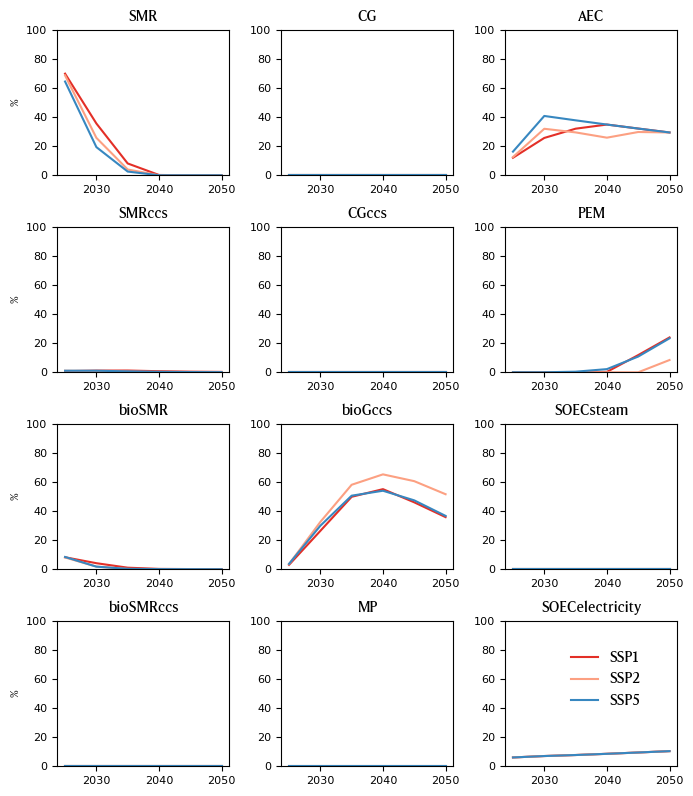

In [243]:
rcParams["axes.prop_cycle"] = plt.cycler("color",["#e32f27"
                                                "#fca082"
                                                "#3787c0"]);
fig, axs = plt.subplots(4,3,figsize=(7,8))

for (i,name) in enumerate(technamess)
    for (ssps,n) in enumerate(["SSP1","SSP2","SSP5"])
        # ratios = hcat([[x[2] for x in printChoices(s_med, 𝐀, YEAR=y, SSP=ssps, RCP=1)] for y in 1:6]...)
        mat1=hcat([[x[2] for x in printChoices(s_med, 𝐀, YEAR=y, SSP=ssps, RCP=1)] for y in 1:6]...)
        mat2=hcat([[x[2] for x in printChoices(s_med, 𝐁, YEAR=y, SSP=ssps, RCP=1)] for y in 1:6]...)
        ratios= vcat(mat1,mat2)
        if i==1
            axs[i].plot(2025:5:2050, (ratios)[i,:].*100,label=n)
        else
            axs[i].plot(2025:5:2050, (ratios)[i,:].*100)
        end
    end
    axs[i].set_title(name,fontproperties=font_prop,fontsize=8)
    axs[i].set_ylim(0,100)
end
for i in 1:4
    axs[i,1].set_ylabel("%",fontproperties=font_prop,fontsize=8)
end

# axs[end,end].remove()
fig.subplots_adjust(wspace=0.7)  
fig.subplots_adjust(hspace=0.5)

fig.legend(frameon=false,loc="upper left", bbox_to_anchor=(0.8, 0.2), ncol=1, prop=font_prop,fontsize=18)
plt.tight_layout()
# plt.savefig(respath*"H2contribs.svg",transparent=true)
# plt.savefig(respath*"H2contribs.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


#### ***3.4.1.2 Supply by processes***

In [125]:
s_med_not=opti(result_format=:scale,asos=:median,interactions=nothing,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_electricity=c_solar_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.5,delta_slope_min=0,CCS=0);
s_med_bio=opti(result_format=:scale,asos=:median,interactions=:biophysical,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_electricity=c_solar_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.5,delta_slope_min=0,CCS=0);
s_med_full=opti(result_format=:scale,asos=:median,interactions=:full,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_electricity=c_solar_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.5,delta_slope_min=0,CCS=0);


In [126]:
set_color_palette(["#E0E0E0","#005f73","#0a9396","#94d2bd","#e9d8a6","#ee9b00","#ca6702","#bb3e03","#ae2012","#9b2226"][1:end-2],13,set_rcParam=true,show=false,rev=true);


Setting rcParams


In [127]:


set_color_palette(:tab20c,13,set_rcParam=true,show=true,rev=false);


Setting rcParams


In [128]:
set_color_palette([
    "#3182bd"
    "#6baed6"
    "#9ecae1"
    "#c6dbef"
   
    "#636363"
    "#969696"
    "#bdbdbd"
    "#d9d9d9"
],12,set_rcParam=true,show=true,rev=false)




Setting rcParams


12-element Vector{String}:
 "#3182bd"
 "#569ecd"
 "#79b6d9"
 "#99c7e0"
 "#b4d3e9"
 "#b4c5d6"
 "#75797c"
 "#7a7a7a"
 "#9a9a9a"
 "#b2b2b2"
 "#c7c7c7"
 "#d9d9d9"

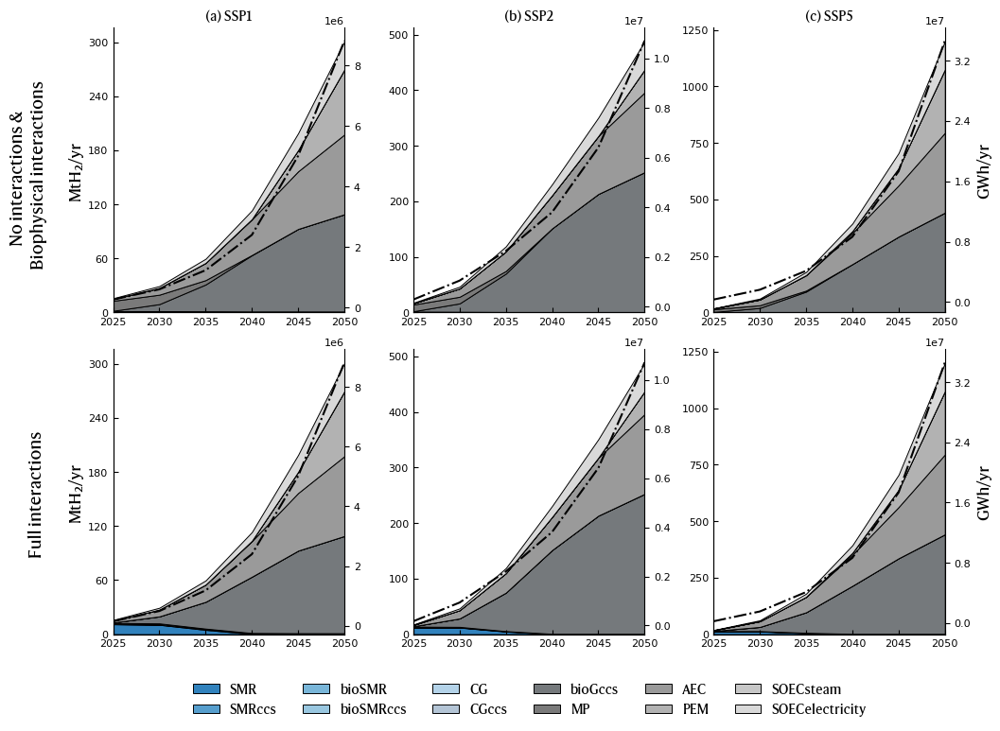

In [129]:
supply_MtH2 = Matrix(TotalMtH2)'
fig, axs = plt.subplots(2,3,sharex=false,figsize=(10, 7))#,sharey=true)
axsub=nothing
elctrolytic=9:12
bios=6:7

markerc="black"#orange"#"purple"
for (ind,s) in enumerate([s_med_not,s_med_full])
    for (sspi,l) in zip(1:3,[technamess,nothing,nothing])
        ratios = hcat([[x[2] for x in printChoices(s, 𝐀, YEAR=y, SSP=sspi, RCP=1)] for y in 1:6]...)
        sup = ratios.* supply_MtH2[:, sspi]' #./sum(ratios,dims=1) #


        ratios_elec = hcat([[x[2] for x in printElec(s,y,sspi)] for y in 1:6]...) #kWh/kgH2
        # rnzd=sparse(ratios_elec) #this is to get the nonzero elements faster
        # msk=[i for i in 1:size(rnzd, 1) if !isempty(rnzd[i, :].nzind)] # we filter by rows
        # ratios_elec=rnzd[msk, :] # we apply the mask
        # sup = ratios./sum(ratios,dims=1)*100 # #GWh #(ratios.* supply_MtH2[:, sspi]').*1e3 #
        supplelec = sum((ratios_elec.* supply_MtH2[:, sspi]').*1e3,dims=1)  #GWh/MtH2
        
        if !isnothing(l) && ind==1
            axs[ind,sspi].stackplot(2025:5:2050, sup, labels=l,lw=0.7,edgecolor="k")
            ax2 = axs[ind,sspi].twinx()
            # elct=sum(ratios[elctrolytic,:],dims=1).*GW_Cap[sspi,:]'
            # biosum=sum(ratios[bios,:],dims=1).*GW_Cap[sspi,:]'
            # ax2.axline((2025,elct),(2050,elct),color="black",linestyle="--")
            ax2.plot(2025:5:2050,supplelec', lw=1.5, color=markerc,linestyle="-.")
            # ax2.plot(2025:5:2050,biosum',"#ee9b00",linestyle="-.")
            # ax2.scatter(2025:5:2050,elct' ,edgecolor=markerc, marker="p", lw=1, facecolors=markerc, s=35, alpha=0.75,label="Share \n electrolytic H₂")
            # ax2.scatter(2025:5:2050,elct' ,edgecolor=markerc, marker="p", lw=1, facecolors=markerc, s=35, alpha=0.75,label="Share \n electrolytic H₂")
            # ax2.plot(2025:5:2050,elct',"#ee9b00",label="Share \n electrolytic H₂",linestyle="--")
            ax2.spines["top"].set_visible(false)
            ax2.spines["right"].set_color(markerc)
            ax2.tick_params(axis="y", colors=markerc)
            ax2.yaxis.label.set_color(markerc)
            # ax2.set_ylim(-0.03,100)
            axsub=ax2
        else
            axs[ind,sspi].stackplot(2025:5:2050,  sup,lw=0.7,edgecolor="k")
            ax2 = axs[ind,sspi].twinx()
            elct=sum(ratios[elctrolytic,:],dims=1).*GW_Cap[sspi,:]'
            biosum=sum(ratios[bios,:],dims=1).*GW_Cap[sspi,:]'
            ax2.plot(2025:5:2050,supplelec', lw=1.5, color=markerc,linestyle="-.")
            # ax2.plot(2025:5:2050,biosum',"#ee9b00",linestyle="-.")
            ax2.spines["top"].set_visible(false)
            ax2.spines["right"].set_color(markerc)
            ax2.tick_params(axis="y", colors=markerc)
            ax2.yaxis.label.set_color(markerc)
            ax2.yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
            # axsub=ax2
            if (ind,sspi) == (1,3)||(ind,sspi) == (2,3) || (ind,sspi)== (3,3) || (ind,sspi)== (4,3) || (ind,sspi)== (5,3) || (ind,sspi)== (6,3)
                ax2.set_ylabel("GWh/yr", fontproperties=font_prop,fontsize=12)
            end
        end
    end
end

axs[1,1].set_title("(a) SSP1", fontproperties=font_prop,fontsize=19)
axs[1,2].set_title("(b) SSP2", fontproperties=font_prop,fontsize=19)
axs[1,3].set_title("(c) SSP5", fontproperties=font_prop,fontsize=19)


for i in 1:2
    axs[i,1].set_ylabel("MtH₂/yr", fontproperties=font_prop,fontsize=12)
end

for i in axs
    i.yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
end


fig.subplots_adjust(wspace=0.2)  
fig.subplots_adjust(hspace=0.2) 

for ax in axs
    ax.tick_params(axis="both", direction="in")
    ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
    ax.set_xlim(2025, 2050)
    # ax.set_ylim(-0.03,100)
end

fig.legend(frameon=false,loc="center", bbox_to_anchor=(0.5, -0.06), ncol=6, prop=font_prop,fontsize=18)


fig.text(-0.03, 0.73, "No interactions & \n Biophysical interactions", va="center",ha="center", rotation="vertical", fontproperties=font_prop, fontsize=13)

fig.text(-0.03, 0.25, "Full interactions", va="center", rotation="vertical", fontproperties=font_prop, fontsize=13)

plt.tight_layout()
display(plt.gcf())
# plt.savefig(respath*"contrib.svg", bbox_inches="tight",transparent=true)
# plt.savefig(respath*"contrib.pdf", bbox_inches="tight",transparent=true)
plt.close("all")


#### ***3.4.1.3 Required Capacities***

We can also investigate the required capacities. For this we have previously calculated capacities with an average capacity factor of 0.6.

In [130]:
printCapacity(s_med,1) #the number here indicates the SSP scenario


Row,process,2025,2030,2035,2040,2045,2050
,Any,Any,Any,Any,Any,Any,Any
1,SMR,70.2277,66.3093,30.7458,1.53617,0.0,0.0
2,SMRccs,0.738093,2.12077,4.53506,5.24146,5.31803,5.15868
3,bioSMR,0.555064,1.91945,1.91393,1.89437,1.8435,1.73608
4,bioSMRccs,0.0,0.0,0.0,0.0,0.0,0.0
5,CG,7.75033,5.86262,2.23457,0.00811771,0.00754165,0.00691802
6,CGccs,0.000935439,0.00119969,0.00162777,0.00162248,0.0016172,0.00160134
7,bioGccs,3.05679,49.1675,188.607,396.207,581.04,684.384
8,MP,0.0,0.0,0.0,0.0,0.0447002,0.0398381
9,AEC,12.1114,47.8136,121.253,250.774,405.527,561.647


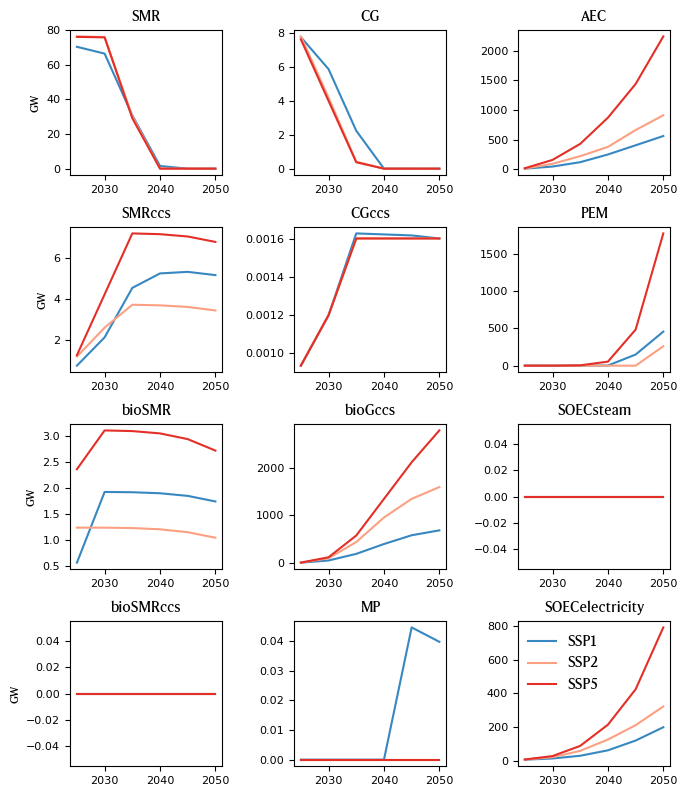

In [131]:
rcParams["axes.prop_cycle"] = plt.cycler("color",["#3787c0"
                                                "#fca082"
                                                "#e32f27"]);

fig, axs = plt.subplots(4,3,figsize=(7,8))

for (i,name) in enumerate(technamess)
    for (ssps,n) in enumerate(["SSP1","SSP2","SSP5"])
        ratios = hcat([[x[2] for x in printChoices(s_med, 𝐀, YEAR=y, SSP=ssps, RCP=1)] for y in 1:6]...)
        if i==1
            axs[i].plot(2025:5:2050, (ratios.*GW_Cap[ssps,:]')[i,:],label=n)
        else
            axs[i].plot(2025:5:2050, (ratios.*GW_Cap[ssps,:]')[i,:])
        end
    end
    axs[i].set_title(name,fontproperties=font_prop,fontsize=8)
    
end
for i in 1:4
    axs[i,1].set_ylabel("GW",fontproperties=font_prop,fontsize=8)
end

# axs[4,3].remove()
fig.subplots_adjust(wspace=0.7)  
fig.subplots_adjust(hspace=0.5)

fig.legend(frameon=false,loc="upper left", bbox_to_anchor=(0.75, 0.22), ncol=1, prop=font_prop,fontsize=18)

plt.tight_layout()
# plt.savefig(respath*"capacities.svg",transparent=true)
# plt.savefig(respath*"capacities.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


#### ***3.4.1.4 Electricity mix***

Here we separated wind and solar electricity as follows:

$$ E_{solar}r_{solar} = E_{wind}r_{wind}$$

$$ E_{solar}\frac{r_{solar}}{r_{wind}} = E_{wind}$$

In [132]:
s_med_not=opti(result_format=:scale,asos=:median,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_solar_electricity=c_solar_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.2,delta_slope_min=0,CCS=0,interactions=:nothing);

s_med_bio=opti(result_format=:scale,asos=:median,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_solar_electricity=c_solar_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.2,delta_slope_min=0,CCS=0,interactions=:biophysical);

s_med_full=opti(result_format=:scale,asos=:median,
            c_nuclear_electricity=c_nuclear_electricity,
            c_wind_electricity=c_wind_electricity,
            c_solar_electricity=c_solar_electricity,
            c_hydro_electricity=c_hydro_electricity,
            c_solar_PV_electricity=c_solar_PV_electricity,
            delta_slope_max=0.2,delta_slope_min=0,CCS=0,interactions=:full);


In [133]:
mask=vcat(printChoicesKeys(a1,YEAR=1, SSP=1));
push!(mask,getTcmKey("electricity production, photovoltaic, 570kWp open ground installation, multi-Si","RoW"))
printElec(s,yr,ssp)=[(electname((haskey(TCM(𝐏[yr,ssp])[:choice_map],i) ? TCM(𝐏[yr,ssp])[:choice_map][i].act : TCM(𝐏[yr,ssp])[:map][i].act) ) => k) for (i,k) in zip(sort(mask), s[yr,ssp][sort(mask)])]


printElec (generic function with 1 method)

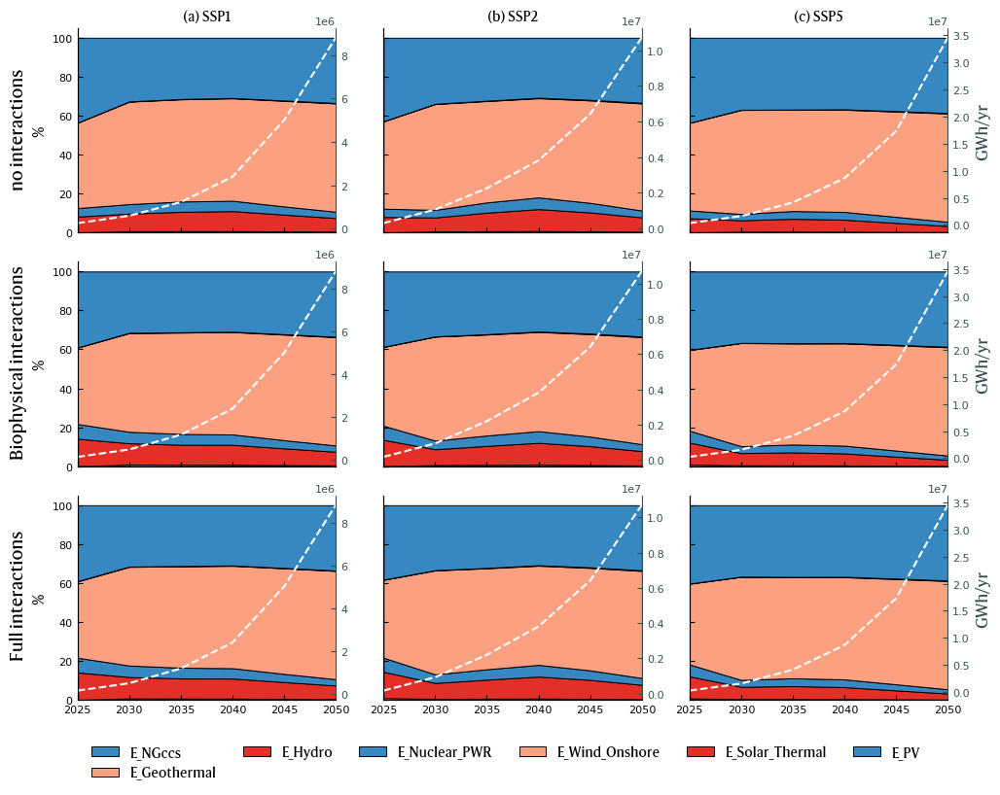

In [134]:
# set_color_palette(alternate_c[2:end-1],8,set_rcParam=true,show=false,rev=false)
supply_MtH2 = Matrix(TotalMtH2)'
fig, axs = plt.subplots(3,3,sharex=true,sharey=true,figsize=(10, 7.5))
axsub=nothing
elctrolytic=9:12


for (ind,s) in enumerate([s_med_not,s_med_bio,s_med_full])
    for (sspi,l) in zip(1:3,[[x[1] for x in printElec(s,1,1)],nothing,nothing])
        ratios = hcat([[x[2] for x in printElec(s,y,sspi)] for y in 1:6]...) #kWh/kgH2
        rnzd=sparse(ratios) #this is to get the nonzero elements faster
        msk=[i for i in 1:size(rnzd, 1) if !isempty(rnzd[i, :].nzind)] # we filter by rows
        ratios=rnzd[msk, :] # we apply the mask
        sup = ratios./sum(ratios,dims=1)*100 # #GWh #(ratios.* supply_MtH2[:, sspi]').*1e3 #
        supply = sum((ratios.* supply_MtH2[:, sspi]').*1e3,dims=1)  #GWh/MtH2
        if !isnothing(l) && ind==1
            axs[ind,sspi].stackplot(2025:5:2050,  sup, labels=vec([x[1] for x in printElec(s,1,1)][msk, :]),lw=0.7,edgecolor="k")

            ax2 = axs[ind,sspi].twinx()
            markerc="#354f52"#"#ee9b00"
            ax2.plot(2025:5:2050,supply',color="white",linestyle="--")#,edgecolor=markerc, marker="p", lw=1, facecolors=markerc, s=35, alpha=0.75,label="Share \n electrolytic H₂")
            # ax2.plot(2025:5:2050,elct',"#ee9b00",label="Share \n electrolytic H₂",linestyle="--")
            ax2.spines["top"].set_visible(false)
            ax2.spines["right"].set_color(markerc)
            ax2.tick_params(axis="y", colors=markerc)
            ax2.yaxis.label.set_color(markerc)
            ax2.tick_params(axis="both", direction="in")
            # ax2.set_ylim(-0.03,100)
            axsub=ax2
        else
            axs[ind,sspi].stackplot(2025:5:2050,   sup,lw=0.7,edgecolor="k")
            ax2 = axs[ind,sspi].twinx()
            markerc="#354f52"#"#ee9b00"
            ax2.plot(2025:5:2050,supply',color="white",linestyle="--")#,edgecolor=markerc, marker="p", lw=1, facecolors=markerc, s=35, alpha=0.75,label="Share \n electrolytic H₂")
            # ax2.plot(2025:5:2050,elct',"#ee9b00",label="Share \n electrolytic H₂",linestyle="--")
            ax2.spines["top"].set_visible(false)
            ax2.spines["right"].set_color(markerc)
            ax2.tick_params(axis="y", colors=markerc)
            ax2.yaxis.label.set_color(markerc)
            ax2.tick_params(axis="both", direction="in")
            if (ind,sspi) == (1,3)||(ind,sspi) == (2,3) || (ind,sspi)== (3,3) || (ind,sspi)== (4,3) || (ind,sspi)== (5,3) || (ind,sspi)== (6,3)
                ax2.set_ylabel("GWh/yr", fontproperties=font_prop,fontsize=12)
            end
        end
        
    end
end

axs[1,1].set_title("(a) SSP1", fontproperties=font_prop,fontsize=19)
axs[1,2].set_title("(b) SSP2", fontproperties=font_prop,fontsize=19)
axs[1,3].set_title("(c) SSP5", fontproperties=font_prop,fontsize=19)

for i in 1:3
    axs[i,1].set_ylabel("%", fontproperties=font_prop,fontsize=12)
end
fig.text(-0.01, 0.82, "no interactions", va="center", rotation="vertical", fontproperties=font_prop, fontsize=13)
fig.text(-0.01, 0.5, "Biophysical interactions", va="center", rotation="vertical", fontproperties=font_prop, fontsize=13)
fig.text(-0.01, 0.18, "Full interactions", va="center", rotation="vertical", fontproperties=font_prop, fontsize=13)
# axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=3))
# axs[1,2].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=3))
# axs[1,3].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=3))

fig.subplots_adjust(wspace=0.05)  
fig.subplots_adjust(hspace=0.2) 

for ax in axs
    ax.tick_params(axis="both", direction="in")
    ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
    ax.set_xlim(2025, 2050)
    # ax.set_ylim(-0.03,100)
end

fig.legend(frameon=false,loc="center", bbox_to_anchor=(0.5, -0.05), ncol=6, prop=font_prop,fontsize=18)

# fig.suptitle("Hydrogen \n production processes", fontproperties=font_prop, fontsize=12,x=0.74, y=0.43)
plt.tight_layout()
display(plt.gcf())
# plt.savefig(respath*"contrib_elect.svg", bbox_inches="tight",transparent=true)
# plt.savefig(respath*"contrib_elect.pdf", bbox_inches="tight",transparent=true)
plt.close("all")


### ***3.4.2. Contribution of processes***


In [135]:
res_contrib_med=opti(result_format=:contrib,asos=:median,interactions=:biophysical,
                    c_nuclear_electricity=c_nuclear_electricity,
                    c_wind_electricity=c_wind_electricity,
                    c_hydro_electricity=c_hydro_electricity,
                    c_solar_electricity=c_solar_electricity,
                    c_solar_PV_electricity=c_solar_PV_electricity,
                    delta_slope_max=0.9,delta_slope_min=0,CCS=0);
res_contrib_lower=opti(result_format=:contrib,asos=:lower,interactions=:biophysical,);
res_contrib_upper=opti(result_format=:contrib,asos=:upper,interactions=:biophysical,);


In [136]:
font_prop_legend = fm.FontProperties(fname="/Users/mickael/Library/Fonts/Harding Text Web Regular Regular.ttf",size=7);
cmap = PyPlot.get_cmap("tab20c")


In [137]:
rcParams["ytick.right"] = false
rcParams["xtick.top"] = false
rcParams["xtick.bottom"] = true
rcParams["ytick.direction"] = "in"
rcParams["ytick.minor.visible"] = true
rcParams["xtick.direction"] = "out"
rcParams["xtick.minor.visible"] = false
rcParams["figure.facecolor"] = "white"
for rcpi in 1:1
    for sspi in 1:3
        for yeari in 1:6
            mm=(res_contrib_med[yeari,sspi]./sum(res_contrib_med[yeari,sspi], dims=2));
            indices=unique(vcat([findall(x -> x > 0.05, mm[i,:]) for i in 1:10]...))
            rest=sum(mm,dims=2).-sum(mm[:,indices],dims=2)
            mm1=hcat(mm[:,indices],rest).*100
            

            labels=[getTcmAct(i,yeari,sspi).act for i in indices]
            labels=vcat(labels, "Others")
            co= [cmap(i) for i in 1:length(labels)] 
            
            fig, ax = subplots(figsize=(12, 6))

            bottom_pos = zeros(size(mm1, 1))
            bottom_neg = zeros(size(mm1, 1))
            bar_width = 0.9
            
            for (i,l,c) in zip(1:size(mm1, 2),labels,co)
                pos_values = ifelse.(mm1[:, i] .> 0, mm1[:, i], 0)
                neg_values = ifelse.(mm1[:, i] .< 0, mm1[:, i], 0)
                
                ax.bar(1:10, pos_values, bottom=bottom_pos, label=l, edgecolor="black",lw=0.8,zorder=1,width=bar_width,color=c)
                ax.bar(1:10, neg_values, bottom=bottom_neg, edgecolor="black",lw=0.8,zorder=1,width=bar_width,color=c)
                ax.spines["top"].set_visible(false)
                ax.spines["right"].set_visible(false)
                bottom_pos .+= pos_values
                bottom_neg .+= neg_values
                ax.set_ylabel("%",fontproperties=font_prop_labels)
                ax.set_xticks(1:10)
                ax.set_xticklabels(wrapped_names,fontproperties=font_prop_ticks)
            end

            plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.35), frameon=false, prop=font_prop_legend, ncol=2)

            plt.savefig("process_contrib-year_$(2020+(5*yeari)).pdf", bbox_inches="tight",transparent=true)
            plt.savefig("process_contrib-year_$(2020+(5*yeari)).svg", bbox_inches="tight",transparent=true)
            plt.close()
        end
    end
end 
rcParams["ytick.right"] = false
rcParams["xtick.top"] = false
rcParams["xtick.bottom"] = true
rcParams["ytick.direction"] = "out"
rcParams["ytick.minor.visible"] = false
rcParams["xtick.direction"] = "out"
rcParams["xtick.minor.visible"] = false
rcParams["figure.facecolor"] = "white"


"white"

export of the data to excel files

In [138]:
function expt_excel(;cutoff=0.05)
    for ssp in 1:3
        filename = string(respath, "SSP", ssp, "/contrib_results_H-PBI.xlsx")
        if isfile(filename)
            rm(filename)
        end
        for yr in 1:6
            sheetname = string("year ", 2020 + 5 * yr)
            mm = (res_contrib_med[yr, ssp] ./ sum(res_contrib_med[yr, ssp], dims=2))
            indices = unique(vcat([findall(x -> x > cutoff, mm[i, :]) for i in 1:10]...))
            rest = sum(mm, dims=2) .- sum(mm[:, indices], dims=2)
            mm1 = hcat(mm[:, indices], rest).*100
            labels = [getTcmAct(i, yr, 1).act for i in indices]
            labels = vcat(labels, "Others")
            df_res = DataFrame(hcat(labels, mm1'), :auto)
            rename!(df_res, vcat("Activities", catnames.*" [%]"))
            df_res = combine(groupby(df_res, :Activities), names(df_res, Not(:Activities)) .=> sum)

            for col in names(df_res)
                if endswith(string(col), "_sum")
                    rename!(df_res, col => Symbol(replace(string(col), "_sum" => "")))
                end
            end
            if isfile(filename)
                XLSX.openxlsx(filename, mode="rw") do xf
                    if sheetname in XLSX.sheetnames(xf)
                        deletesheet!(xf, sheetname)  # Remove existing sheet if you want to replace it
                    end
                    ws = XLSX.addsheet!(xf, sheetname)
                    XLSX.writetable!(ws, Tables.columntable(df_res))
                end
            else
                XLSX.writetable(filename, Tables.columntable(df_res), sheetname=sheetname)
            end
        end
    end
end
expt_excel()


LoadError: SystemError: opening file "../Results/SSP1/contrib_results_H-PBI.xlsx": No such file or directory

### ***3.4.3. Planetary footprint***

In [139]:
# pushfirst!(pyimport("sys")."path", "/Users/mickael/Library/CloudStorage/OneDrive-UNSW/Research/Data management/lca/src/python_modules/");
pushfirst!(pyimport("sys")."path", "./planetary-boundaries-visualisation/source");
pb30 = pyimport("PB30");


In [140]:
function expt_ASR_excel(ASR,ssp,scenar,range=["median","5th percentile","95th percentile"])
    filename = string(respath, "SSP", ssp, "/$(scenar)_ASR_results.xlsx")
    if isfile(filename)
        rm(filename)
    end
    for (asr,sc) in zip(ASR,range)
        df_ASR_res=DataFrame(hcat(catnames,hcat(asr[:,ssp]...)),:auto)
        rename!(df_ASR_res, [:Boundary, (Symbol(i) for i in 2025:5:2050)...])
        
        if isfile(filename)
            XLSX.openxlsx(filename, mode="rw") do xf
                if sc in XLSX.sheetnames(xf)
                    deletesheet!(xf, sc) 
                end
                ws = XLSX.addsheet!(xf, sc)
                XLSX.writetable!(ws, Tables.columntable(df_ASR_res))
            end
        else
            XLSX.writetable(filename, Tables.columntable(df_ASR_res), sheetname=sc)
        end

    end
end


expt_ASR_excel (generic function with 2 methods)

#### ***3.4.3.1 full interations (human feedback)***

In [141]:
ASR_med=opti(result_format=:ASR,asos=:median,interactions=:full,CCS=0);
ASR_lower=opti(result_format=:ASR,asos=:lower,interactions=:full,CCS=0);
ASR_upper=opti(result_format=:ASR,asos=:upper,interactions=:full,CCS=0);
# for ssp in 1:3
#     expt_ASR_excel([ASR_med,ASR_lower,ASR_upper],ssp,"H-PBI")
# end


In [142]:
df_ASR_res=DataFrame(hcat(catnames,hcat(ASR_med[:,1]...)),:auto)
rename!(df_ASR_res, [:Boundary, (Symbol(i) for i in 2025:5:2050)...])
df_ASR_res


Row,Boundary,2025,2030,2035,2040,2045,2050
,Any,Any,Any,Any,Any,Any,Any
1,Energy Imbalance,65.9679,44.8146,29.4803,25.0363,24.6579,24.3005
2,CO2 Concentration,68.2026,46.0912,30.0241,25.358,24.9185,24.5023
3,Ocean Acidification,32.3743,22.9035,16.3423,14.3031,13.3409,12.3193
4,Atmospheric Aerosol Loading,-36.055,-24.0975,-15.4603,-12.9504,-12.667,-12.397
5,Freshwater Use,14.5629,11.4808,9.66666,9.03824,8.35362,7.59987
6,Biogeochemical Flows P,44.8948,36.1743,30.8879,29.856,31.9217,33.9951
7,Biogeochemical Flows N,44.8948,36.1743,30.8879,29.856,31.9217,33.9951
8,Stratospheric Ozone Depletion,12.4345,7.1663,3.07032,1.8382,1.5987,1.38576
9,Land-System Change,80.6684,60.684,47.2041,43.9403,46.5288,49.1732


In [192]:
pb = pyimport("PB")


PyObject <module 'PB' from '/Users/mickael/Library/CloudStorage/OneDrive-UNSW/Research/Publications/Journal articles/1_Natcoms/Submission/code/./planetary-boundaries-visualisation/source/PB.py'>

In [193]:
ASR_med[:,1]
ASR_lower[:,1]
ASR_upper[:,1]


6-element Vector{Vector{Float64}}:
 [49.223829673534865, 50.89136534589338, 24.156981557796602, -26.903496974334317, 10.866535309487002, 33.499539002991945, 33.499539002991945, 9.278378211503101, 60.19308826091595, 34.51820389869633]
 [33.439696502604484, 34.39227906547817, 17.090122936827086, -17.981068944995627, 8.56673823649161, 26.99250514815955, 26.99250514815955, 5.347344144748717, 45.28113950032, 27.163943507960084]
 [21.99756012332783, 22.40332240994514, 12.194269578022013, -11.536169800253056, 7.213054692569916, 23.047885250219288, 23.047885250219288, 2.2910068530124166, 35.22272503266549, 22.85018238929559]
 [18.68155836379754, 18.92161062401624, 10.672638563379618, -9.663349482936455, 6.744145440011891, 22.27787832671119, 22.27787832671119, 1.3716229197065781, 32.78732710576933, 21.373995587757026]
 [18.399214105771172, 18.59369308574891, 9.954719390043882, -9.451857717493821, 6.233296411891986, 23.81927558981181, 23.81927558981181, 1.1929159214821952, 34.71879689487079, 19.

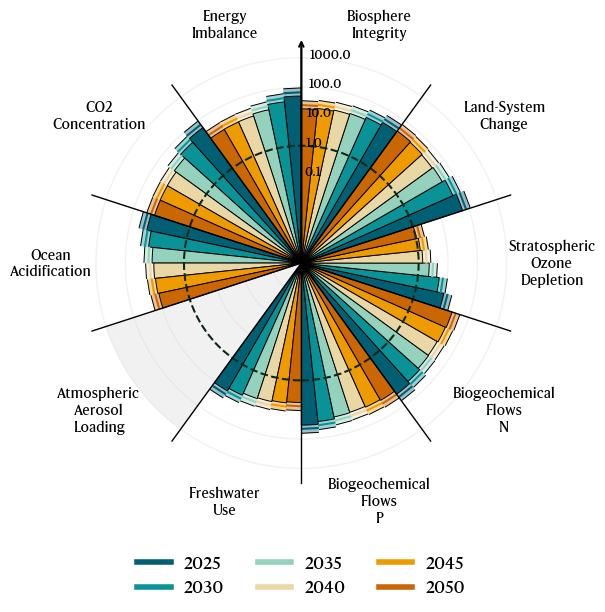

In [195]:
categories=["Energy  Imbalance",
            "CO2  Concentration",
            "Ocean  Acidification",
            "Atmospheric  Aerosol  Loading",
            "Freshwater  Use",
            "Biogeochemical  Flows  P",
            "Biogeochemical  Flows  N",
            "Stratospheric  Ozone  Depletion",
            "Land-System  Change",
            "Biosphere  Integrity"
            ]

fig=pb.PBchart(categories=categories,
                    values=ASR_med[:,1],upper=ASR_lower[:,1],lower=ASR_upper[:,1], 
                    legend=["2025","2030","2035","2040","2045","2050"],
                    figsize=(6,6),
                    offsetcat=0,scale=7,minscale=-4,median_lw=0.8)
    
    fig.savefig("ASR_interact.svg",dpi=800, bbox_inches="tight",transparent=true)
    fig.savefig("ASR_interact.pdf", bbox_inches="tight",transparent=true)

display(fig)
plt.close("all")


#### ***3.4.3.2 Biophysical interactions only***

In [146]:
ASR_med_bio=opti(result_format=:ASR,asos=:median,interactions=:biophysical,CCS=0);
ASR_lower_bio=opti(result_format=:ASR,asos=:lower,interactions=:biophysical,CCS=0);
ASR_upper_bio=opti(result_format=:ASR,asos=:upper,interactions=:biophysical,CCS=0);
# for ssp in 1:3
#     expt_ASR_excel([ASR_med_bio,ASR_lower_bio,ASR_upper_bio],ssp,"B-PBI")
# end


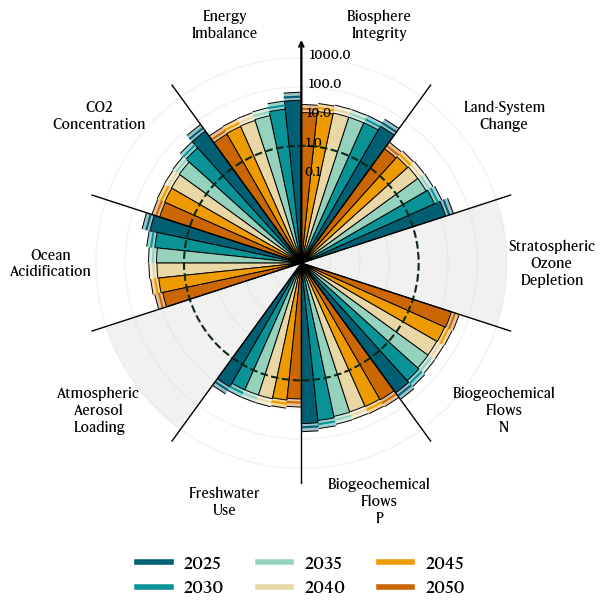

In [196]:
for ssps in 1:3
    pbchart= pb.PBchart(categories=categories,
                    values=ASR_med_bio[:,ssps],upper=ASR_lower_bio[:,ssps],lower=ASR_upper_bio[:,ssps], 
                    legend=["2025","2030","2035","2040","2045","2050"],
                    figsize=(6,6),
                    offsetcat=0,scale=7,minscale=-4,median_lw=0.8
                    ) 
    fig = pbchart
    # fig.savefig(respath*"SSP$ssps/ASR_biophysical.svg",dpi=800, bbox_inches="tight",transparent=true)
    # fig.savefig(respath*"SSP$ssps/ASR_biophysical.pdf", bbox_inches="tight",transparent=true)
end
display(fig)
plt.close()


In [197]:
fig.savefig("./ASR_interact.png",dpi=800, bbox_inches="tight",transparent=true)


#### ***3.4.3.3 no interactions***

In [198]:
ASR_med_noI=opti(result_format=:ASR,asos=:median,interactions=nothing,CCS=0);
ASR_lower_noI=opti(result_format=:ASR,asos=:lower,interactions=nothing,CCS=0);
ASR_upper_noI=opti(result_format=:ASR,asos=:upper,interactions=nothing,CCS=0);

# for ssp in 1:3
#     expt_ASR_excel([ASR_med_noI,ASR_lower_noI,ASR_upper_noI],ssp,"N-PBI")
# end


In [199]:
"hydrogen production, gaseous, 100 bar, from methane pyrolysis" => "MP",
"hydrogen production, coal gasification" => "CG",
"hydrogen production, steam methane reforming" => "SMR",
"hydrogen production, coal gasification, with CCS" => "CGccs",
"hydrogen production, gaseous, 1 bar, from SOEC electrolysis, from choice electricity" => "SOECelectricity",
"hydrogen production, steam methane reforming, from biomethane, with CCS" => "bioSMRccs",
"hydrogen production, gaseous, 30 bar, from PEM electrolysis, from choice electricity" => "PEM",
"hydrogen production, gaseous, 20 bar, from AEC electrolysis, from choice electricity" => "AEC",
"hydrogen production, steam methane reforming, with CCS" => "SMRccs",
"hydrogen production, steam methane reforming, from biomethane" => "bioSMR",
"hydrogen production, gaseous, 1 bar, from SOEC electrolysis, with steam input, from choice electricity" => "SOECsteam",
"hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gasifier, with CCS, at gasification plant"=>"bioGccs",   
"carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with industrial steam heat, and grid electricity"=>"CC_steam",
"carbon dioxide, captured from atmosphere and stored, with a solvent-based direct air capture system, 1MtCO2, with heat pump heat, and grid electricity"=>"CC_HP"


("hydrogen production, gaseous, 100 bar, from methane pyrolysis" => "MP", "hydrogen production, coal gasification" => "CG", "hydrogen production, steam methane reforming" => "SMR", "hydrogen production, coal gasification, with CCS" => "CGccs", "hydrogen production, gaseous, 1 bar, from SOEC electrolysis, from choice electricity" => "SOECelectricity", "hydrogen production, steam methane reforming, from biomethane, with CCS" => "bioSMRccs", "hydrogen production, gaseous, 30 bar, from PEM electrolysis, from choice electricity" => "PEM", "hydrogen production, gaseous, 20 bar, from AEC electrolysis, from choice electricity" => "AEC", "hydrogen production, steam methane reforming, with CCS" => "SMRccs", "hydrogen production, steam methane reforming, from biomethane" => "bioSMR", "hydrogen production, gaseous, 1 bar, from SOEC electrolysis, with steam input, from choice electricity" => "SOECsteam", "hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gas

In [200]:
biomass=getAct("hydrogen production, gaseous, 25 bar, from gasification of woody biomass in entrained flow gasifier, with CCS, at gasification plant","World")
smrprocess=getAct("hydrogen production, steam methane reforming","World");


In [201]:
Dict(
    "electricity production, peat" => "E_Peat",
    "electricity production, lignite" => "E_Lignite",
    "electricity production, wind, >3MW turbine, onshore" => "E_Wind_Onshore",
    "electricity production, deep geothermal" => "E_Geothermal",
    "electricity production, solar thermal parabolic trough, 50 MW" => "E_Solar_Thermal",
    "electricity production, at lignite-fired IGCC power plant" => "E_Lignite_IGCC",
    "electricity production, natural gas, 10MW" => "E_Gas_10MW",
    "electricity production, hydro, reservoir, tropical region" => "E_Hydro_Tropical",
    "electricity production, oil" => "E_Oil",
    "electricity production, hard coal" => "E_Coal",
    "electricity production, hard coal, supercritical" => "E_Coal_SC",
    "electricity production, nuclear, pressure water reactor" => "E_Nuclear_PWR",
    "electricity production, from hydrogen-fired one gigawatt gas turbine" => "E_Hydrogen_1GW",
    "electricity production, wood, future" => "E_Wood_Future",
    "electricity production, at natural gas-fired combined cycle power plant, post, pipeline 200km, storage 1000m" => "E_NGccs",
    "electricity production, nuclear, boiling water reactor" => "E_Nuclear_BWR",
    "electricity production, hydro, run-of-river" => "E_Hydro",
    "electricity production, nuclear, pressure water reactor, heavy water moderated" => "E_Nuclear_PWR_HWM",
    "electricity production, photovoltaic, 570kWp open ground installation, multi-Si"=> "E_PV")


Dict{String, String} with 19 entries:
  "electricity production, nuclear, pressure water react… => "E_Nuclear_PWR"
  "electricity production, lignite"                       => "E_Lignite"
  "electricity production, at natural gas-fired combined… => "E_NGccs"
  "electricity production, at lignite-fired IGCC power p… => "E_Lignite_IGCC"
  "electricity production, from hydrogen-fired one gigaw… => "E_Hydrogen_1GW"
  "electricity production, photovoltaic, 570kWp open gro… => "E_PV"
  "electricity production, hard coal"                     => "E_Coal"
  "electricity production, nuclear, pressure water react… => "E_Nuclear_PWR_HWM"
  "electricity production, peat"                          => "E_Peat"
  "electricity production, natural gas, 10MW"             => "E_Gas_10MW"
  "electricity production, oil"                           => "E_Oil"
  "electricity production, hydro, run-of-river"           => "E_Hydro"
  "electricity production, wind, >3MW turbine, onshore"   => "E_Wind_Onshore"
  "e

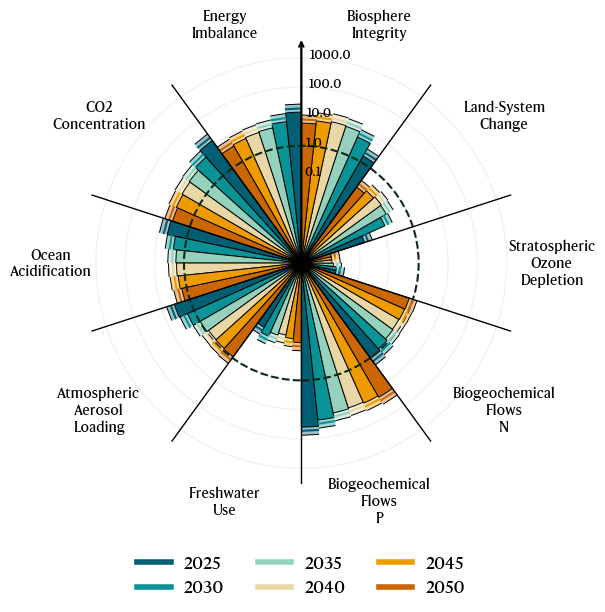

In [208]:
for ssps in 1:3
    fig= pb.PBchart(categories=categories,
                    values=ASR_med_noI[:,ssps],upper=ASR_lower_noI[:,ssps],lower=ASR_upper_noI[:,ssps], 
                    legend=["2025","2030","2035","2040","2045","2050"],
                    figsize=(6,6),
                    offsetcat=0,scale=7,minscale=-4,median_lw=0.8
                    ) 
    # fig.savefig(respath*"SSP$ssps/ASR_no_interactions.svg",dpi=800, bbox_inches="tight",transparent=true)
    # fig.savefig(respath*"SSP$ssps/ASR_no_interactions.pdf",dpi=800, bbox_inches="tight",transparent=true)
end
display(fig)
plt.close()


#### ***3.4.3.4 mosaic plot***

In [209]:
ni=hcat(ASR_med_noI[:,1]...)
bi=hcat(ASR_med_bio[:,1]...)
full=hcat(ASR_med[:,1]...)

df=DataFrame((((bi.-ni)./ni)*100)',:auto)
rename!(df, categories)


Row,Energy Imbalance,CO2 Concentration,Ocean Acidification,Atmospheric Aerosol Loading,Freshwater Use,Biogeochemical Flows P,Biogeochemical Flows N,Stratospheric Ozone Depletion,Land-System Change,Biosphere Integrity
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,157.366,157.77,306.865,-632.799,30591.7,-25.6029,2831.55,-2.58939e5,1.00427e5,1499.32
2,160.457,159.716,323.151,-660.972,19796.2,-9.89693,2794.24,-1.94752e5,9957.4,345.336
3,162.007,158.477,348.791,-799.931,19168.4,23.5481,2939.78,-151571.0,4052.66,131.007
4,164.728,159.61,361.0,-902.698,18516.8,39.9562,3045.4,-1.32114e5,3284.76,99.7231
5,177.913,172.775,361.769,-812.526,12086.6,32.4416,3090.68,-1.25835e5,3557.05,111.026
6,193.816,188.902,360.565,-725.74,8112.49,25.7005,3138.3,-1.18506e5,4045.99,130.917


In [210]:
df=DataFrame((((full.-bi)./bi)*100)',:auto)
rename!(df, categories)


Row,Energy Imbalance,CO2 Concentration,Ocean Acidification,Atmospheric Aerosol Loading,Freshwater Use,Biogeochemical Flows P,Biogeochemical Flows N,Stratospheric Ozone Depletion,Land-System Change,Biosphere Integrity
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,32.7772,31.6246,22.9705,33.8566,38.7326,8.75164,8.75164,-327.588,283.12,34.5144
2,35.2814,34.1991,23.7763,37.2887,33.0708,7.61567,7.61567,-296.747,288.995,30.8771
3,40.0664,39.2171,24.7965,43.9791,25.8004,6.22004,6.22004,-232.698,291.715,25.8131
4,43.6493,42.9763,26.075,49.0231,24.0523,5.71039,5.71039,-195.953,304.483,24.8492
5,48.8611,48.2095,30.8186,55.7211,28.2429,5.61848,5.61848,-187.81,372.554,29.5544
6,54.7811,54.1754,37.1022,63.5373,34.0875,5.55874,5.55874,-180.309,461.864,36.0766


In [211]:
df=DataFrame(ni',:auto)
rename!(df, categories)


Row,Energy Imbalance,CO2 Concentration,Ocean Acidification,Atmospheric Aerosol Loading,Freshwater Use,Biogeochemical Flows P,Biogeochemical Flows N,Stratospheric Ozone Depletion,Land-System Change,Biosphere Integrity
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,19.3045,20.1016,6.47067,5.05549,0.0342017,55.4886,1.4082,0.00211082,0.0209452,2.15031
2,12.7188,13.2242,4.37289,3.12894,0.0433631,37.3066,1.16142,0.00187124,0.155112,6.24595
3,8.03314,8.34362,2.91787,1.53414,0.0398795,23.5367,0.956621,0.00152753,0.29019,10.5365
4,6.58365,6.83172,2.46093,1.08263,0.0391358,20.18,0.897919,0.00145114,0.320949,11.4876
5,5.96027,6.1637,2.20847,1.14163,0.0534513,22.8203,0.947245,0.00144799,0.26924,9.70977
6,5.34345,5.501,1.95097,1.21145,0.0690149,25.6203,0.9945,0.0014573,0.211091,7.71126


In [212]:
df=DataFrame(bi',:auto)
rename!(df, categories)



Row,Energy Imbalance,CO2 Concentration,Ocean Acidification,Atmospheric Aerosol Loading,Freshwater Use,Biogeochemical Flows P,Biogeochemical Flows N,Stratospheric Ozone Depletion,Land-System Change,Biosphere Integrity
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,49.6831,51.816,26.3268,-26.9356,10.4971,41.2819,41.2819,-5.46362,21.0556,34.3904
2,33.1269,34.3454,18.504,-17.5525,8.6276,33.6144,33.6144,-3.6424,15.6002,27.8155
3,21.0474,21.5664,13.0951,-10.7379,7.68412,29.0791,29.0791,-2.31376,12.0506,24.34
4,17.4288,17.7358,11.3449,-8.69023,7.28583,28.2432,28.2432,-1.91572,10.8633,22.9434
5,16.5644,16.8131,10.198,-8.13442,6.51391,30.2236,30.2236,-1.82063,9.84623,20.4902
6,15.6999,15.8925,8.9855,-7.58051,5.66784,32.2049,32.2049,-1.72553,8.7518,17.8066


In [222]:
axd = plt.figure(figsize=(10,10),layout="constrained").subplot_mosaic(
                "AC
                 BC",
                #  DEF
                #  GHI",
                 # set the height ratios between the rows
                # height_ratios=[1,1],
                # # set the width ratios between the columns
                # width_ratios=[1,1, 1],
                # subplot_kw=Dict("projection"=> "polar"),
                per_subplot_kw=Dict(
                                "A" => Dict("projection"=> "polar"),
                                "B" => Dict("projection"=> "polar"),
                                "C" => Dict("projection"=> "polar"))
)

categories=["Energy  Imbalance",
            "CO2  Concentration",
            "Ocean  Acidification",
            "Atmospheric  Aerosol  Loading",
            "Freshwater  Use",
            "Biogeochemical  Flows  P",
            "Biogeochemical  Flows  N",
            "Stratospheric  Ozone  Depletion",
            "Land-System  Change",
            "Biosphere  Integrity"
            ]
categories_S=["EI",
            "[CO2]",
            "OA",
            "AAL",
            "FWU",
            "PBF",
            "NBF",
            "SOD",
            "LSC",
            "BI"
            ]

sss=[[ASR_med_noI,ASR_lower_noI,ASR_upper_noI],
    [ASR_med_bio,ASR_lower_bio,ASR_upper_bio],
    [ASR_med,ASR_lower,ASR_upper]]

hdls=nothing
for (s,a) in zip(sss,["A","B","C"])
    fig= pb.PBchart(categories=categories,
                    values=s[1][:,1],lower=s[3][:,1],upper=s[2][:,1], 
                    legend=["2025","2030","2035","2040","2045","2050"],
                    figsize=(8,8),
                    offsetcat=0,scale=7,minscale=-4,median_lw=0.8,axis=axd[a]
                    ) 
    # ax,hdl = pbchart.chart
    # if a == "C"
    #     hdls=hdl
    # end
end

# axd["C"].legend(handles=hdls, loc="center", bbox_to_anchor=(0.5,-0.5),prop=font_prop_titles,frameon=false,ncol=2)
axd["A"].set_title("(a) No interactions",fontproperties=font_prop_titles,fontsize=30,pad=30)
axd["B"].set_title("(b) Biophysical interactions",fontproperties=font_prop_titles,fontsize=30,pad=30)
axd["C"].set_title("(c) Full interactions",fontproperties=font_prop_titles,fontsize=30,pad=30)

# axd["A"].set_ylabel("SSP1",fontproperties=font_prop,fontsize=13)

# plt.tight_layout()
# plt.savefig(respath*"ASR_mosaic.svg",transparent=true)
# plt.savefig(respath*"ASR_mosaic.pdf",transparent=true)
display(fig)
plt.close()


(PyObject <PolarAxes: label='C', title={'center': '(c) Full interactions'}>, PyObject[PyObject <matplotlib.lines.Line2D object at 0x4ba5669b0>, PyObject <matplotlib.lines.Line2D object at 0x4ba566e00>, PyObject <matplotlib.lines.Line2D object at 0x4ba566f50>, PyObject <matplotlib.lines.Line2D object at 0x4ba5670a0>, PyObject <matplotlib.lines.Line2D object at 0x4ba5671f0>, PyObject <matplotlib.lines.Line2D object at 0x4ba567340>])

Relative change with other SSPs

In [223]:
δASR12_noI= [x./y for (x,y) in zip((ASR_med_noI[:,2].-ASR_med_noI[:,1]),ASR_med_noI[:,1])]
δASR13_noI= [x./y for (x,y) in zip((ASR_med_noI[:,3].-ASR_med_noI[:,1]),ASR_med_noI[:,1])]

δASR12_bio= [x./y for (x,y) in zip((ASR_med_bio[:,2].-ASR_med_bio[:,1]),ASR_med_bio[:,1])]
δASR13_bio= [x./y for (x,y) in zip((ASR_med_bio[:,3].-ASR_med_bio[:,1]),ASR_med_bio[:,1])]

δASR12 = [x./y for (x,y) in zip((ASR_med[:,2].-ASR_med[:,1]),ASR_med[:,1])]
δASR13 = [x./y for (x,y) in zip((ASR_med[:,3].-ASR_med[:,1]),ASR_med[:,1])]
;


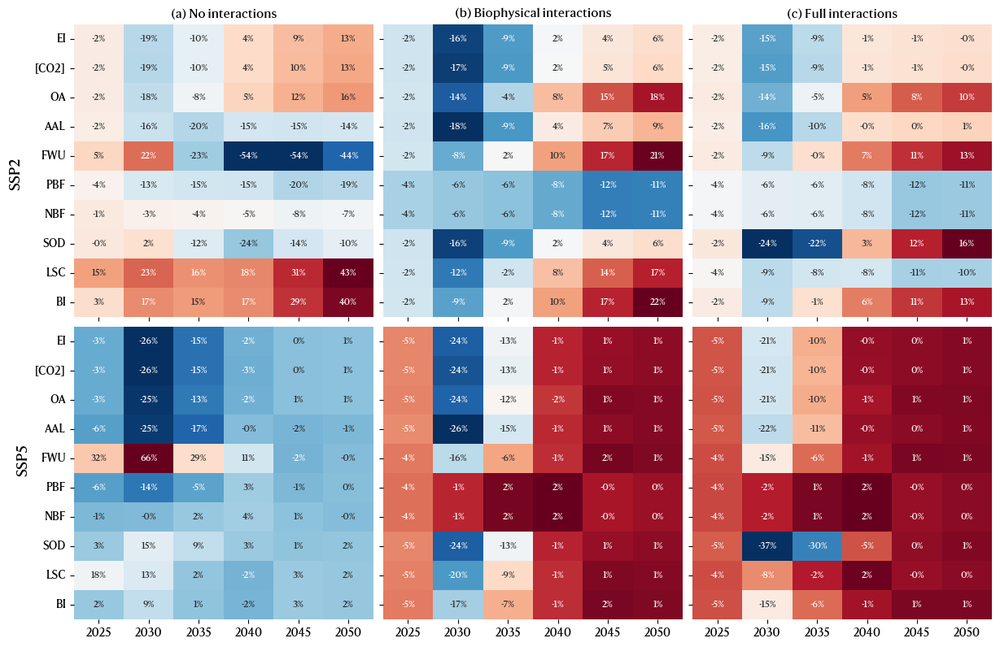

In [224]:
fig, axs = plt.subplots(2,3, figsize=(12,8),sharey=true,sharex=true)

kw_ag_font=Dict("fontproperties"=>font_prop, "fontsize"=> 8)

for (i,k) in enumerate([δASR12_noI,δASR13_noI,δASR12_bio,δASR13_bio,δASR12,δASR13])
    Seaborn.heatmap(hcat(k...),ax=axs[i],cbar=false,annot=true,annot_kws=kw_ag_font, fmt=".0%",cmap="RdBu_r")
    axs[i].set_xticklabels(2025:5:2050,fontproperties=font_prop_labels,fontsize=10) #rotation=45, ha="right",
    axs[i].set_yticklabels(categories_S, rotation=0, ha="right",fontproperties=font_prop_labels,fontsize=10)
end

axs[1,1].set_title("(a) No interactions",fontproperties=font_prop_titles,fontsize=30)
axs[1,2].set_title("(b) Biophysical interactions",fontproperties=font_prop_titles,fontsize=30)
axs[1,3].set_title("(c) Full interactions",fontproperties=font_prop_titles,fontsize=30)

fig.text(-0.01, 0.73, "SSP2", va="center",ha="center", rotation="vertical", fontproperties=font_prop_labels, fontsize=13)
fig.text(-0.01, 0.29, "SSP5", va="center", rotation="vertical", fontproperties=font_prop_labels, fontsize=13)

left = 0.92
bottom = 0.2 #/ (fig_height*0.5)
width = 0.02
height = 0.6
# cbar_ax = fig.add_axes([left, bottom, width, height]) 
# cbar = fig.colorbar(plt.cm.ScalarMappable(cmap="RdBu_r"), cax=cbar_ax)
# cbar.set_label("%", fontproperties=font_prop)
plt.tight_layout()  
# plt.savefig(respath*"ASR_heatmap.svg",transparent=true, bbox_inches="tight")
# plt.savefig(respath*"ASR_heatmap.pdf",transparent=true, bbox_inches="tight")
display(plt.gcf())
plt.close("all")


In [225]:
δASR12_noI= [x./y for (x,y) in zip((ASR_med_noI[:,2].-ASR_med_noI[:,1]),ASR_med_noI[:,1])]
δASR13_noI= [x./y for (x,y) in zip((ASR_med_noI[:,3].-ASR_med_noI[:,1]),ASR_med_noI[:,1])]

δASR12_bio= [x./y for (x,y) in zip((ASR_med_bio[:,2].-ASR_med_bio[:,1]),ASR_med_bio[:,1])]
δASR13_bio= [x./y for (x,y) in zip((ASR_med_bio[:,3].-ASR_med_bio[:,1]),ASR_med_bio[:,1])]

δASR12 = [x./y for (x,y) in zip((ASR_med[:,2].-ASR_med[:,1]),ASR_med[:,1])]
δASR13 = [x./y for (x,y) in zip((ASR_med[:,3].-ASR_med[:,1]),ASR_med[:,1])]


6-element Vector{Vector{Float64}}:
 [-0.04833142576611456, -0.04860324661500574, -0.04801915556668379, -0.050656512765424315, -0.04451137551157938, -0.041201431899945684, -0.041201431899945684, -0.05307483094435516, -0.04399170760755691, -0.04525880455906186]
 [-0.20545087210880836, -0.21053914163432225, -0.21062367459644638, -0.2224571004678458, -0.1542141279144079, -0.01906784598713379, -0.01906784598713379, -0.36586732847832615, -0.07932562915779207, -0.15374537185427753]
 [-0.10039392795284148, -0.10444249756473156, -0.09968917129510256, -0.11183488932209558, -0.061073495499055566, 0.013335803613949782, 0.013335803613949782, -0.30289012786925723, -0.016667380297240568, -0.0605333676504307]
 [-0.0005859755431632547, -0.0012256743858873236, -0.00970527801735134, -0.0015191997486532233, -0.007937316543270493, 0.023292493853888197, 0.023292493853888197, -0.0468914208846901, 0.019388907371006, -0.007526282064108029]
 [0.002741209933501521, 0.002923579066978196, 0.009384024409972224, 0.0

In [226]:
δASRbh1=[x./y for (x,y) in zip((ASR_med[:,1].-ASR_med_bio[:,1]),ASR_med_bio[:,1])]
δASRbh2=[x./y for (x,y) in zip((ASR_med[:,2].-ASR_med_bio[:,2]),ASR_med_bio[:,2])]
δASRbh3=[x./y for (x,y) in zip((ASR_med[:,3].-ASR_med_bio[:,3]),ASR_med_bio[:,3])]


6-element Vector{Vector{Float64}}:
 [0.32908695412865074, 0.3175923616042206, 0.23058840426333843, 0.34105129817566915, 0.3862503413783943, 0.0870351395670763, 0.0870351395670763, -3.266854405560765, 2.8445252879191685, 0.3451605438869952]
 [0.41050234574030703, 0.40011397419394157, 0.27908835637366647, 0.44869321142025054, 0.3376599188390087, 0.0669311030635749, 0.0669311030635749, -2.6376822616838003, 3.488524317605892, 0.33105756027121047]
 [0.44196657607869694, 0.4345865838390904, 0.27235986729781275, 0.4959038546174796, 0.260397852603419, 0.05827190133277898, 0.05827190133277898, -2.058802099298873, 3.2365621836445637, 0.26780187562639923]
 [0.44876859713005735, 0.44211522029055617, 0.270350678654685, 0.5052586018217209, 0.24742225337975748, 0.056683345143711455, 0.056683345143711455, -1.9229239647183294, 3.180277004554321, 0.25676422043867436]
 [0.48424498123509213, 0.4776953853221711, 0.3032824583384254, 0.5504225223628326, 0.27699759923886563, 0.0561847467463766, 0.056184746746

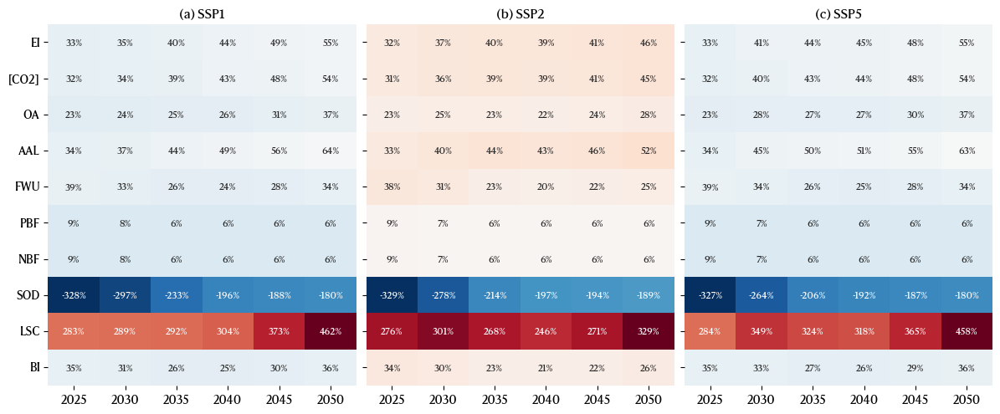

In [227]:
fig, axs = plt.subplots(1,3, figsize=(12,5),sharey=true,sharex=true)

kw_ag_font=Dict("fontproperties"=>font_prop, "fontsize"=> 8)

for (i,k) in enumerate([δASRbh1,δASRbh2,δASRbh3])
    Seaborn.heatmap(hcat(k...),ax=axs[i],cbar=false,annot=true,annot_kws=kw_ag_font, fmt=".0%",cmap="RdBu_r")
    axs[i].set_xticklabels(2025:5:2050,fontproperties=font_prop_labels,fontsize=10) #rotation=45, ha="right",
    axs[i].set_yticklabels(categories_S, rotation=0, ha="right",fontproperties=font_prop_labels,fontsize=10)
end

axs[1].set_title("(a) SSP1",fontproperties=font_prop_titles,fontsize=30)
axs[2].set_title("(b) SSP2",fontproperties=font_prop_titles,fontsize=30)
axs[3].set_title("(c) SSP5",fontproperties=font_prop_titles,fontsize=30)

# fig.text(-0.01, 0.73, "SSP2", va="center",ha="center", rotation="vertical", fontproperties=font_prop_labels, fontsize=13)
# fig.text(-0.01, 0.29, "SSP5", va="center", rotation="vertical", fontproperties=font_prop_labels, fontsize=13)

left = 0.92
bottom = 0.2 #/ (fig_height*0.5)
width = 0.02
height = 0.6
# cbar_ax = fig.add_axes([left, bottom, width, height]) 
# cbar = fig.colorbar(plt.cm.ScalarMappable(cmap="RdBu_r"), cax=cbar_ax)
# cbar.set_label("%", fontproperties=font_prop)
plt.tight_layout()  
# plt.savefig(respath*"ASR_heatmap_bh.svg",transparent=true, bbox_inches="tight")
# plt.savefig(respath*"ASR_heatmap_bh.pdf",transparent=true, bbox_inches="tight")
display(plt.gcf())
plt.close("all")


### ***3.4.4. Sensitivity analysis***

#### ***3.4.4.1 Varying the CCS content***

Biophysical interactions

In [228]:
e_bio=[opti(result_format=:ASR,asos=:median,interactions=:biophysical,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,1] for y in 0:0.175:35];
e_bio_SSP2=[opti(result_format=:ASR,asos=:median,interactions=:biophysical,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,2] for y in 0:0.175:35];
e_bio_SSP5=[opti(result_format=:ASR,asos=:median,interactions=:biophysical,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,3] for y in 0:0.175:35];


In [165]:
function expt_sensitivity(e,catnames,scenar)
    filename = string(respath, "Sensitivity/", scenar, "_results.xlsx")
    if isfile(filename)
        rm(filename)
    end

    for i in enumerate(catnames)
    df_e_bio=DataFrame(hcat(0:0.175:35,[z[y][i[1]] for z in e, y in 1:6]),:auto)
    rename!(df_e_bio, [Symbol("kgCO₂/kgH₂⁻¹"), (Symbol(i) for i in 2025:5:2050)...])
    
    if isfile(filename)
        XLSX.openxlsx(filename, mode="rw") do xf
            if i[2] in XLSX.sheetnames(xf)
                deletesheet!(xf, i[2]) 
            end
            ws = XLSX.addsheet!(xf, i[2])
            XLSX.writetable!(ws, Tables.columntable(df_e_bio))
        end
    else
        XLSX.writetable(filename, Tables.columntable(df_e_bio), sheetname=i[2])
    end
    end
end


expt_sensitivity (generic function with 1 method)

In [166]:
e_full=[opti(result_format=:ASR,asos=:median,
            interactions=:full,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,1] for y in 0:0.175:35];

e_full_SSP2=[opti(result_format=:ASR,asos=:median,
            interactions=:full,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,2] for y in 0:0.175:35];

e_full_SSP5=[opti(result_format=:ASR,asos=:median,
            interactions=:full,c_electrolysis=c_electrolysis,CCS=ones(size(c_electrolysis))*y)[:,3] for y in 0:0.175:35];


In [167]:
expt_sensitivity(e_bio,catnames,"SSP1_B-PBI")
expt_sensitivity(e_bio_SSP2,catnames,"SSP2_B-PBI")
expt_sensitivity(e_bio_SSP5,catnames,"SSP5_B-PBI")

expt_sensitivity(e_full,catnames,"SSP1_H-PBI")
expt_sensitivity(e_full_SSP2,catnames,"SSP2_H-PBI")
expt_sensitivity(e_full_SSP5,catnames,"SSP5_H-PBI")


LoadError: SystemError: opening file "../Results/Sensitivity/SSP1_B-PBI_results.xlsx": No such file or directory

In [168]:
rcParams["hatch.linewidth"] = 0.1  
rcParams["hatch.color"]    = "k" 


"k"

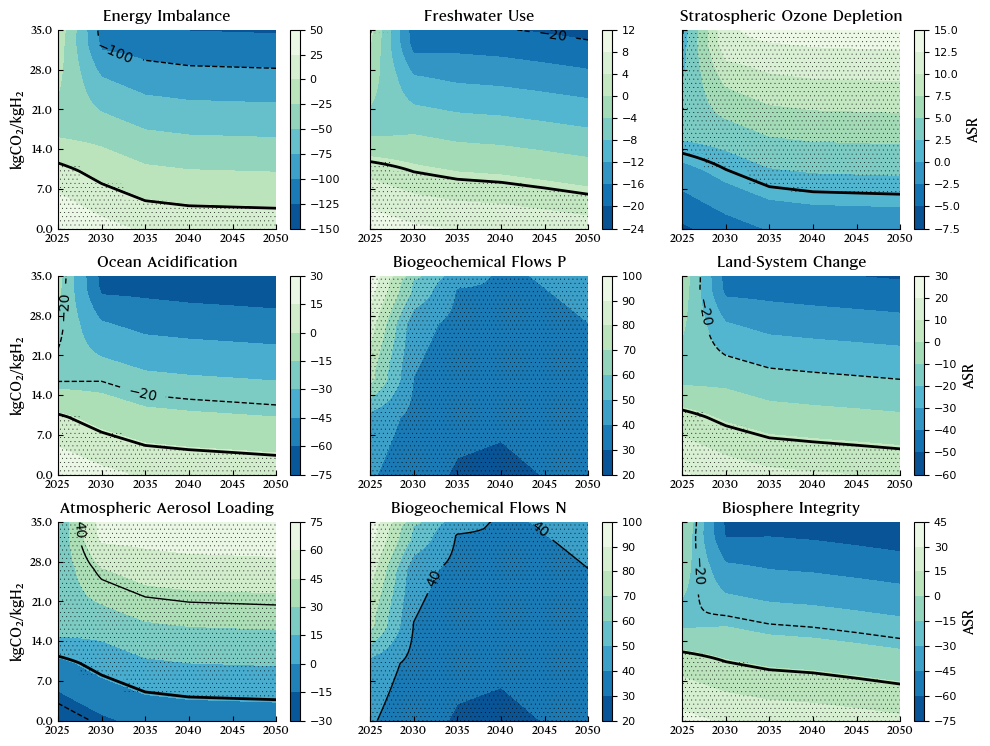

In [169]:
# function 
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]

for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in e_bio, y in 1:6],cmap="GnBu_r")


    mask_int = Int.([z[y][i] for z in e_bio, y in 1:6] .> 1)

    # c) overlay hatch on that mask
    axs[ind].contourf(
        mask_int,
        [0.5, 1.5];
        hatches=["...."],
        colors="none",
    )

    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("kgCO₂/kgH₂", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)

    axs[ind].set_yticks(0:1:200)
    axs[ind].set_yticklabels(0:0.175:35,fontproperties=font_prop_ticks)


    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
    cbar.set_label("ASR", fontproperties=font_prop_labels)
    end
end

axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))

range800=-1000:300:1000
for (ind,i) in zip([1,5],[1,6])
    cs_lines = axs[ind].contour([z[y][i] for z in e_bio, y in 1:6], levels=range800, linewidths=1,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10)
end

range50=-140:60:140
for (ind,i) in zip([2,3,4,6,7,8,9],[3,4,5,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in e_bio, y in 1:6], levels=range50, linewidths=1,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10)
end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in e_bio, y in 1:6], levels=[1], linewidths=2,colors="black")
    # axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end

for ax in axs
    ax.tick_params(axis="both", direction="in")
    ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end
plt.tight_layout()
plt.savefig("ASR_sens_B-PBI.svg",transparent=true)
plt.savefig("ASR_sens_B-PBI.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


Full range of interactions

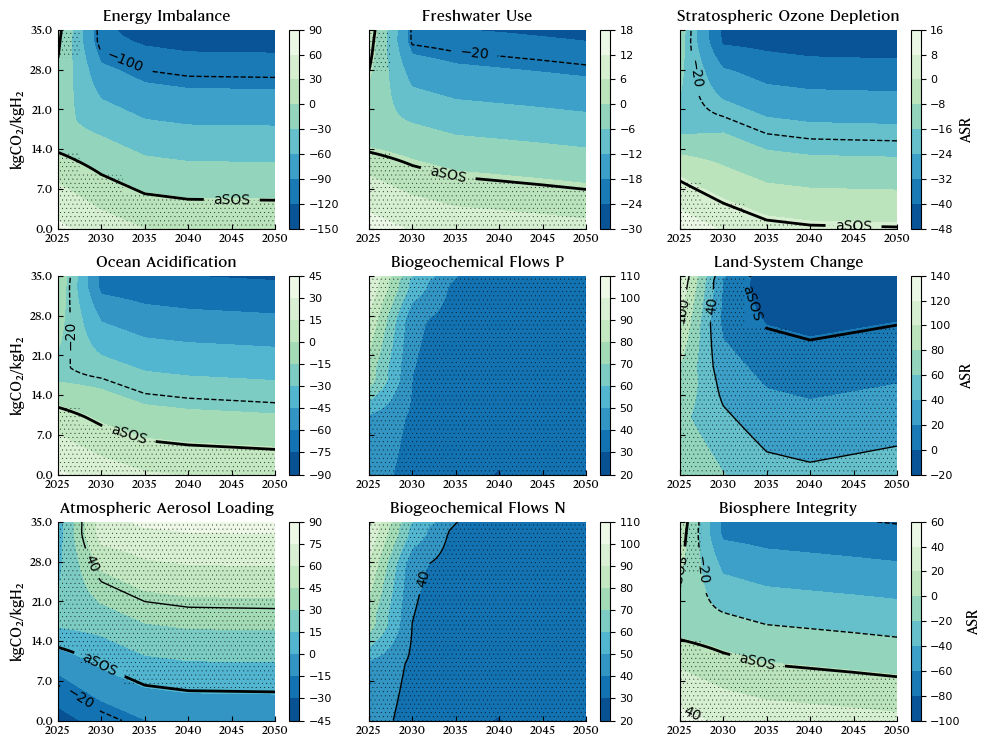

In [170]:
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]

for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in e_full, y in 1:6],cmap="GnBu_r")

        mask_int = Int.([z[y][i] for z in e_full, y in 1:6] .> 1)

    # c) overlay hatch on that mask
    axs[ind].contourf(
        mask_int,
        [0.5, 1.5];
        hatches=["...."],
        colors="none",
    )
    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("kgCO₂/kgH₂", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)

    axs[ind].set_yticks(0:1:200)
    axs[ind].set_yticklabels(0:0.175:35,fontproperties=font_prop_ticks)


    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
    cbar.set_label("ASR", fontproperties=font_prop_labels)
    end
end

range800=-1000:300:1000
for (ind,i) in zip([1,5],[1,6])
    cs_lines = axs[ind].contour([z[y][i] for z in e_full, y in 1:6], levels=range800, linewidths=1,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10)
end

range50=-140:60:140
for (ind,i) in zip([2,3,4,6,7,8,9],[3,4,5,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in e_full, y in 1:6], levels=range50, linewidths=1,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10)
end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in e_full, y in 1:6], levels=[1], linewidths=2,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end


for ax in axs
    ax.tick_params(axis="both", direction="in")
    ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end

axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=false, nbins=5))

plt.tight_layout()
# plt.savefig(respath*"Sensitivity/ASR_sens_H-PBI.svg",transparent=true)
# plt.savefig(respath*"Sensitivity/ASR_sens_H-PBI.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


#### ***3.4.4.2 Varying the electrolysis capacity: Hydroelectricity***

In [171]:
share = 1#0.8
cc=[12.440041460692076, 9.114176367405518, 6.1845798118322435, 5.552224525594005, 5.190001594642003, 4.891963004305533].*share
nmax=2
pt=500


500

In [172]:
h_bio=[opti(result_format=:ASR,asos=:median,interactions=:biophysical,
        c_electrolysis=c_electrolysis*y,
        c_nuclear_electricity=c_nuclear_electricity,
        c_wind_electricity=c_wind_electricity,
        c_hydro_electricity=c_hydro_electricity*1e60,
        c_solar_electricity=c_solar_electricity,
        c_solar_PV_electricity=c_solar_PV_electricity,
        C_PEM=ones(size(c_electrolysis)),#C_PEM,
        C_AEC=C_AEC,
        C_SOEC=C_SOEC,
        CCS=hcat(cc,cc,cc)
        )[:,1] for y in 1:(nmax-1)/pt:nmax];


In [173]:
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]
sax=nothing
for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in h_bio, y in 1:6],cmap="GnBu_r")

    mask_int = Int.([z[y][i] for z in h_full, y in 1:6] .> 1)

    # c) overlay hatch on that mask
    axs[ind].contourf(
        mask_int,
        [0.5, 1.5];
        hatches=["...."],
        colors="none",
    )
    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("over capacity factor [-]", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)
    axs[ind].set_yticks(0:1:pt)
    axs[ind].set_yticklabels(1:(nmax-1)/pt:nmax,fontproperties=font_prop_ticks)

    secax = axs[ind].secondary_xaxis("top")
    secax.tick_params(axis="x", direction="in", zorder=10)
    secax.set_zorder(10)
    if ind ==1 || ind==4 || ind==7
        secax.set_xlabel("kgCO₂/kgH₂", fontproperties=font_prop, fontsize=8)
        secax.set_xticks(0:5)
        secax.set_xticklabels(round.(cc,digits=1),fontproperties=font_prop_ticks)
    else
        secax.set_xticks(0:5)
        secax.set_xticklabels([], fontproperties=font_prop_ticks)
    end
    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
        cbar.set_label("ASR", fontproperties=font_prop_labels)
        end
    end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in h_bio, y in 1:6], levels=[1], linewidths=2,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end

# sax.tick_params(axis="y", direction="out")
for ax in axs
    ax.tick_params(axis="both", direction="in")
    # ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end
axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))

plt.tight_layout()
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_B-PBI_hydroelectricity.svg",transparent=true)
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_B-PBI_hydroelectricity.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


LoadError: UndefVarError: `h_full` not defined

Sensitivity on the full range of interactions.

In [174]:
h_full=[opti(result_format=:ASR,asos=:median,interactions=:full,
        c_electrolysis=c_electrolysis*y,
        c_nuclear_electricity=c_nuclear_electricity,
        c_wind_electricity=c_wind_electricity,
        c_hydro_electricity=c_hydro_electricity*1e60,
        c_solar_electricity=c_solar_electricity,
        c_solar_PV_electricity=c_solar_PV_electricity,
        C_PEM=ones(size(c_electrolysis)),#C_PEM,
        C_AEC=C_AEC,
        C_SOEC=C_SOEC,
        CCS=hcat(cc,cc,cc)
        )[:,1] for y in 1:(nmax-1)/pt:nmax];


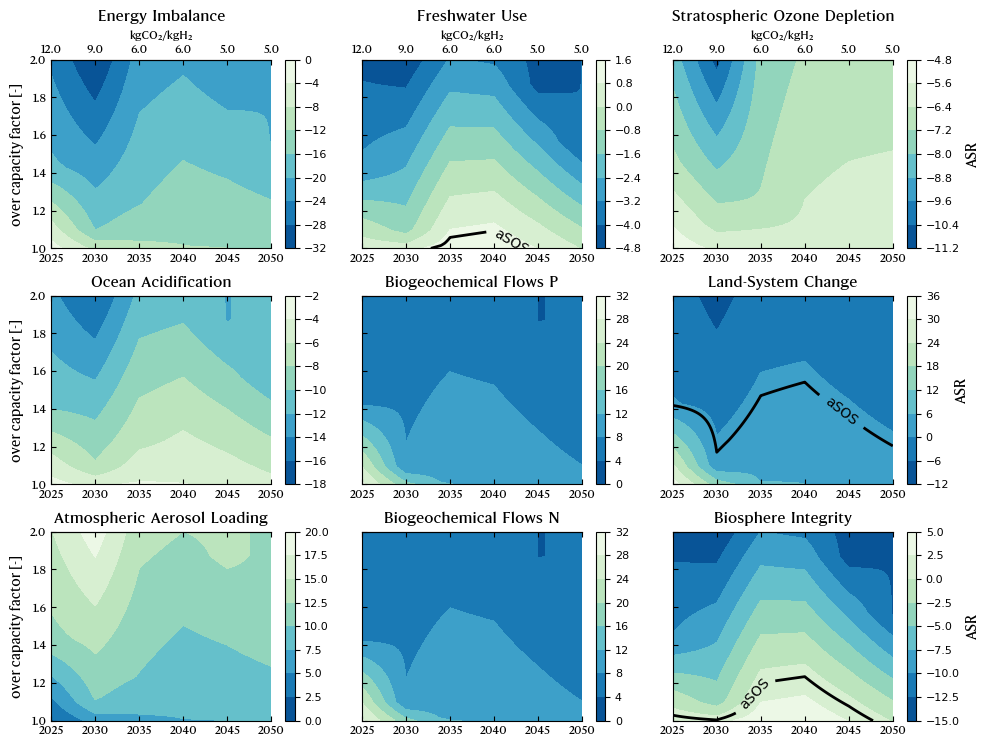

In [175]:
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]
sax=nothing

for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in h_full, y in 1:6],cmap="GnBu_r")
    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("over capacity factor [-]", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)
    axs[ind].set_yticks(0:1:pt)
    axs[ind].set_yticklabels(1:(nmax-1)/pt:nmax,fontproperties=font_prop_ticks)

    secax = axs[ind].secondary_xaxis("top")
    secax.tick_params(axis="x", direction="in", zorder=10)
    secax.set_zorder(10)
    if ind ==1 || ind==4 || ind==7
        secax.set_xlabel("kgCO₂/kgH₂", fontproperties=font_prop, fontsize=8)
        secax.set_xticks(0:5)
        secax.set_xticklabels(round.(cc),fontproperties=font_prop_ticks)
    else
        secax.set_xticks(0:5)
        secax.set_xticklabels([], fontproperties=font_prop_ticks)
    end
    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
        cbar.set_label("ASR", fontproperties=font_prop_labels)
        end
    end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in h_full, y in 1:6], levels=[1], linewidths=2,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end

# sax.tick_params(axis="y", direction="out")
for ax in axs
    ax.tick_params(axis="both", direction="in")
    # ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end

axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))


plt.tight_layout()
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_H-PBI_hydroelectricity.svg",transparent=true)
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_H-PBI_hydroelectricity.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


#### ***3.4.4.3 Varying the electrolysis capacity: nuclear***

Sensitivity on the biophysical scenario

In [176]:
share = 1#0.8
cc=[12.440041460692076, 9.114176367405518, 6.1845798118322435, 5.552224525594005, 5.190001594642003, 4.891963004305533].*share
nmax=2
pt=500


500

In [177]:
h_bio=[opti(result_format=:ASR,asos=:median,interactions=:biophysical,
        c_electrolysis=c_electrolysis*y,
        c_nuclear_electricity=c_nuclear_electricity*1e60,
        c_wind_electricity=c_wind_electricity,
        c_hydro_electricity=c_hydro_electricity,
        c_solar_electricity=c_solar_electricity,
        c_solar_PV_electricity=c_solar_PV_electricity,
        C_PEM=ones(size(c_electrolysis)),#C_PEM,
        C_AEC=C_AEC,
        C_SOEC=C_SOEC,
        CCS=hcat(cc,cc,cc)
        )[:,1] for y in 1:(nmax-1)/pt:nmax];


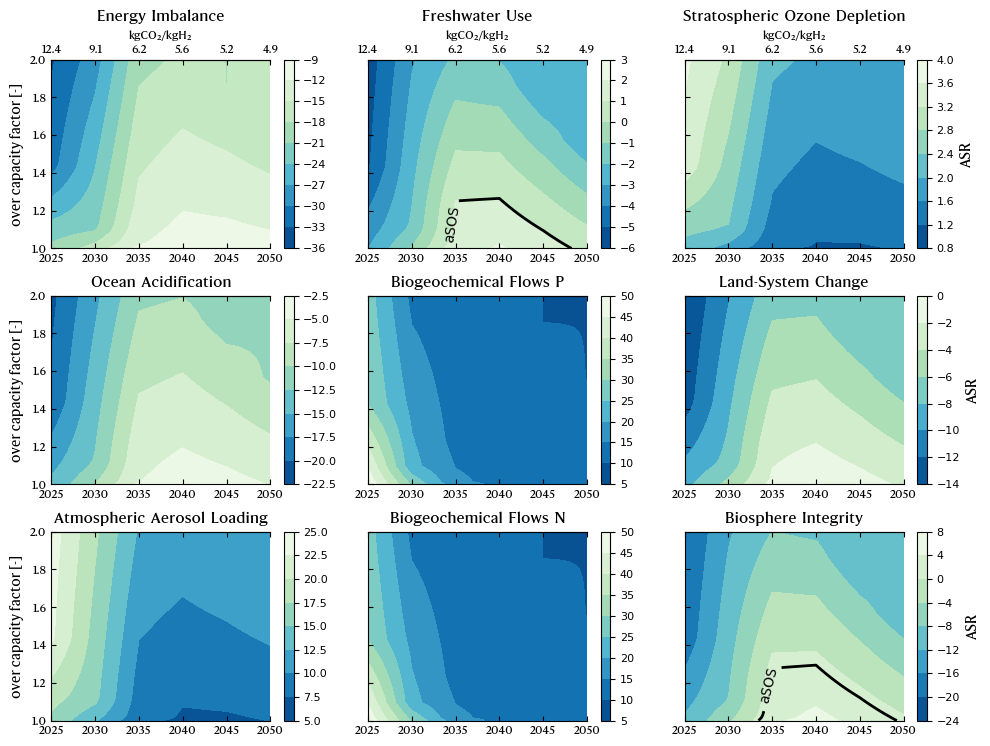

In [178]:
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]
sax=nothing
for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in h_bio, y in 1:6],cmap="GnBu_r")
    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("over capacity factor [-]", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)
    axs[ind].set_yticks(0:1:pt)
    axs[ind].set_yticklabels(1:(nmax-1)/pt:nmax,fontproperties=font_prop_ticks)

    secax = axs[ind].secondary_xaxis("top")
    secax.tick_params(axis="x", direction="in", zorder=10)
    secax.set_zorder(10)
    if ind ==1 || ind==4 || ind==7
        secax.set_xlabel("kgCO₂/kgH₂", fontproperties=font_prop, fontsize=8)
        secax.set_xticks(0:5)
        secax.set_xticklabels(round.(cc,digits=1),fontproperties=font_prop_ticks)
    else
        secax.set_xticks(0:5)
        secax.set_xticklabels([], fontproperties=font_prop_ticks)
    end
    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
        cbar.set_label("ASR", fontproperties=font_prop_labels)
        end
    end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in h_bio, y in 1:6], levels=[1], linewidths=2,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end

# sax.tick_params(axis="y", direction="out")
for ax in axs
    ax.tick_params(axis="both", direction="in")
    # ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end
axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))

plt.tight_layout()
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_B-PBI_nuclear.svg",transparent=true)
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_B-PBI_nuclear.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


Sensitivity on the full range of interactions.

In [179]:
h_full=[opti(result_format=:ASR,asos=:median,interactions=:full,
        c_electrolysis=c_electrolysis*y,
        c_nuclear_electricity=c_nuclear_electricity*1e60,
        c_wind_electricity=c_wind_electricity,
        c_hydro_electricity=c_hydro_electricity,
        c_solar_electricity=c_solar_electricity,
        c_solar_PV_electricity=c_solar_PV_electricity,
        C_PEM=ones(size(c_electrolysis)),#C_PEM,
        C_AEC=C_AEC,
        C_SOEC=C_SOEC,
        CCS=hcat(cc,cc,cc)
        )[:,1] for y in 1:(nmax-1)/pt:nmax];


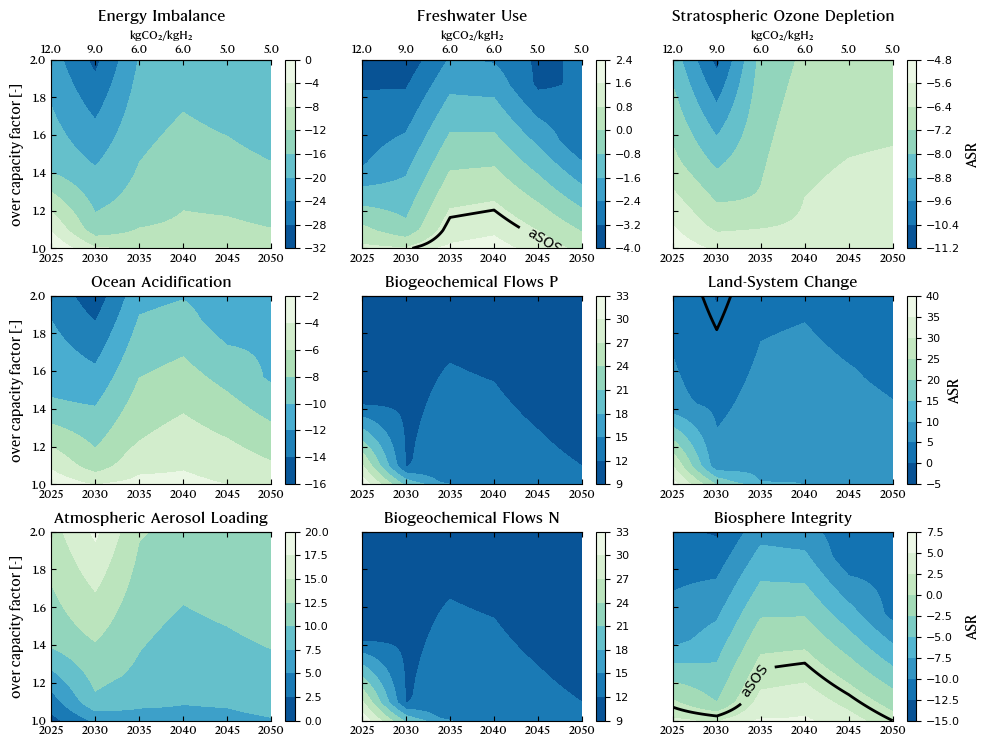

In [180]:
fig, axs = plt.subplots(3,3,figsize=(10,7.5), sharey=true)
contour_vals=[-100,1,10,100,200,300,400,500]
sax=nothing

for (ind,(i,tit)) in enumerate(zip([1,3,4,5,6,7,8,9,10],categories[Not(2)]))
    cs = axs[ind].contourf([z[y][i] for z in h_full, y in 1:6],cmap="GnBu_r")
    if ind ==1 || ind==2 || ind==3
        axs[ind].set_ylabel("over capacity factor [-]", fontproperties=font_prop_labels)
    end
    axs[ind].set_title(tit, fontproperties=font_prop_titles) 
    axs[ind].set_xticks(0:5)
    axs[ind].set_xticklabels(2025:5:2050,fontproperties=font_prop_ticks)
    axs[ind].set_yticks(0:1:pt)
    axs[ind].set_yticklabels(1:(nmax-1)/pt:nmax,fontproperties=font_prop_ticks)

    secax = axs[ind].secondary_xaxis("top")
    secax.tick_params(axis="x", direction="in", zorder=10)
    secax.set_zorder(10)
    if ind ==1 || ind==4 || ind==7
        secax.set_xlabel("kgCO₂/kgH₂", fontproperties=font_prop, fontsize=8)
        secax.set_xticks(0:5)
        secax.set_xticklabels(round.(cc),fontproperties=font_prop_ticks)
    else
        secax.set_xticks(0:5)
        secax.set_xticklabels([], fontproperties=font_prop_ticks)
    end
    cbar = fig.colorbar(cs, ax=axs[ind])
    if ind ==7 || ind==8 || ind==9
        cbar.set_label("ASR", fontproperties=font_prop_labels)
        end
    end

for (ind,i) in enumerate([1,3,4,5,6,7,8,9,10])
    cs_lines = axs[ind].contour([z[y][i] for z in h_full, y in 1:6], levels=[1], linewidths=2,colors="black")
    axs[ind].clabel(cs_lines, inline=1, fontsize=10,fmt=Dict(1=> "aSOS"))
end

# sax.tick_params(axis="y", direction="out")
for ax in axs
    ax.tick_params(axis="both", direction="in")
    # ax.spines["top"].set_visible(false)
    ax.spines["right"].set_visible(false)
end

axs[1,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[2,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))
axs[3,1].yaxis.set_major_locator(tkr.MaxNLocator(integer=true, nbins=6))


plt.tight_layout()
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_H-PBI_nuclear.svg",transparent=true)
# plt.savefig(respath*"Sensitivity/ASR_electrolysis_H-PBI_nuclear.pdf",transparent=true)
display(plt.gcf())
plt.close("all")


# **References**

# **Acknowledgments**

In [181]:
Saving.(𝐏) #function to save the computed values.


[ Info: Project natcom_REMIND_1.9_1_2025 saved
[ Info: Project natcom_REMIND_1.9_1_2030 saved
[ Info: Project natcom_REMIND_1.9_1_2035 saved
[ Info: Project natcom_REMIND_1.9_1_2040 saved
[ Info: Project natcom_REMIND_1.9_1_2045 saved
[ Info: Project natcom_REMIND_1.9_1_2050 saved
[ Info: Project natcom_REMIND_1.9_2_2025 saved
[ Info: Project natcom_REMIND_1.9_2_2030 saved
[ Info: Project natcom_REMIND_1.9_2_2035 saved
[ Info: Project natcom_REMIND_1.9_2_2040 saved
[ Info: Project natcom_REMIND_1.9_2_2045 saved
[ Info: Project natcom_REMIND_1.9_2_2050 saved
[ Info: Project natcom_REMIND_1.9_5_2025 saved
[ Info: Project natcom_REMIND_1.9_5_2030 saved
[ Info: Project natcom_REMIND_1.9_5_2035 saved
[ Info: Project natcom_REMIND_1.9_5_2040 saved
[ Info: Project natcom_REMIND_1.9_5_2045 saved
[ Info: Project natcom_REMIND_1.9_5_2050 saved


6×3 Matrix{Nothing}:
 nothing  nothing  nothing
 nothing  nothing  nothing
 nothing  nothing  nothing
 nothing  nothing  nothing
 nothing  nothing  nothing
 nothing  nothing  nothing

In [182]:
# Material requirements
# SC_Ir is the specific iridium consumption (kg_ir/kg_H2), and s_PEM is the required scale of hydrogen production from PEM electrolysis (kg_H2). 
# █(〖Cons〗_k=(s_PEM SC_Ir)/1000  [t_Ir ]#(17) )
# Make the figure. 
